In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader

import torchvision.transforms as transforms
import torchvision.utils
from torchvision.utils import make_grid

import torchvision.datasets

import matplotlib.pyplot as plt 
plt.rcParams["figure.figsize"] = (10,6)

from tqdm import tqdm 

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

# Introduction to GANs

In this notebook you will build a GAN from scratch, grossly following the DCGAN architecture. 

**Goals:**


1.   Build a GAN arhictecture from scratch
2.   Write the GAN loss function and train GAN from scratch
3.   Have experience with some of the instability problems inherent with training GANs.
4.   [Bonus] Extend the unconditional GAN into a conditional GAN. 



## 1. Getting Started

We will work with the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset. It contains 60,000 images size 28x28 of handwritten digits, from 0 to 9.

## 1. Dataloading

### 1.1 Define some hyperparameters and transforms


In [ ]:
batch_size = 128 # Images per batch

# Resize to 32x32 for easier upsampling/downsampling
mytransform = transforms.Compose([
                                  transforms.ToTensor(),
                                  transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                                  ]) # normalize between [-1, 1] with tanh activation

cifar_train = torchvision.datasets.CIFAR10(root='.', download=True, transform=mytransform)

  0%|          | 0/170498071 [00:00<?, ?it/s]

Extracting ./cifar-10-python.tar.gz to .


In [ ]:
dataloader = DataLoader( dataset=cifar_train, 
                         batch_size=batch_size,
                         shuffle=True)    

In [ ]:
# plot some images
real_batch, real_labels = next(iter(dataloader))

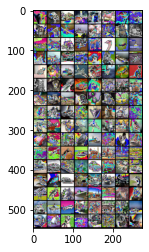

In [ ]:
plt.imshow(transforms.ToPILImage()(make_grid(real_batch)))

## 2. Model Architecture

We will follow the general architecture of a DCGAN - or deep convolutional GAN. This [influential paper](https://arxiv.org/pdf/1511.06434v2.pdf) produced much of the foundation for modern GANs and how to train them.

(GANs are notoriously **hard** to train, we will try to get a feeling why in this notebook.)


Complete the function `get_upscaling_block`. Then, use the function to define our model defined as follows:

Input: Random "noise" $z$ shaped `[n_batch, n_z]`

Output: Generated image size `[n_batch, 1, 32, 32]` in range [-1, 1]

1. Reshape z into `[n_batch, n_z, 1, 1]` to make it into an "image"
2. First upscaling block $\rightarrow$ `[n_batch, ngf*4, 4, 4]`
3. Second upscaling block $\rightarrow$ `[n_batch, ngf*2, 8, 8]`
4. Third upscaling block $\rightarrow$ `[n_batch, ngf, 16, 16]`
5. Fourth (and last) upscaling block $\rightarrow$ `[n_batch, 1, 32, 32]`

## 2.1. The Generator



The generator performs subsequent upsampling blocks, transforming a latent vector shaped [batch_size, latent_size] into an image (values in [-1, 1]).

The generator block will consists of:
- Transpose Convolution
- Batch Norm 
- ReLU

In [ ]:

def get_upscaling_block(channels_in, channels_out, kernel, stride = 0, padding = 0, last_layer=False):
    '''
    Each transpose conv will be followed by BatchNorm and ReLU, 
    except the last block (which is only followed by tanh)
    '''
    if last_layer:
      return nn.Sequential(
                     nn.ConvTranspose2d(channels_in, channels_out, kernel, stride=stride, padding = padding, bias=False),
                     nn.Tanh()
               )
        
    else:
      return nn.Sequential(
                     nn.ConvTranspose2d(channels_in, channels_out, kernel, stride=stride, padding = padding, bias=False),
                     nn.BatchNorm2d(channels_out),
                     nn.ReLU()
               )
      
       

class Generator(nn.Module):
    def __init__(self, nz, ngf, nchannels=1):
        '''
        nz: The latent size (100 in our case)
        ngf: The channel-size before the last layer (32 our case)
        '''
        super().__init__()
        self.model = nn.Sequential(
            get_upscaling_block(nz, ngf*4, 4,stride= 1, padding = 0),
            get_upscaling_block(ngf*4, ngf*2, 4,stride= 2, padding = 1),
            get_upscaling_block(ngf*2, ngf, 4,stride = 2,  padding = 1), 
            get_upscaling_block(ngf, nchannels, 4, stride = 2, padding = 1, last_layer = True)         
        )
        
        ###################
        
    def forward(self, z):
        x = z.unsqueeze(2).unsqueeze(2) # give spatial dimensions to z
        return self.model(x)
        

### 2.1.3. Sanity Tests

In [ ]:
nz = 1000
z = torch.randn(batch_size, nz)

In [ ]:
# G = Generator(nz=nz, ngf=16)
# assert G(z).shape == (batch_size, 1, 32, 32)

G = Generator(nz=nz, ngf=16, nchannels=3)
print(G(z).shape == (batch_size, 3, 32, 32))

True


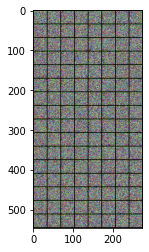

In [ ]:
# visualize the output - at first it should just look like random noise!!
x_fake = G(z)
plt.imshow(transforms.ToPILImage()(make_grid(x_fake, nrow=8)))

## 2.2. The discriminator

The discriminator will be a mirror image of the generator. 

The discriminator will also use a fully convolutional architecutre, with each block consisting of:
- Conv layer
- BatchNorm
- ReLU

Complete the function `get_downscaling_block` and then use it to define the following architecture for the discriminator:

Input: Image shaped `[n_batch, 1, 32, 32]` (in [-1, 1])
Output: Discriminator scores `[n_batch, 1]` in range [0, 1]

1. First downscaling block $\rightarrow$ `[n_batch, ndf, 16, 16]`
2. Second downscaling block $\rightarrow$ `[n_batch, ndf*2, 8, 8]`
3. Third downscaling block $\rightarrow$ `[n_batch, ndf*4, 4, 4]`
4. Last downscaling block $\rightarrow$ `[n_batch, 1]` 

In [ ]:
def get_downscaling_block(channels_in, channels_out, kernel, stride = 0, padding = 0, use_batch_norm=True, is_last=False):
    
    if is_last:
      return nn.Sequential(
                     nn.Conv2d(channels_in, channels_out, kernel, stride=stride, padding = padding, bias=False),
                     nn.Sigmoid()
             )
    
    elif not use_batch_norm:

      return nn.Sequential(
                     nn.Conv2d(channels_in, channels_out, kernel, stride=stride, padding = padding, bias=False),
                     nn.LeakyReLU(0.2)
            )
    
    else:
      return nn.Sequential(
                     nn.Conv2d(channels_in, channels_out, kernel, stride=stride, padding = padding, bias=False),
                     nn.BatchNorm2d(channels_out),
                     nn.LeakyReLU(0.2)
            )
        
class Discriminator(nn.Module):
    def __init__(self, ndf, nchannels=1):
        super().__init__()
        self.model = nn.Sequential(
            get_downscaling_block(nchannels, ndf, 4,stride= 2, padding = 1),
            get_downscaling_block(ndf, ndf*2, 4,stride= 2, padding = 1),
            get_downscaling_block(ndf*2, ndf*4, 4,stride = 2,  padding = 1), 
            get_downscaling_block(ndf*4, 1, 4, stride = 1, padding = 0, is_last = True)         
        )
        

    def forward(self, x):
        return self.model(x).squeeze(1).squeeze(1) # remove spatial dimensions

### 2.2.3 Sanity Checking

In [ ]:
real_batch, real_labels = next(iter(dataloader))
real_batch.shape

torch.Size([128, 3, 32, 32])

In [ ]:
D = Discriminator(ndf=32, nchannels=3)
assert D(real_batch).shape == (real_batch.shape[0], 1)

# 3. Training

## 3.1 Loss 
The essential thing to remember is that the logistic and the non-saturating logistic GAN losses can be written exclusively using the [binary cross entropy loss](https://pytorch.org/docs/stable/generated/torch.nn.BCELoss.html). Our GAN loss will be defined ONLY using the following criterion:



In [ ]:
criterion = nn.BCELoss() # we will build off of this to make our final GAN loss!

## 3.2 Helper functions

We will need a few helper functions. 
1. First, we need to continuously sample z from a Gaussian distribution. 
2. Secondly, we need to make our "ground-truth" labels when using the BCE loss. This should output vectors of either 0s or 1s. 

In [ ]:
def sample_z(batch_size, nz):
    return torch.randn(batch_size, nz, device=device)

# this is for the real ground-truth label
def get_labels_one(batch_size):
    r = torch.ones(batch_size, 1)
    return r.to(device)

# this is for the generated ground-truth label
def get_labels_zero(batch_size):
    r = torch.zeros(batch_size, 1) 
    return r.to(device)


# To initialize the weights of a GAN, the DCGAN paper found that best results are obtained
# with Gaussian initialization with mean=0; std=0.02
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)
        

# for visualization
to_pil = transforms.ToPILImage()
renorm = transforms.Normalize((-1.), (2.))

## 3.3 Creating the optimizers and hyperparameters

The original DCGAN paper shows that Adam works well in the generator and the discriminator with a learning rate of 0.0002 and Beta1 = 0.5.

Define your optimizers

## 3.3 Training!

Now for the fun part, training! 
Training a GAN consists in making an update to the discriminator, then the generator.
Training a GAN requires BABYSITTING!! Remember that many things can go wrong when training a GAN:
- The discriminator is too strong for the generator - the generator cannot improve. 
- The generator easily fools the discriminator - cannot learn.
- Mode collapse - generator is not capable of generating diverse images.

it: 0; g_loss: 1.1911497116088867; d_loss: 0.8156622648239136; avg_real_score: 0.35011857748031616; avg_fake_score: 0.3208215534687042: : 0it [00:00, ?it/s]

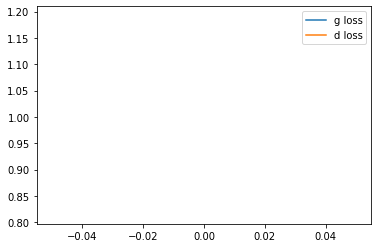

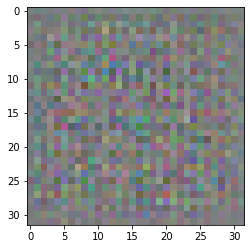

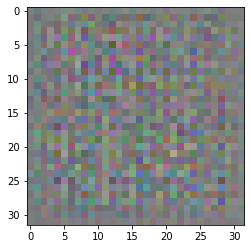

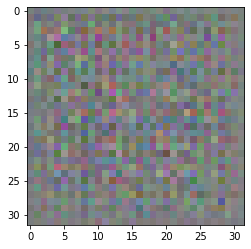

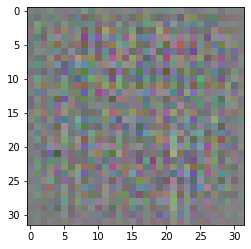

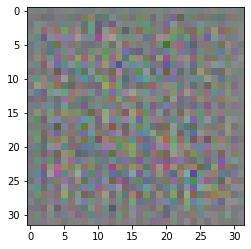

it: 200; g_loss: 1.0695542097091675; d_loss: 0.6491634845733643; avg_real_score: 0.526586651802063; avg_fake_score: 0.3512078821659088: : 199it [00:10, 20.28it/s]

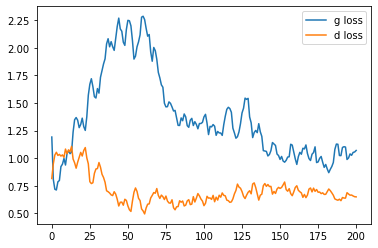

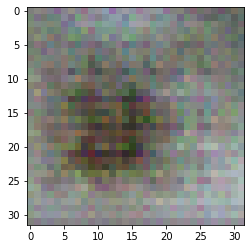

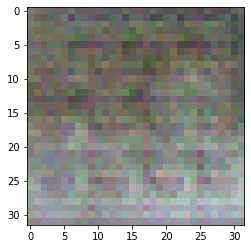

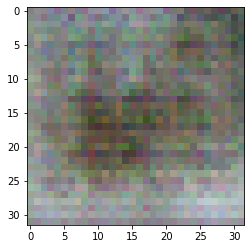

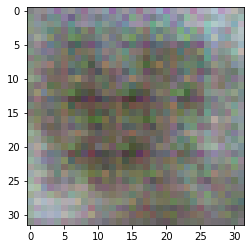

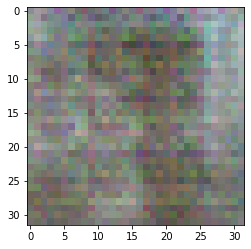

it: 390; g_loss: 1.0088118314743042; d_loss: 0.6740779280662537; avg_real_score: 0.4840148091316223; avg_fake_score: 0.37669429183006287: : 391it [00:21, 18.34it/s]
it: 391; g_loss: 0.9975336790084839; d_loss: 0.6540372371673584; avg_real_score: 0.5046751499176025; avg_fake_score: 0.3813347816467285: : 0it [00:00, ?it/s]

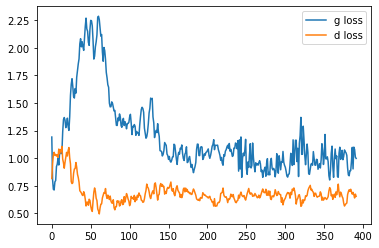

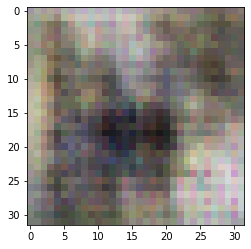

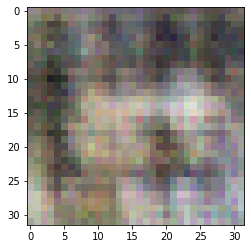

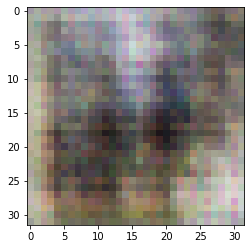

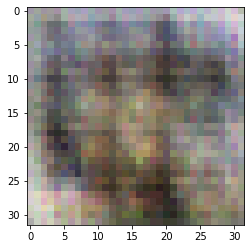

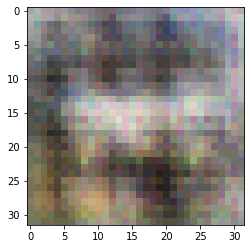

it: 591; g_loss: 0.9312395453453064; d_loss: 0.6696339845657349; avg_real_score: 0.549872636795044; avg_fake_score: 0.40006324648857117: : 199it [00:10, 18.80it/s]

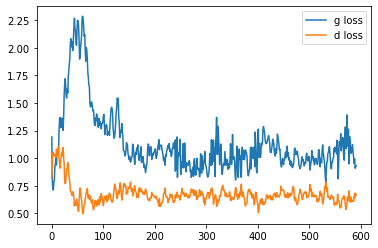

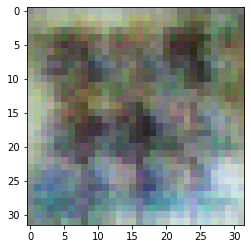

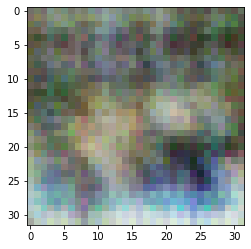

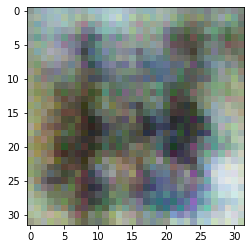

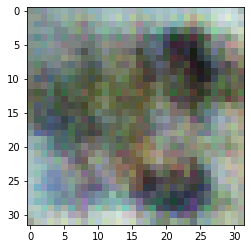

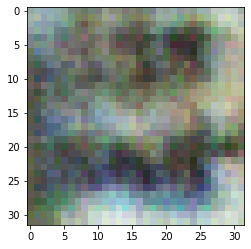

it: 781; g_loss: 1.2348839044570923; d_loss: 0.5756292343139648; avg_real_score: 0.576164722442627; avg_fake_score: 0.3092983663082123: : 391it [00:21, 18.19it/s]
it: 782; g_loss: 1.138789415359497; d_loss: 0.623324990272522; avg_real_score: 0.5420365333557129; avg_fake_score: 0.3364853858947754: : 0it [00:00, ?it/s]

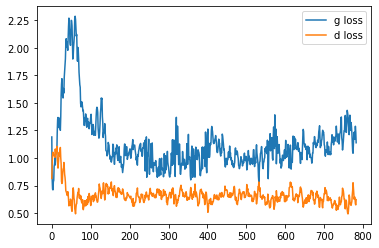

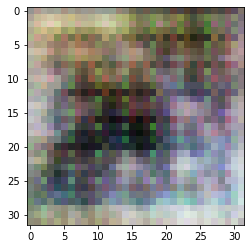

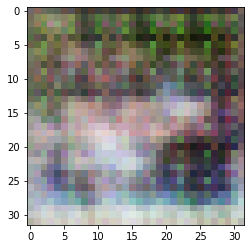

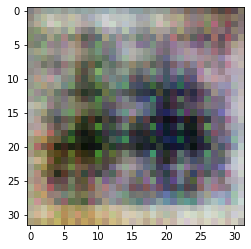

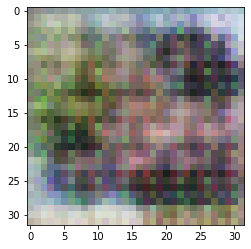

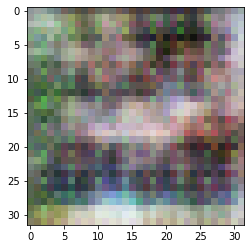

it: 982; g_loss: 1.5358741283416748; d_loss: 0.6848601698875427; avg_real_score: 0.4760044813156128; avg_fake_score: 0.23016172647476196: : 200it [00:11, 19.18it/s]

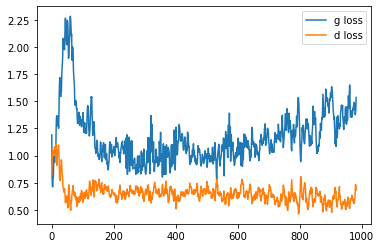

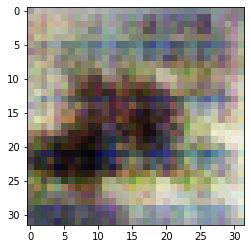

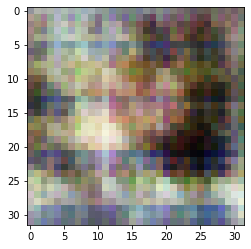

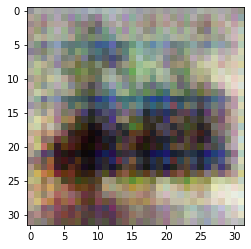

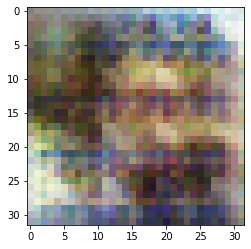

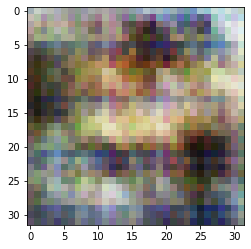

it: 1172; g_loss: 1.2541593313217163; d_loss: 0.537627100944519; avg_real_score: 0.5729163885116577; avg_fake_score: 0.2985723614692688: : 391it [00:22, 17.42it/s]
it: 1173; g_loss: 1.1996090412139893; d_loss: 0.5348303318023682; avg_real_score: 0.5871183276176453; avg_fake_score: 0.31522050499916077: : 0it [00:00, ?it/s]

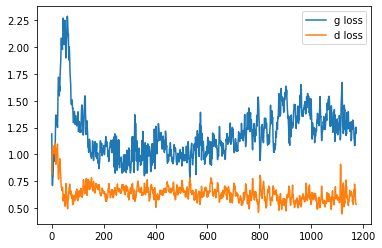

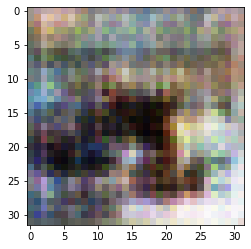

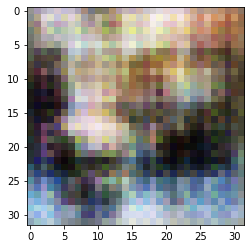

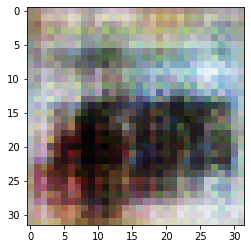

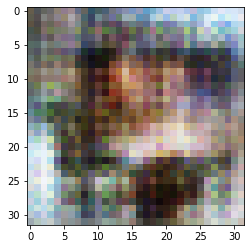

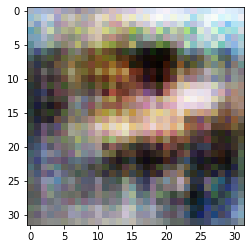

it: 1373; g_loss: 1.2465288639068604; d_loss: 0.5732436776161194; avg_real_score: 0.5794976949691772; avg_fake_score: 0.30929821729660034: : 200it [00:11, 19.12it/s]

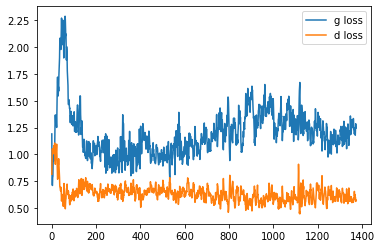

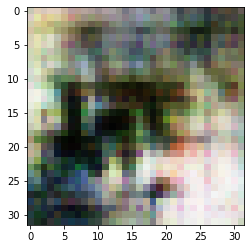

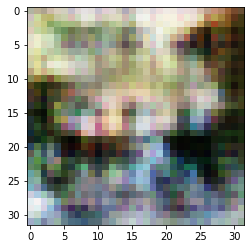

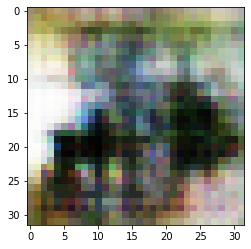

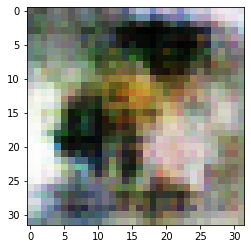

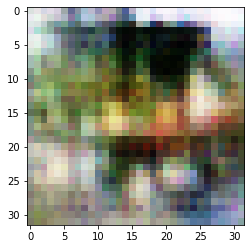

it: 1563; g_loss: 1.4028500318527222; d_loss: 0.5734079480171204; avg_real_score: 0.6167200207710266; avg_fake_score: 0.26221439242362976: : 391it [00:22, 17.03it/s]
it: 1564; g_loss: 1.3361191749572754; d_loss: 0.5713390111923218; avg_real_score: 0.5479300022125244; avg_fake_score: 0.2846590578556061: : 0it [00:00, ?it/s]

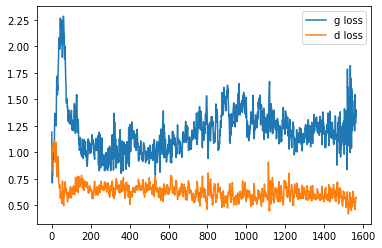

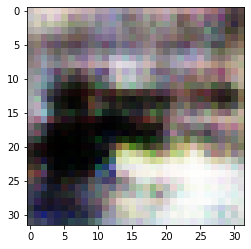

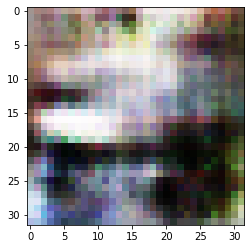

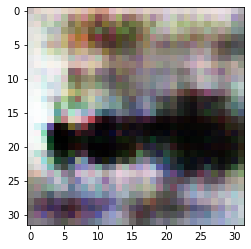

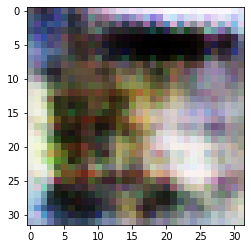

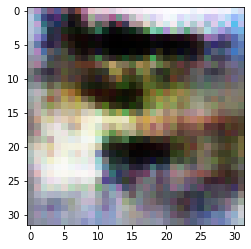

it: 1764; g_loss: 1.1229162216186523; d_loss: 0.7080290913581848; avg_real_score: 0.48188352584838867; avg_fake_score: 0.3521573543548584: : 199it [00:11, 18.79it/s]

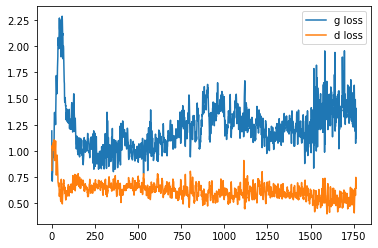

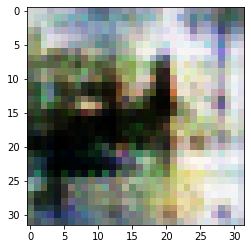

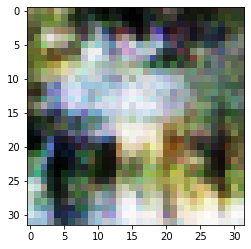

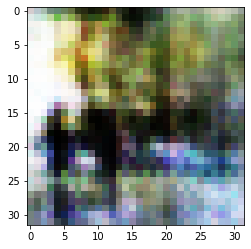

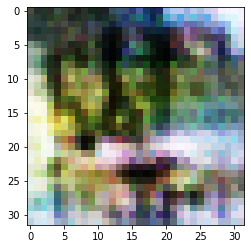

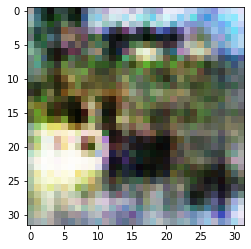

it: 1954; g_loss: 1.3048181533813477; d_loss: 0.5297536849975586; avg_real_score: 0.6269963979721069; avg_fake_score: 0.2959403991699219: : 391it [00:23, 16.99it/s]
it: 1955; g_loss: 1.178529143333435; d_loss: 0.5846209526062012; avg_real_score: 0.5520104765892029; avg_fake_score: 0.3334296643733978: : 0it [00:00, ?it/s]

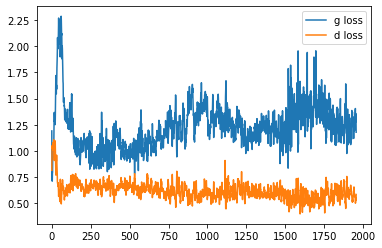

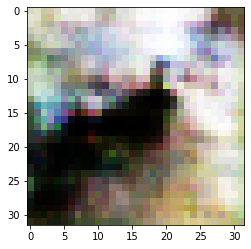

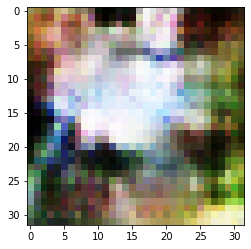

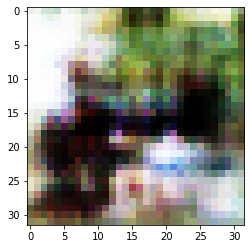

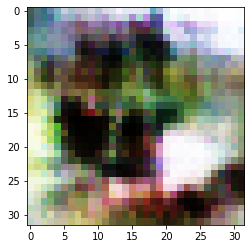

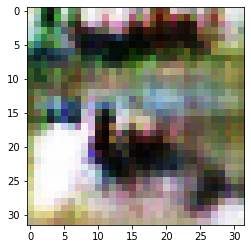

it: 2155; g_loss: 1.1905732154846191; d_loss: 0.531070351600647; avg_real_score: 0.5860705971717834; avg_fake_score: 0.3249492347240448: : 199it [00:11, 18.20it/s] 

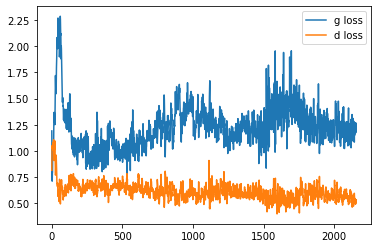

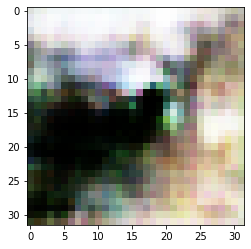

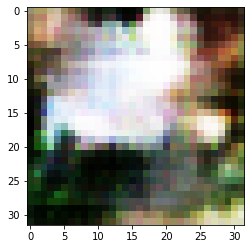

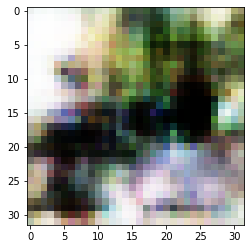

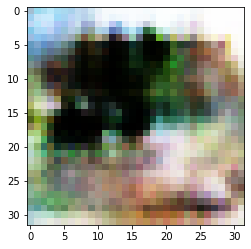

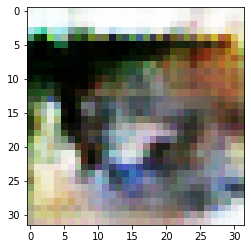

it: 2345; g_loss: 1.2889113426208496; d_loss: 0.46068274974823; avg_real_score: 0.6471804976463318; avg_fake_score: 0.2956538796424866: : 391it [00:23, 16.40it/s]
it: 2346; g_loss: 1.403559923171997; d_loss: 0.51790452003479; avg_real_score: 0.6623959541320801; avg_fake_score: 0.271756649017334: : 0it [00:00, ?it/s]

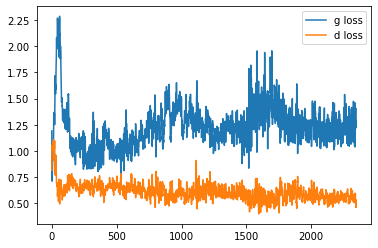

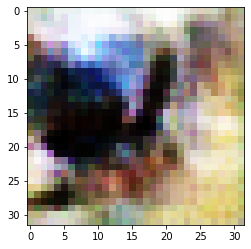

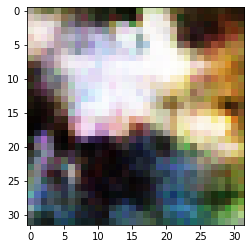

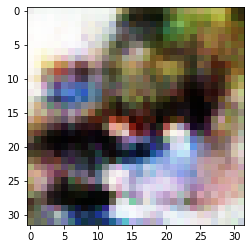

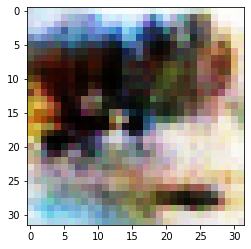

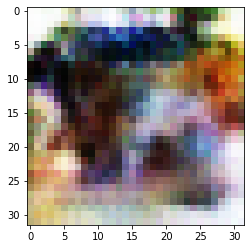

it: 2546; g_loss: 1.1600251197814941; d_loss: 0.5587767362594604; avg_real_score: 0.5440441370010376; avg_fake_score: 0.3314058482646942: : 199it [00:12, 17.60it/s]

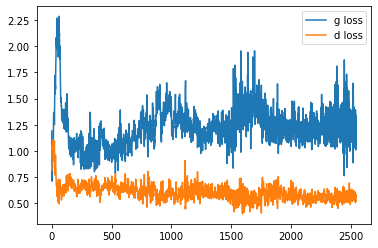

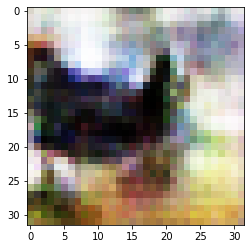

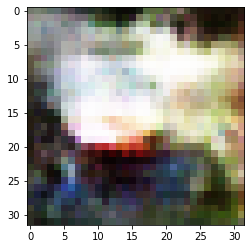

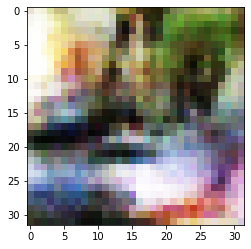

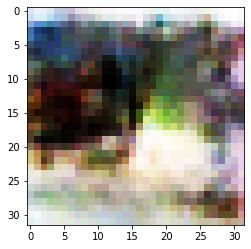

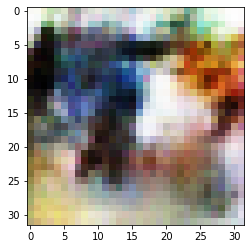

it: 2736; g_loss: 1.2347289323806763; d_loss: 0.5489295721054077; avg_real_score: 0.5772960186004639; avg_fake_score: 0.3068348467350006: : 391it [00:24, 16.14it/s]
it: 2737; g_loss: 1.0761423110961914; d_loss: 0.607498049736023; avg_real_score: 0.5631875991821289; avg_fake_score: 0.3612576723098755: : 0it [00:00, ?it/s]

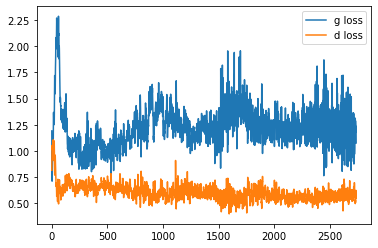

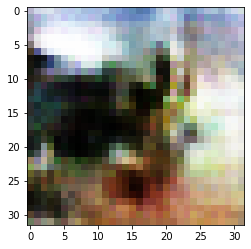

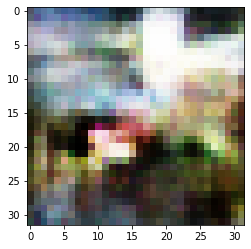

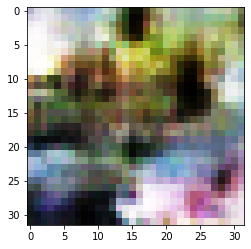

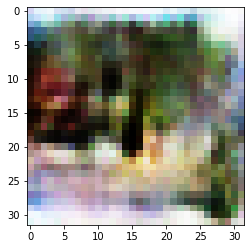

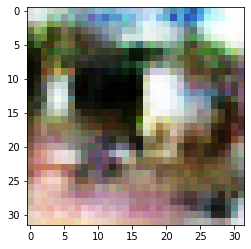

it: 2937; g_loss: 1.4192363023757935; d_loss: 0.6172113418579102; avg_real_score: 0.6638946533203125; avg_fake_score: 0.2661997675895691: : 199it [00:12, 17.08it/s] 

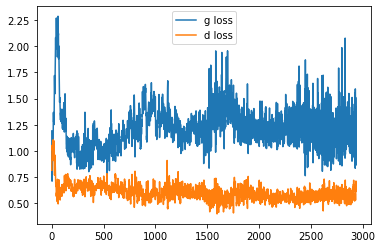

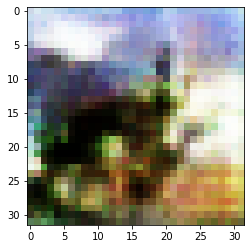

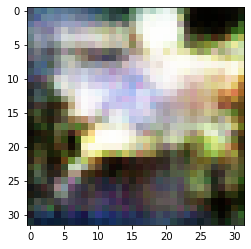

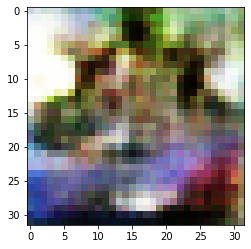

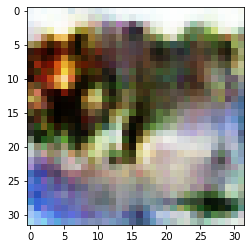

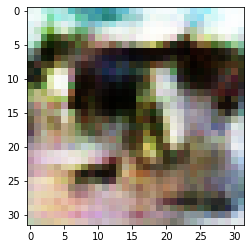

it: 3127; g_loss: 1.3192188739776611; d_loss: 0.6859555244445801; avg_real_score: 0.6579200625419617; avg_fake_score: 0.2867443859577179: : 391it [00:24, 15.74it/s]
it: 3128; g_loss: 1.0316306352615356; d_loss: 0.6191433668136597; avg_real_score: 0.48053377866744995; avg_fake_score: 0.37440112233161926: : 0it [00:00, ?it/s]

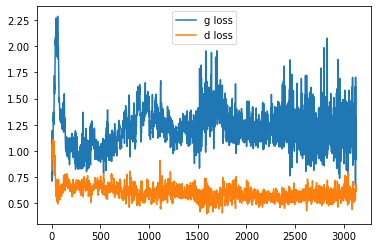

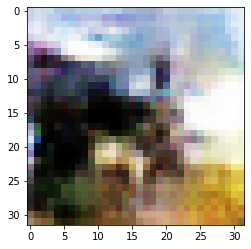

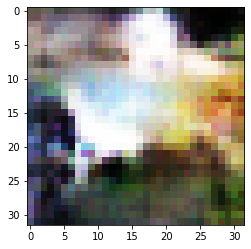

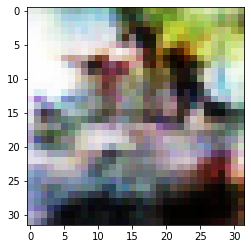

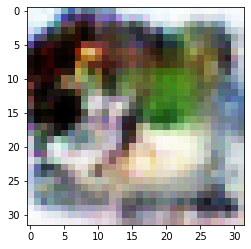

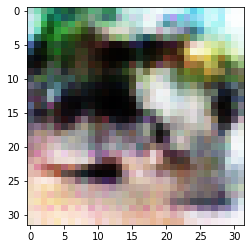

it: 3328; g_loss: 0.9033247232437134; d_loss: 0.6960827112197876; avg_real_score: 0.4439976215362549; avg_fake_score: 0.42778465151786804: : 199it [00:12, 16.98it/s]

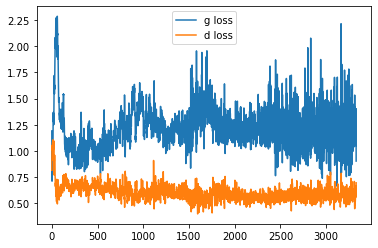

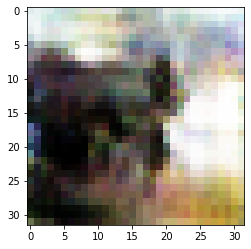

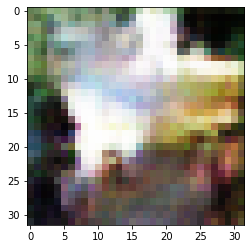

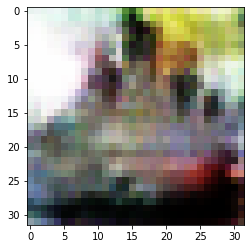

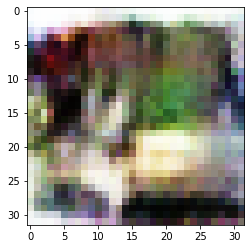

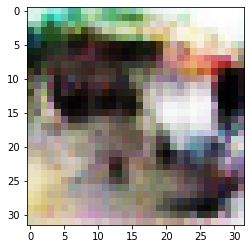

it: 3518; g_loss: 1.3778263330459595; d_loss: 0.5901955962181091; avg_real_score: 0.5782780647277832; avg_fake_score: 0.2728535532951355: : 391it [00:25, 15.44it/s]
it: 3519; g_loss: 0.9796569347381592; d_loss: 0.5506942272186279; avg_real_score: 0.5230808258056641; avg_fake_score: 0.39643439650535583: : 0it [00:00, ?it/s]

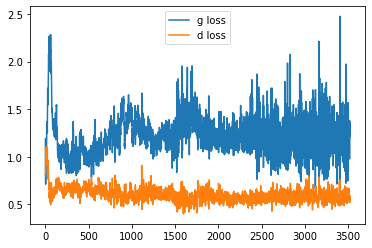

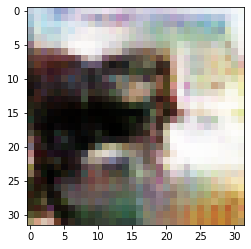

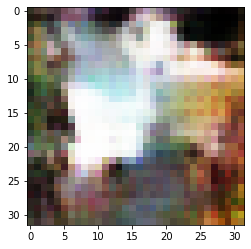

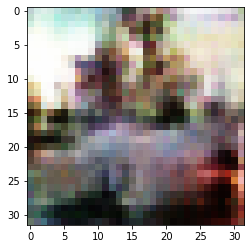

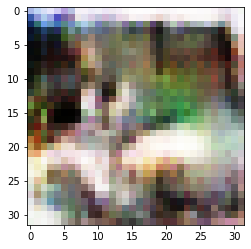

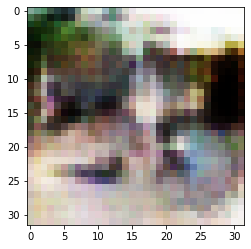

it: 3719; g_loss: 1.207615852355957; d_loss: 0.6052966117858887; avg_real_score: 0.5961870551109314; avg_fake_score: 0.3153296411037445: : 199it [00:12, 17.08it/s] 

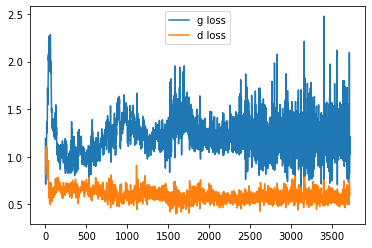

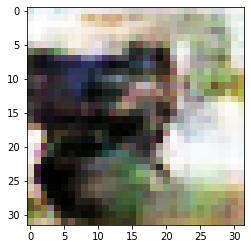

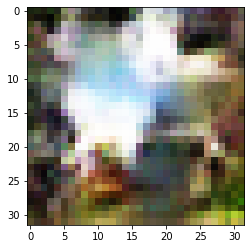

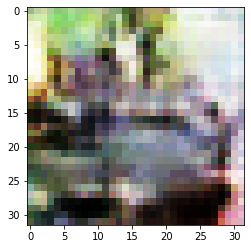

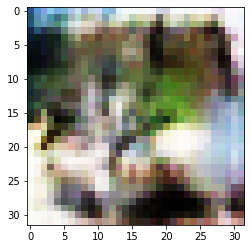

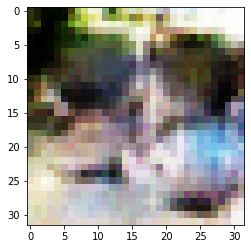

it: 3909; g_loss: 0.853489100933075; d_loss: 0.6064736843109131; avg_real_score: 0.4905647337436676; avg_fake_score: 0.4468110203742981: : 391it [00:25, 15.51it/s]
it: 3910; g_loss: 1.5309715270996094; d_loss: 0.5701409578323364; avg_real_score: 0.6905428767204285; avg_fake_score: 0.23862238228321075: : 0it [00:00, ?it/s]

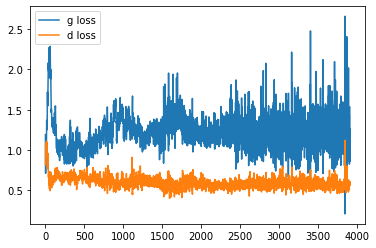

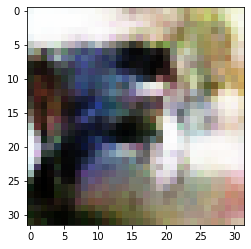

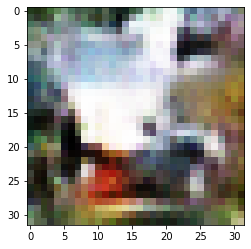

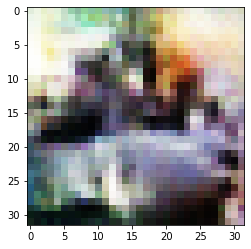

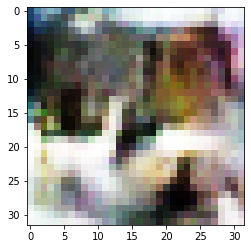

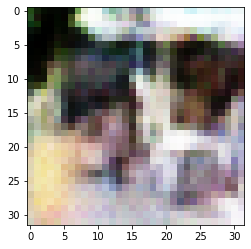

it: 4110; g_loss: 1.0775306224822998; d_loss: 0.6137898564338684; avg_real_score: 0.5288717746734619; avg_fake_score: 0.3664281368255615: : 199it [00:13, 16.00it/s]

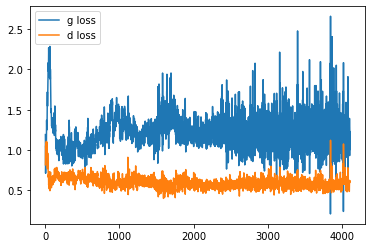

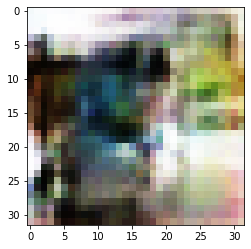

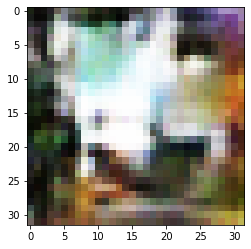

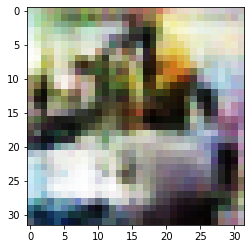

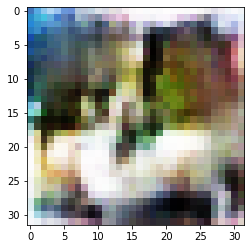

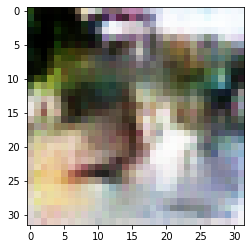

it: 4300; g_loss: 1.4160126447677612; d_loss: 0.5276874303817749; avg_real_score: 0.7032400965690613; avg_fake_score: 0.2649309039115906: : 391it [00:26, 14.93it/s]
it: 4301; g_loss: 1.4652557373046875; d_loss: 0.5016866326332092; avg_real_score: 0.6055512428283691; avg_fake_score: 0.2505553960800171: : 0it [00:00, ?it/s]

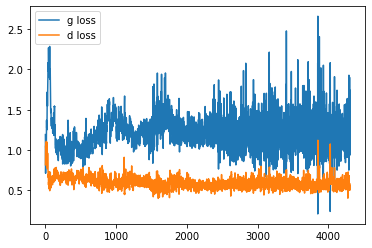

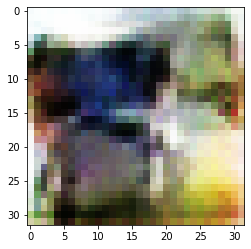

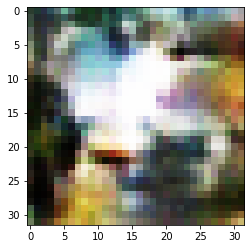

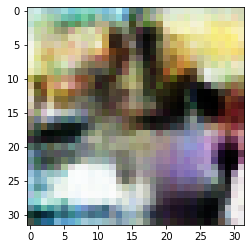

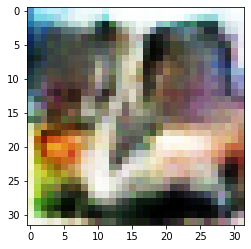

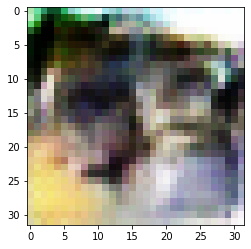

it: 4501; g_loss: 2.5935442447662354; d_loss: 0.6479665637016296; avg_real_score: 0.8144538402557373; avg_fake_score: 0.08317714929580688: : 199it [00:13, 16.67it/s]

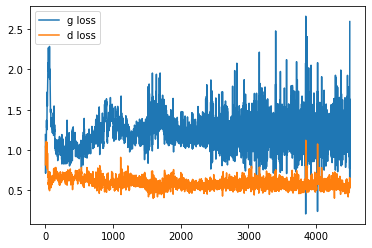

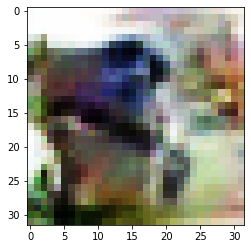

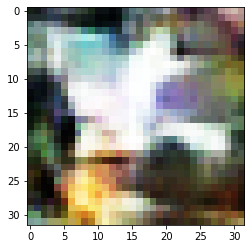

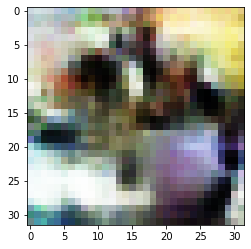

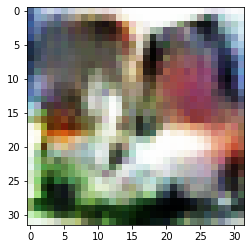

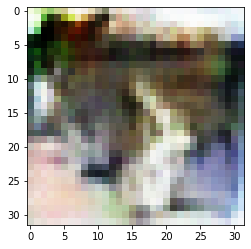

it: 4691; g_loss: 1.1646403074264526; d_loss: 0.5261692404747009; avg_real_score: 0.6206472516059875; avg_fake_score: 0.3260551989078522: : 391it [00:26, 15.04it/s]
it: 4692; g_loss: 1.3906872272491455; d_loss: 0.571956992149353; avg_real_score: 0.6100215315818787; avg_fake_score: 0.2688399851322174: : 0it [00:00, ?it/s]

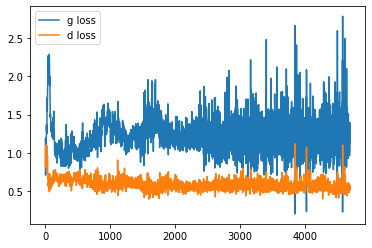

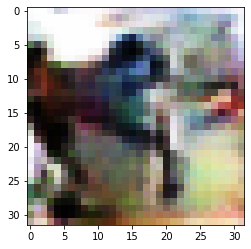

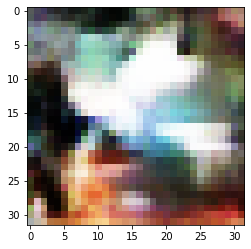

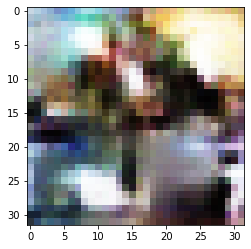

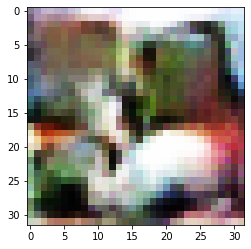

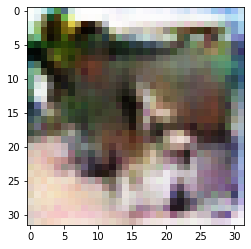

it: 4892; g_loss: 0.9524250626564026; d_loss: 0.5429018139839172; avg_real_score: 0.5221492052078247; avg_fake_score: 0.4071882367134094: : 199it [00:13, 16.13it/s] 

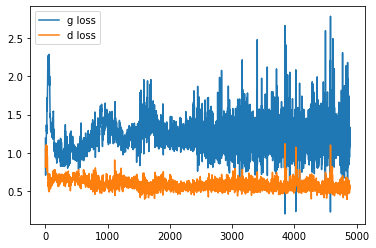

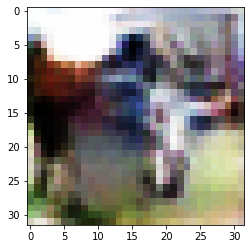

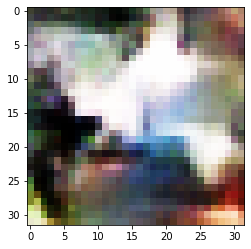

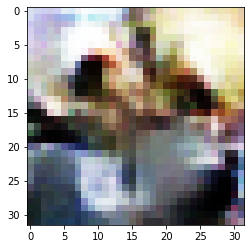

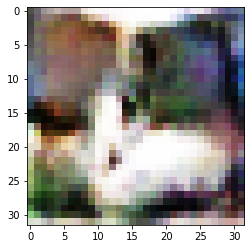

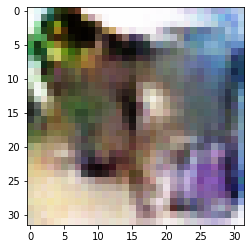

it: 5082; g_loss: 1.1474504470825195; d_loss: 0.6420773267745972; avg_real_score: 0.522269070148468; avg_fake_score: 0.3341289460659027: : 391it [00:26, 14.77it/s]
it: 5083; g_loss: 1.0824726819992065; d_loss: 0.585370659828186; avg_real_score: 0.5457532405853271; avg_fake_score: 0.3591790199279785: : 0it [00:00, ?it/s]

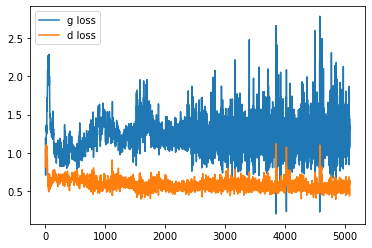

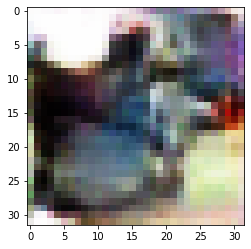

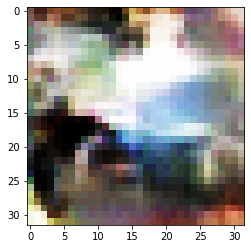

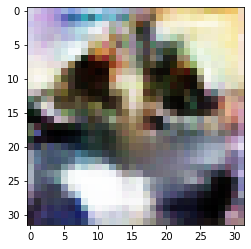

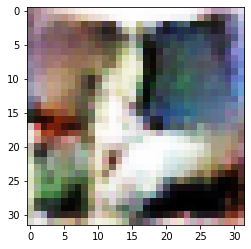

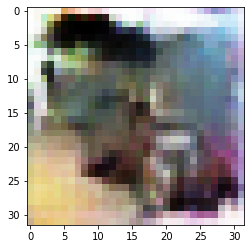

it: 5283; g_loss: 1.348218321800232; d_loss: 0.5002607107162476; avg_real_score: 0.5594204664230347; avg_fake_score: 0.2790731191635132: : 199it [00:13, 15.62it/s]  

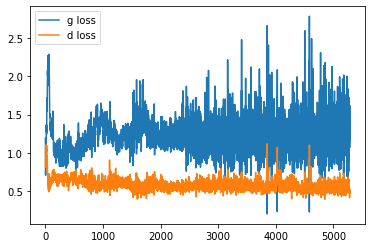

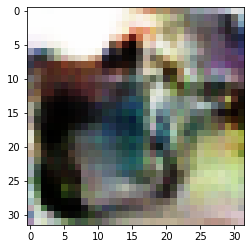

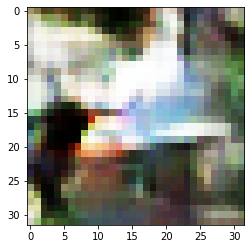

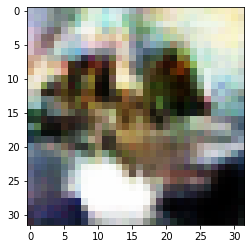

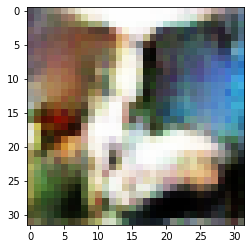

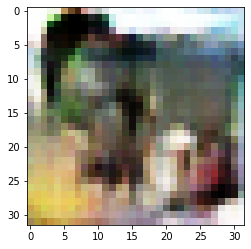

it: 5473; g_loss: 1.3896785974502563; d_loss: 0.483503520488739; avg_real_score: 0.6578448414802551; avg_fake_score: 0.2701731026172638: : 391it [00:27, 14.39it/s]
it: 5474; g_loss: 0.8385891914367676; d_loss: 0.6401327848434448; avg_real_score: 0.5167140364646912; avg_fake_score: 0.4490306079387665: : 0it [00:00, ?it/s]

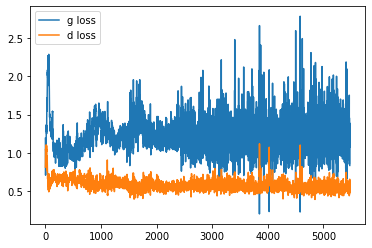

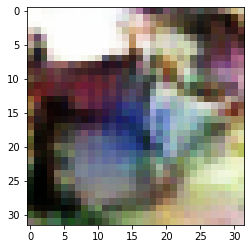

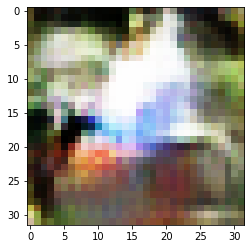

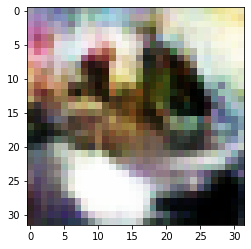

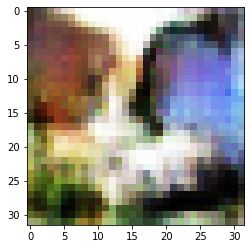

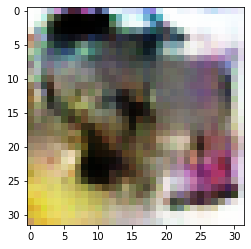

it: 5674; g_loss: 1.7905151844024658; d_loss: 0.5174157619476318; avg_real_score: 0.7434229850769043; avg_fake_score: 0.18569478392601013: : 199it [00:13, 15.87it/s]

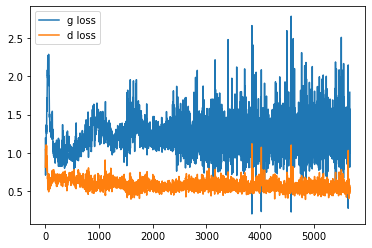

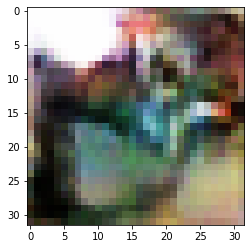

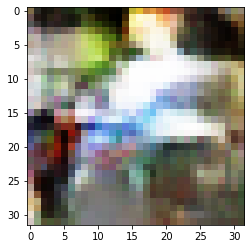

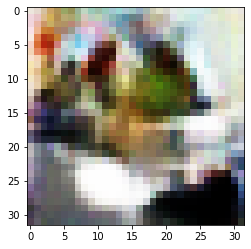

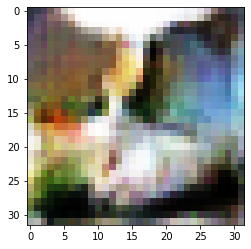

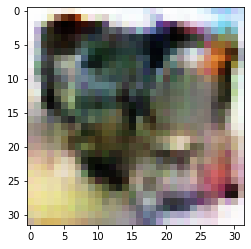

it: 5864; g_loss: 1.853413462638855; d_loss: 0.5202000737190247; avg_real_score: 0.7342133522033691; avg_fake_score: 0.17404578626155853: : 391it [00:27, 14.18it/s]
it: 5865; g_loss: 1.112844705581665; d_loss: 0.5256484150886536; avg_real_score: 0.489119291305542; avg_fake_score: 0.3563995957374573: : 0it [00:00, ?it/s]

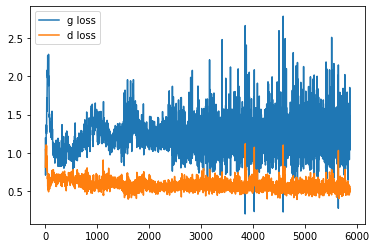

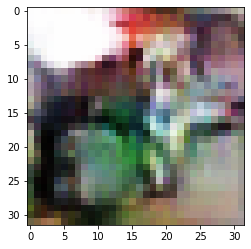

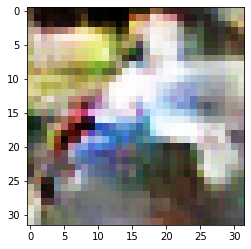

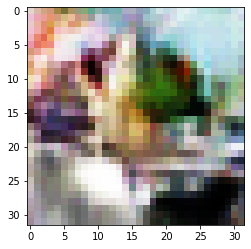

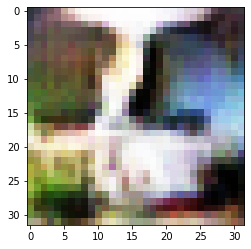

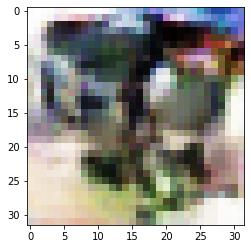

it: 6065; g_loss: 0.7914401292800903; d_loss: 0.6309242248535156; avg_real_score: 0.4934709668159485; avg_fake_score: 0.47100144624710083: : 199it [00:14, 14.86it/s]

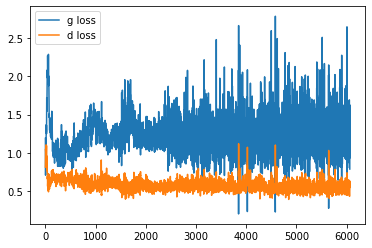

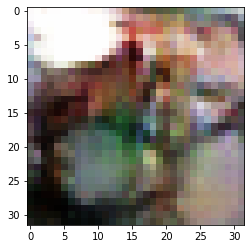

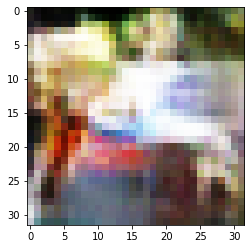

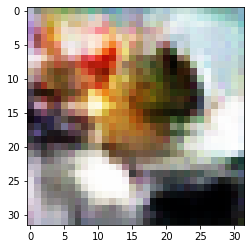

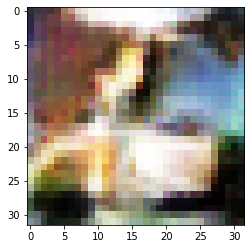

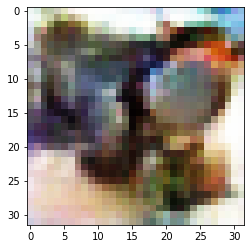

it: 6255; g_loss: 1.1762598752975464; d_loss: 0.4996224641799927; avg_real_score: 0.6086381673812866; avg_fake_score: 0.33310040831565857: : 391it [00:28, 13.78it/s]
it: 6256; g_loss: 1.6848053932189941; d_loss: 0.47743088006973267; avg_real_score: 0.7259074449539185; avg_fake_score: 0.2063184380531311: : 0it [00:00, ?it/s]

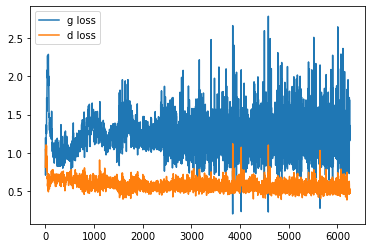

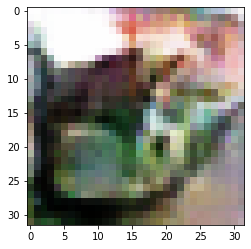

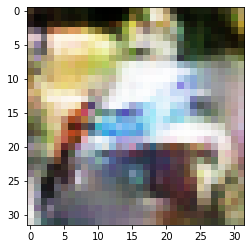

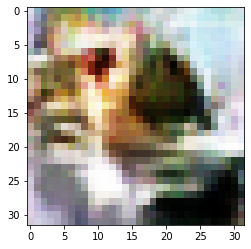

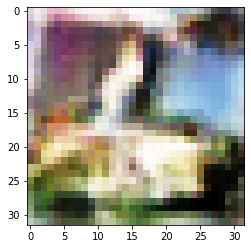

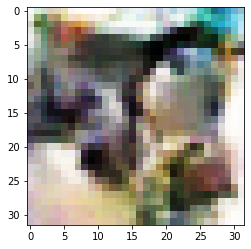

it: 6456; g_loss: 1.0762393474578857; d_loss: 0.6543071269989014; avg_real_score: 0.3559761643409729; avg_fake_score: 0.3760867118835449: : 199it [00:14, 14.63it/s]

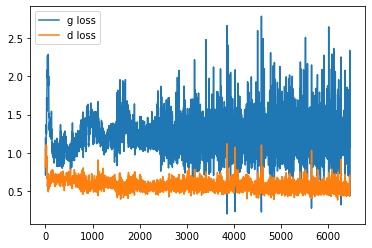

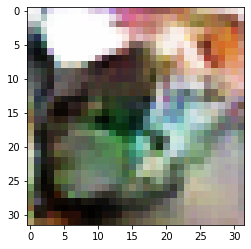

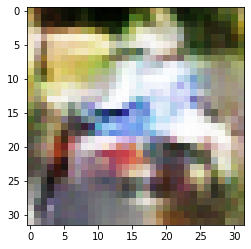

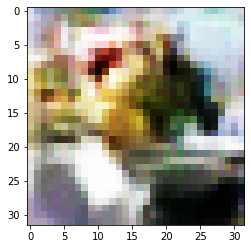

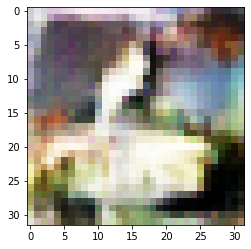

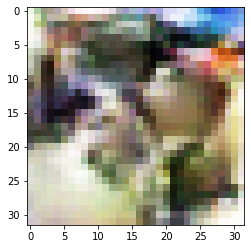

it: 6646; g_loss: 1.09685218334198; d_loss: 0.5795493721961975; avg_real_score: 0.45114561915397644; avg_fake_score: 0.36179137229919434: : 391it [00:28, 13.80it/s]
it: 6647; g_loss: 1.615726351737976; d_loss: 0.45078709721565247; avg_real_score: 0.7672871947288513; avg_fake_score: 0.22106647491455078: : 0it [00:00, ?it/s]

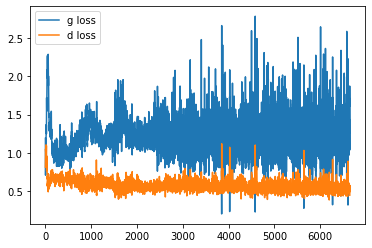

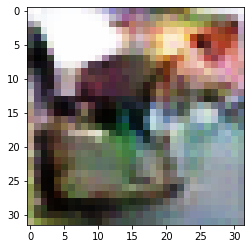

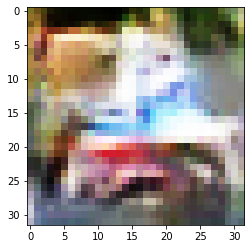

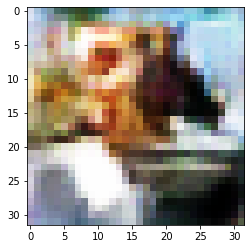

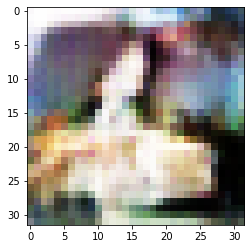

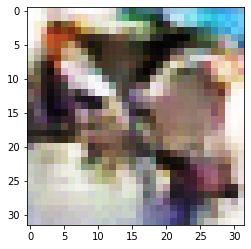

it: 6847; g_loss: 1.4649920463562012; d_loss: 0.5502783060073853; avg_real_score: 0.6234398484230042; avg_fake_score: 0.251531183719635: : 199it [00:15, 14.40it/s] 

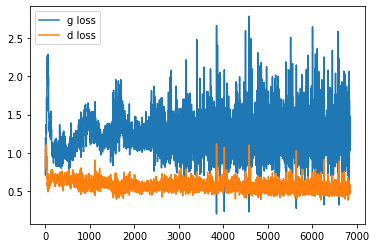

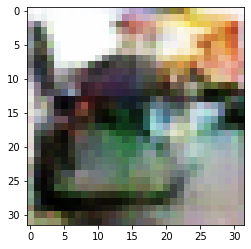

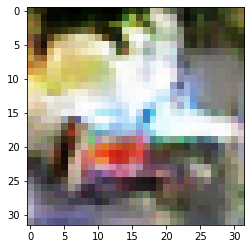

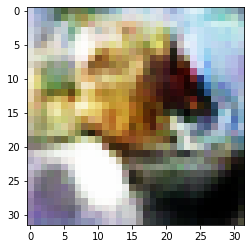

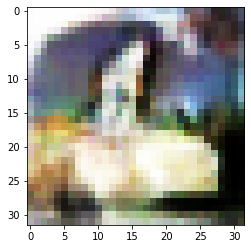

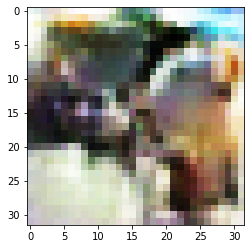

it: 7037; g_loss: 1.2447532415390015; d_loss: 0.5433387756347656; avg_real_score: 0.5230028033256531; avg_fake_score: 0.30298006534576416: : 391it [00:29, 13.45it/s]
it: 7038; g_loss: 0.8378652334213257; d_loss: 0.5943149328231812; avg_real_score: 0.5215520858764648; avg_fake_score: 0.45322006940841675: : 0it [00:00, ?it/s]

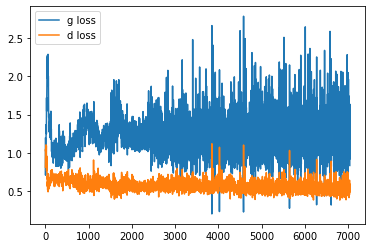

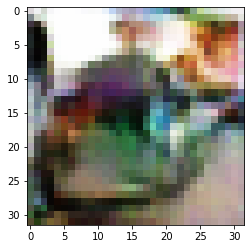

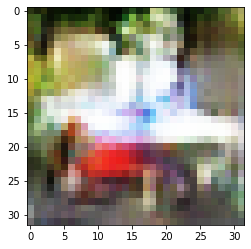

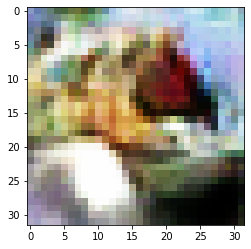

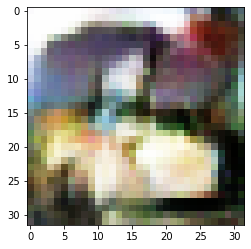

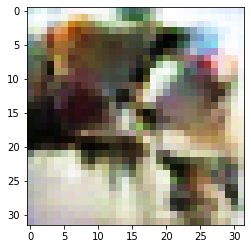

it: 7238; g_loss: 1.3116227388381958; d_loss: 0.4725528955459595; avg_real_score: 0.6999197006225586; avg_fake_score: 0.2956383228302002: : 199it [00:14, 13.65it/s]

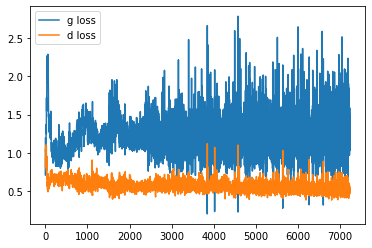

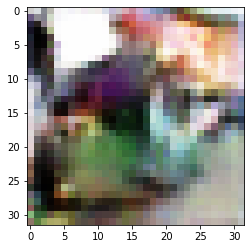

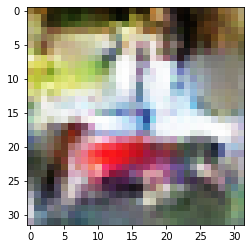

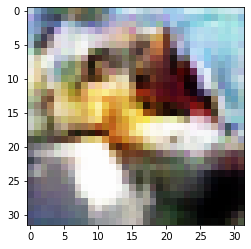

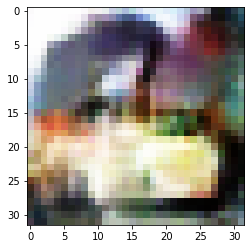

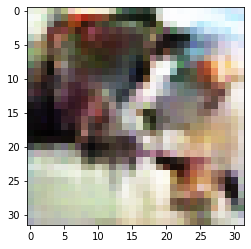

it: 7428; g_loss: 1.4407885074615479; d_loss: 0.5307271480560303; avg_real_score: 0.6661877036094666; avg_fake_score: 0.25496864318847656: : 391it [00:29, 13.45it/s]
it: 7429; g_loss: 1.0286672115325928; d_loss: 0.6203663349151611; avg_real_score: 0.5411330461502075; avg_fake_score: 0.3824629485607147: : 0it [00:00, ?it/s]

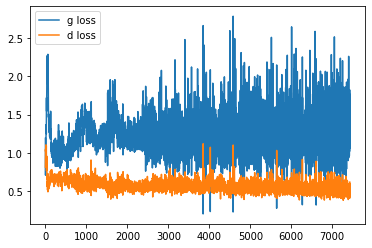

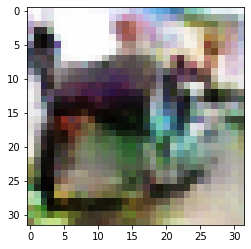

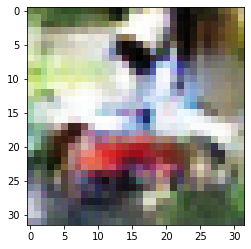

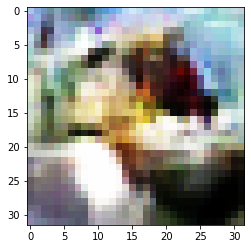

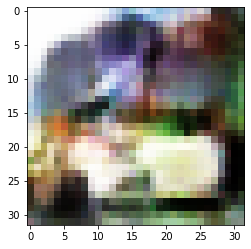

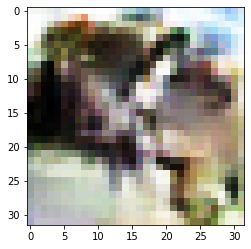

it: 7629; g_loss: 1.6182034015655518; d_loss: 0.4356202185153961; avg_real_score: 0.6571808457374573; avg_fake_score: 0.2193295955657959: : 199it [00:15, 14.28it/s]

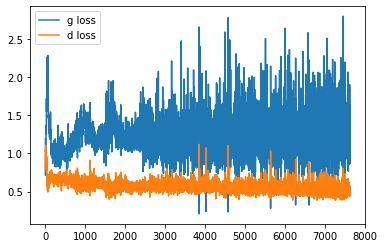

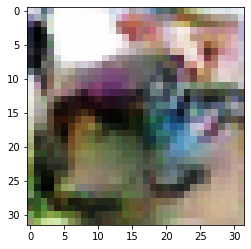

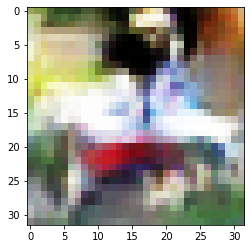

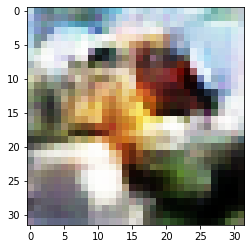

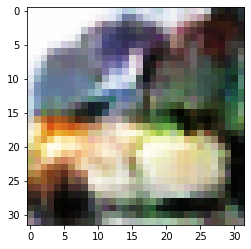

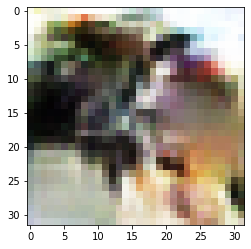

it: 7819; g_loss: 1.1155662536621094; d_loss: 0.4554715156555176; avg_real_score: 0.6023502945899963; avg_fake_score: 0.35108682513237: : 391it [00:29, 13.44it/s]
it: 7820; g_loss: 1.4527524709701538; d_loss: 0.5560338497161865; avg_real_score: 0.6931478977203369; avg_fake_score: 0.25840112566947937: : 0it [00:00, ?it/s]

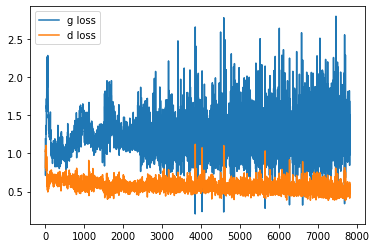

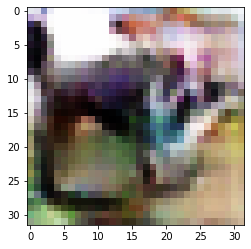

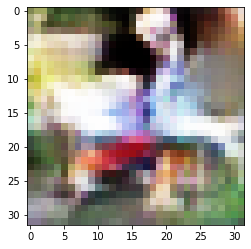

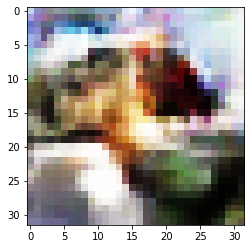

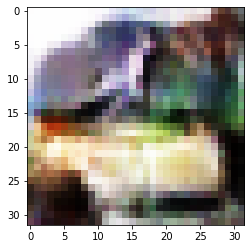

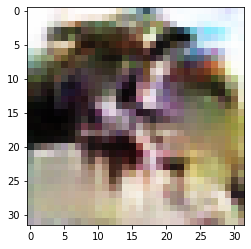

it: 8020; g_loss: 1.3061037063598633; d_loss: 0.5187219977378845; avg_real_score: 0.6132563352584839; avg_fake_score: 0.300458699464798: : 199it [00:14, 15.28it/s]

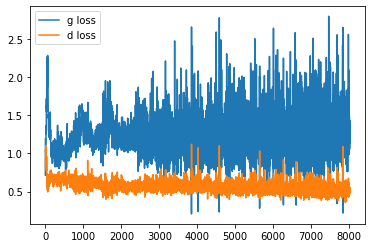

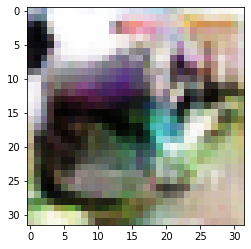

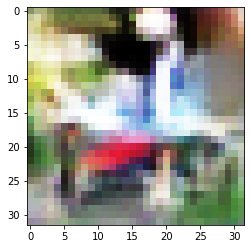

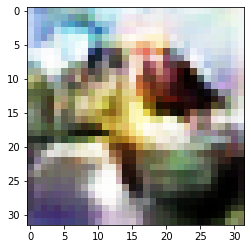

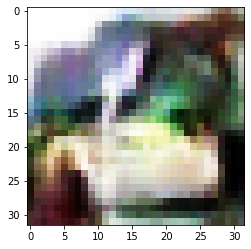

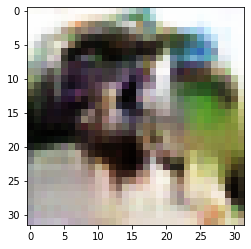

it: 8210; g_loss: 1.492385745048523; d_loss: 0.440507173538208; avg_real_score: 0.6344518065452576; avg_fake_score: 0.2434072345495224: : 391it [00:28, 13.55it/s]
it: 8211; g_loss: 0.9749878644943237; d_loss: 0.5185263156890869; avg_real_score: 0.5402695536613464; avg_fake_score: 0.4015170931816101: : 0it [00:00, ?it/s]

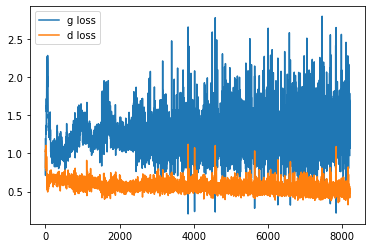

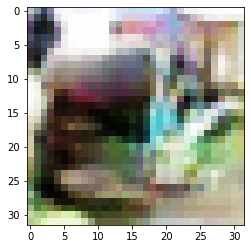

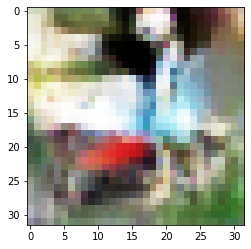

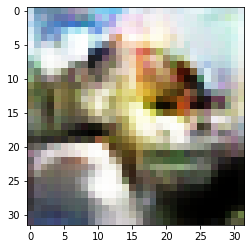

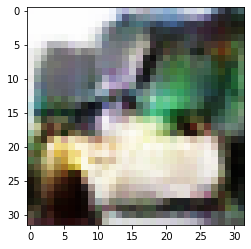

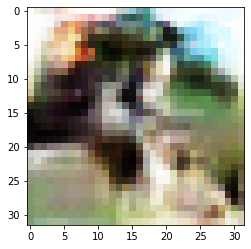

it: 8411; g_loss: 1.2278051376342773; d_loss: 0.5220567584037781; avg_real_score: 0.5081429481506348; avg_fake_score: 0.3165804147720337: : 199it [00:14, 14.57it/s] 

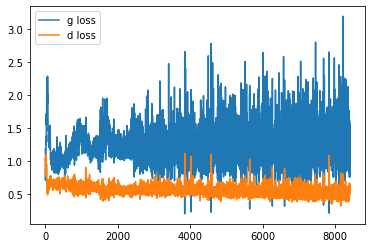

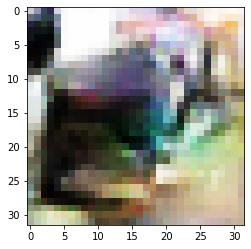

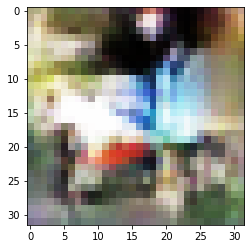

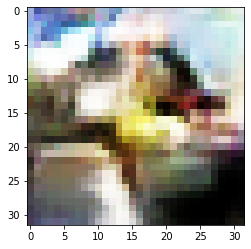

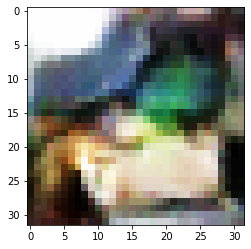

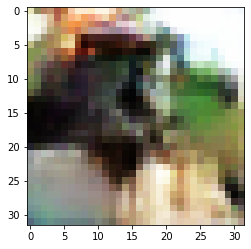

it: 8601; g_loss: 1.702478051185608; d_loss: 0.42557665705680847; avg_real_score: 0.5701684951782227; avg_fake_score: 0.19839923083782196: : 391it [00:28, 13.50it/s]
it: 8602; g_loss: 0.7723442316055298; d_loss: 0.5022405385971069; avg_real_score: 0.5459609031677246; avg_fake_score: 0.4842367172241211: : 0it [00:00, ?it/s]

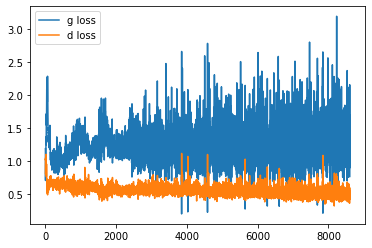

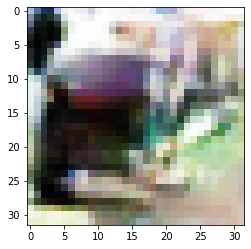

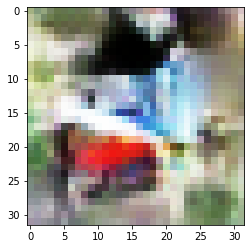

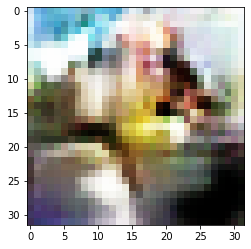

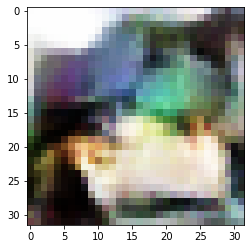

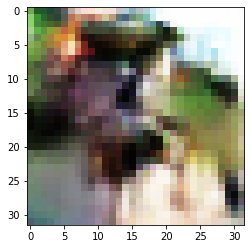

it: 8802; g_loss: 1.27003014087677; d_loss: 0.4286155700683594; avg_real_score: 0.6884987354278564; avg_fake_score: 0.309234619140625: : 199it [00:14, 15.02it/s]   

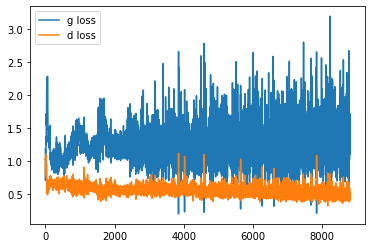

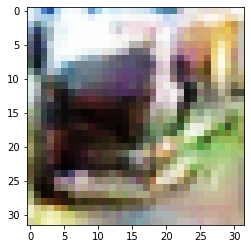

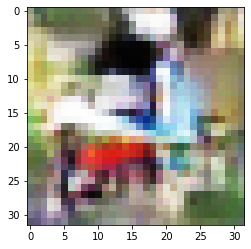

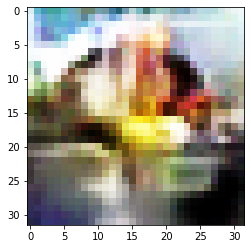

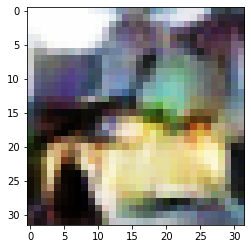

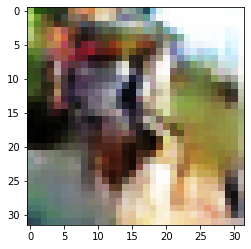

it: 8992; g_loss: 2.194112539291382; d_loss: 0.45691683888435364; avg_real_score: 0.8282710909843445; avg_fake_score: 0.12663725018501282: : 391it [00:28, 13.50it/s]
it: 8993; g_loss: 1.5301721096038818; d_loss: 0.39115580916404724; avg_real_score: 0.624485194683075; avg_fake_score: 0.2481299489736557: : 0it [00:00, ?it/s]

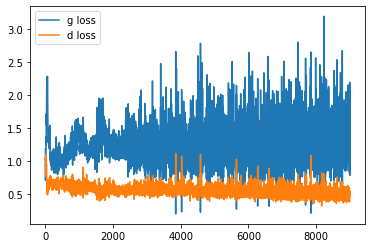

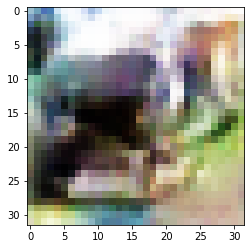

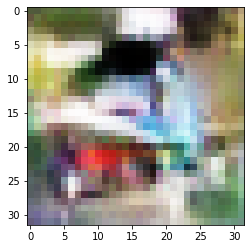

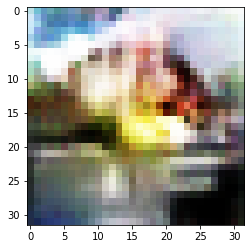

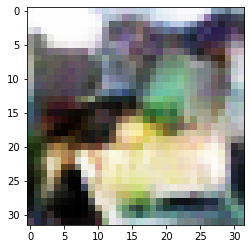

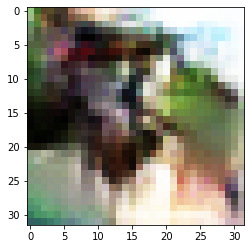

it: 9193; g_loss: 1.314955711364746; d_loss: 0.5183500647544861; avg_real_score: 0.688370406627655; avg_fake_score: 0.2940656542778015: : 199it [00:14, 15.29it/s]

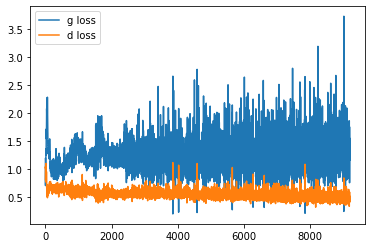

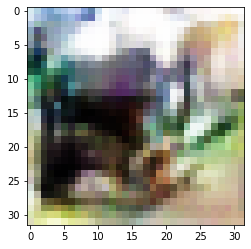

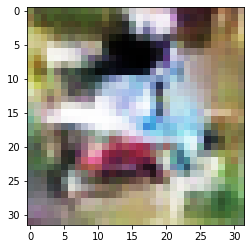

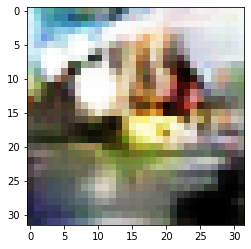

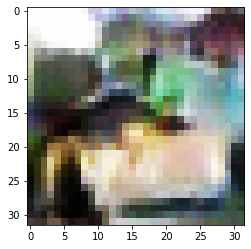

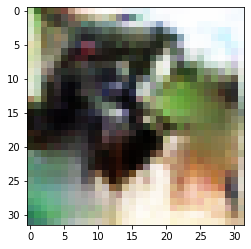

it: 9383; g_loss: 1.256402850151062; d_loss: 0.6353856325149536; avg_real_score: 0.555085301399231; avg_fake_score: 0.3083152770996094: : 391it [00:28, 13.53it/s]
it: 9384; g_loss: 1.2813677787780762; d_loss: 0.5026719570159912; avg_real_score: 0.617953896522522; avg_fake_score: 0.2976992130279541: : 0it [00:00, ?it/s]

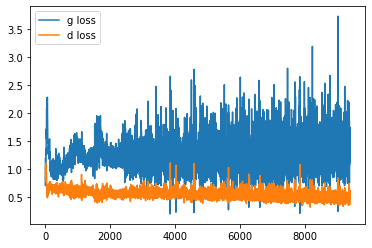

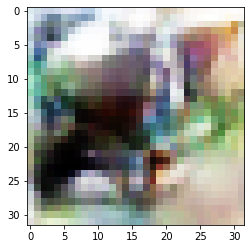

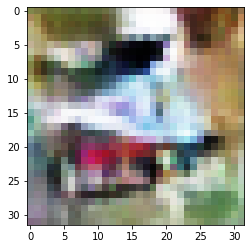

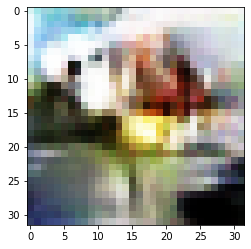

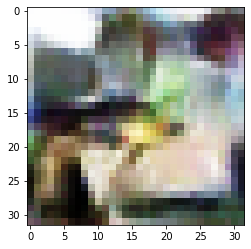

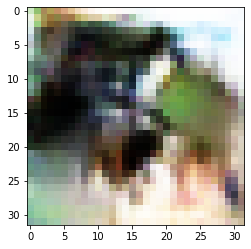

it: 9584; g_loss: 0.8275919556617737; d_loss: 0.5082623958587646; avg_real_score: 0.4887917637825012; avg_fake_score: 0.45918145775794983: : 199it [00:14, 15.11it/s]

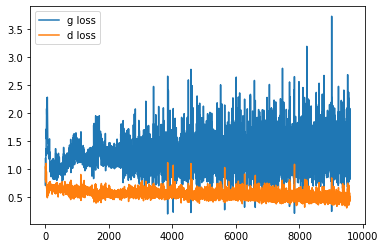

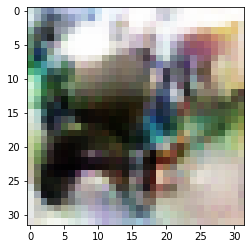

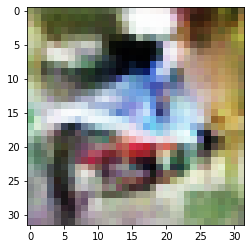

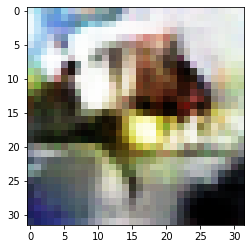

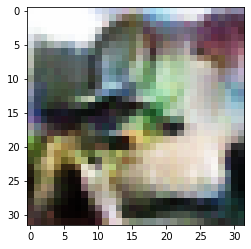

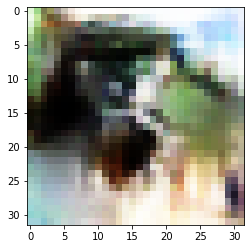

it: 9774; g_loss: 0.8086702227592468; d_loss: 0.5389919281005859; avg_real_score: 0.5114482641220093; avg_fake_score: 0.4706667959690094: : 391it [00:28, 13.71it/s]
it: 9775; g_loss: 2.120206117630005; d_loss: 0.5293713212013245; avg_real_score: 0.8305964469909668; avg_fake_score: 0.1404297649860382: : 0it [00:00, ?it/s]

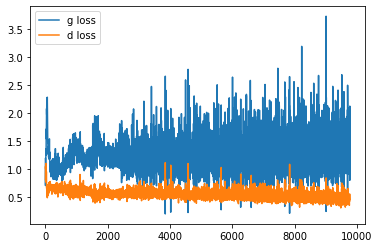

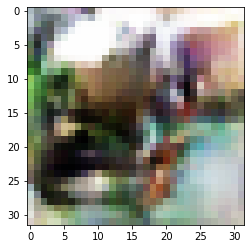

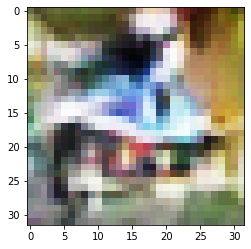

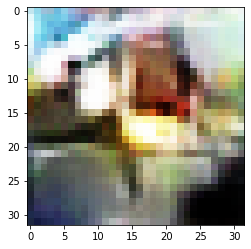

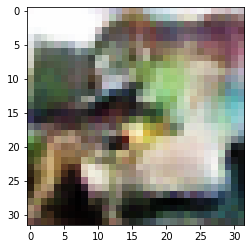

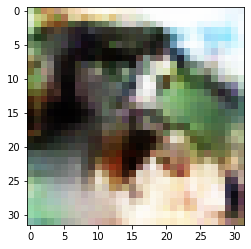

it: 9975; g_loss: 1.2260459661483765; d_loss: 0.4856194257736206; avg_real_score: 0.6125056743621826; avg_fake_score: 0.3193304240703583: : 199it [00:15, 15.54it/s]

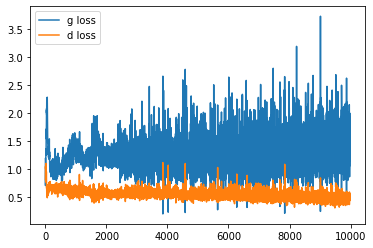

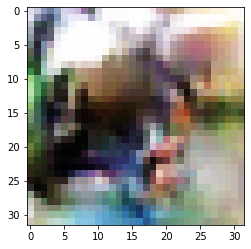

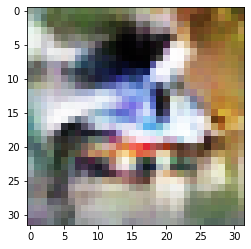

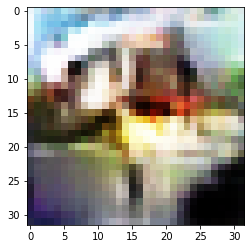

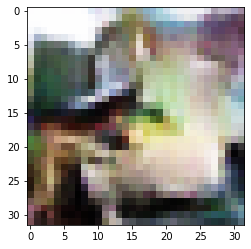

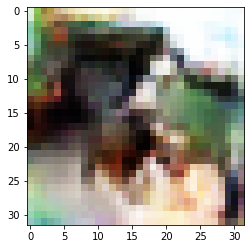

it: 10165; g_loss: 1.7271435260772705; d_loss: 0.41058453917503357; avg_real_score: 0.7652834057807922; avg_fake_score: 0.2032638043165207: : 391it [00:29, 13.48it/s]
it: 10166; g_loss: 1.1371197700500488; d_loss: 0.5068480968475342; avg_real_score: 0.5704712271690369; avg_fake_score: 0.3481724262237549: : 0it [00:00, ?it/s]

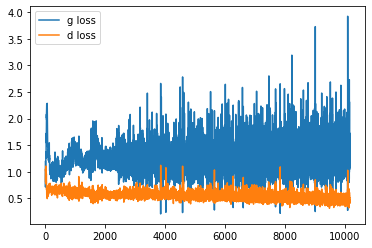

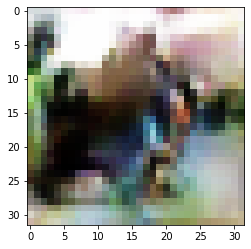

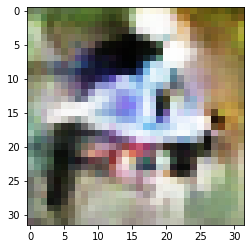

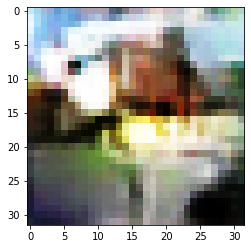

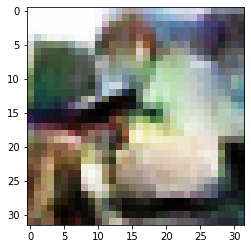

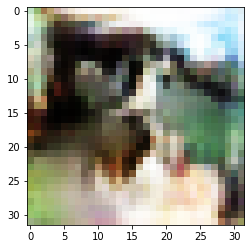

it: 10366; g_loss: 0.5233364105224609; d_loss: 0.8384099006652832; avg_real_score: 0.2541714906692505; avg_fake_score: 0.6117216348648071: : 199it [00:14, 15.47it/s]

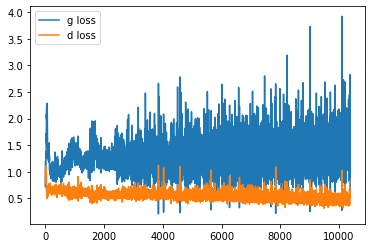

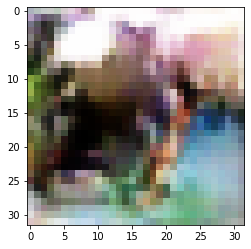

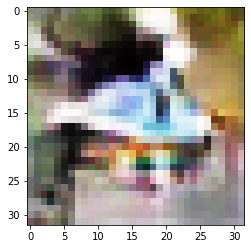

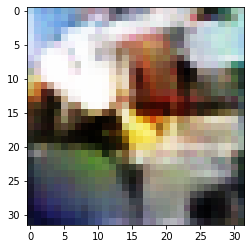

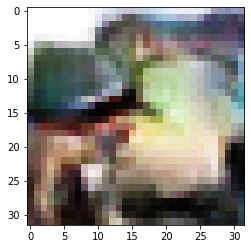

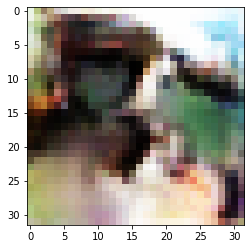

it: 10556; g_loss: 1.2239248752593994; d_loss: 0.4614748954772949; avg_real_score: 0.5761754512786865; avg_fake_score: 0.32444673776626587: : 391it [00:28, 13.95it/s]
it: 10557; g_loss: 1.6824924945831299; d_loss: 0.45372718572616577; avg_real_score: 0.7598354816436768; avg_fake_score: 0.207128643989563: : 0it [00:00, ?it/s]

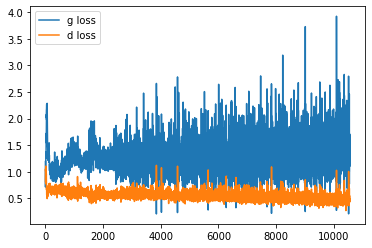

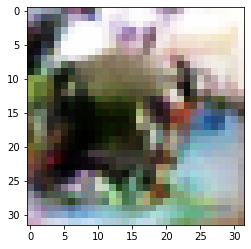

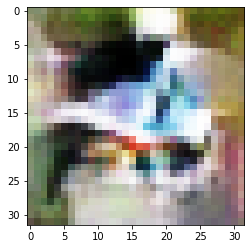

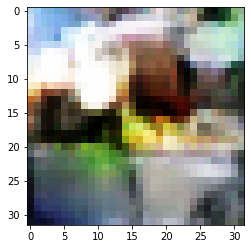

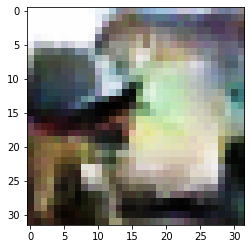

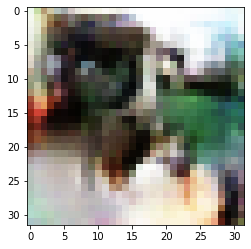

it: 10757; g_loss: 1.205810785293579; d_loss: 0.44698578119277954; avg_real_score: 0.5682417750358582; avg_fake_score: 0.31946223974227905: : 199it [00:14, 14.88it/s]

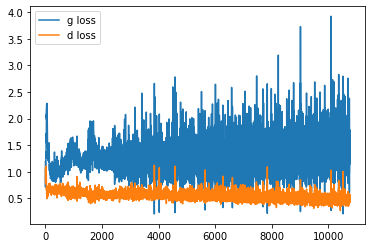

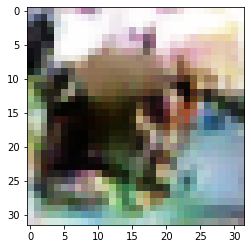

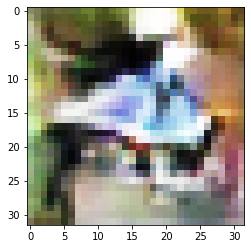

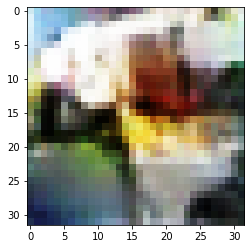

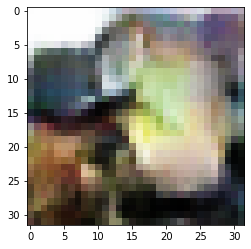

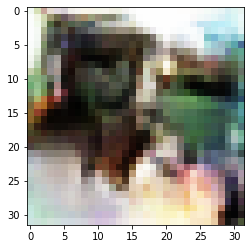

it: 10947; g_loss: 1.9814846515655518; d_loss: 0.42321306467056274; avg_real_score: 0.7500759959220886; avg_fake_score: 0.1560385525226593: : 391it [00:28, 13.58it/s]
it: 10948; g_loss: 0.8709786534309387; d_loss: 0.5245794057846069; avg_real_score: 0.4974953234195709; avg_fake_score: 0.4449739456176758: : 0it [00:00, ?it/s]

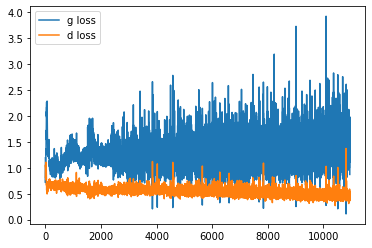

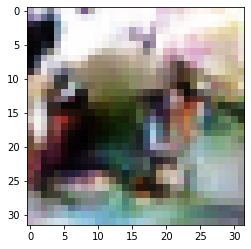

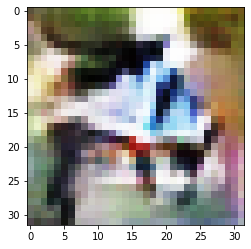

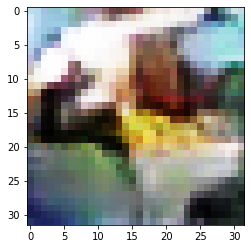

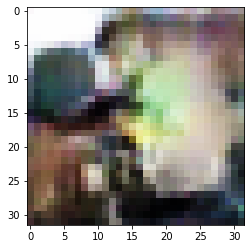

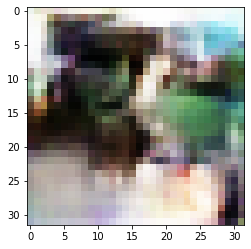

it: 11148; g_loss: 1.7069954872131348; d_loss: 0.41380903124809265; avg_real_score: 0.7635704278945923; avg_fake_score: 0.20493614673614502: : 199it [00:14, 16.09it/s]

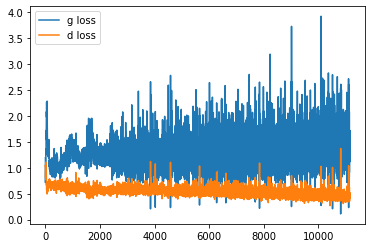

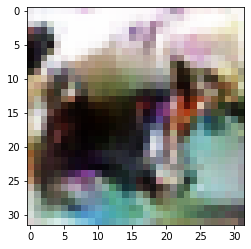

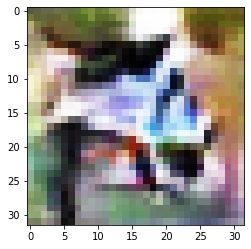

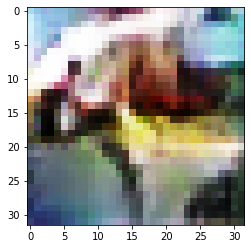

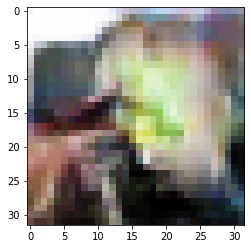

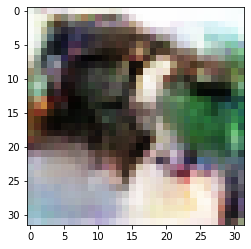

it: 11338; g_loss: 0.4818354547023773; d_loss: 0.535100519657135; avg_real_score: 0.43607425689697266; avg_fake_score: 0.6594448089599609: : 391it [00:27, 13.98it/s]
it: 11339; g_loss: 2.511289119720459; d_loss: 0.837540864944458; avg_real_score: 0.847611665725708; avg_fake_score: 0.10381326824426651: : 0it [00:00, ?it/s]

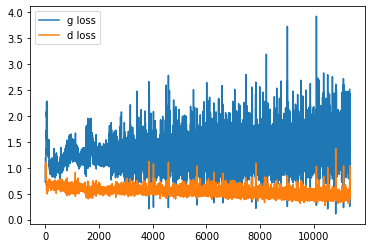

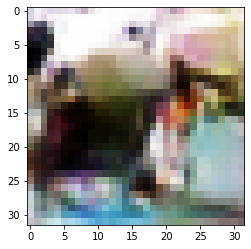

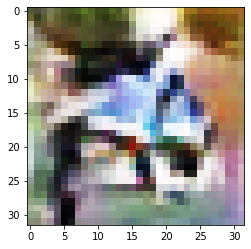

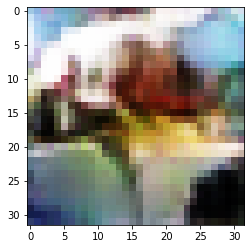

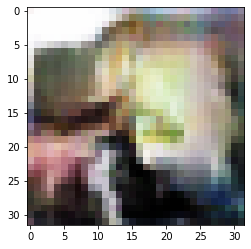

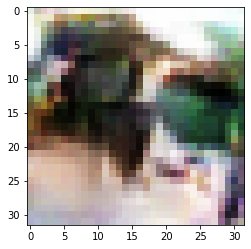

it: 11539; g_loss: 1.2132573127746582; d_loss: 0.41205888986587524; avg_real_score: 0.6218631863594055; avg_fake_score: 0.322732150554657: : 199it [00:14, 15.39it/s]

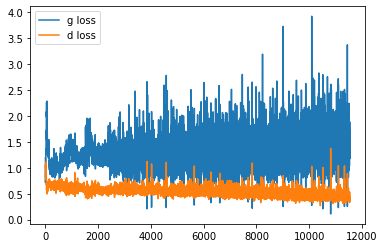

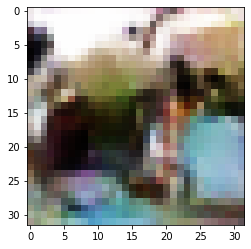

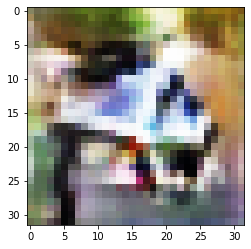

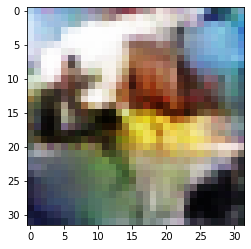

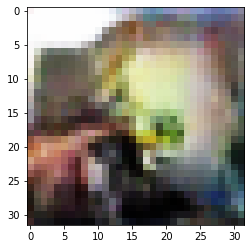

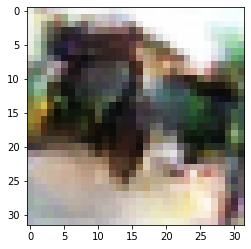

it: 11729; g_loss: 1.004154086112976; d_loss: 0.4520932734012604; avg_real_score: 0.5219659805297852; avg_fake_score: 0.398507297039032: : 391it [00:28, 13.88it/s]


In [ ]:
nb_epochs = 40

g_losses = []
d_losses = []


nz = 100
ngf = 32
ndf = 32

nchannels= 3 
lr_d = 0.0002
lr_g = 0.0005
beta1= 0.5
display_freq = 200

netD = Discriminator(ndf, nchannels=nchannels).to(device)
netG = Generator(nz, ngf, nchannels=nchannels).to(device)

netD.apply(weights_init)
netG.apply(weights_init)

g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))
j = 0


z_test = sample_z(64, nz) # we generate the noise only once for testing

for epoch in range(nb_epochs):
    
    # train
    pbar = tqdm(enumerate(dataloader))
    for i, batch in pbar:
        im, _ = batch # we don't care about the label for unconditional generation
        im = im.to(device)
        
        cur_batch_size = im.shape[0]  
        
        # 1. sample a z vector 
        z = sample_z(cur_batch_size, nz)
        
        # 2. Generate a fake image

        fake_im = netG(z)

        # 3. Classify real image with D
        
        real_logits = netD(im)


        # 4. Classify fake image with D
       
        fake_logits = netD(fake_im.detach())
         
        ###
        ### Discriminator
        ###
        d_loss = criterion(real_logits, get_labels_one(cur_batch_size).to(device))
        d_loss = (d_loss + criterion(fake_logits, get_labels_zero(cur_batch_size).to(device)))/2
        d_opt.zero_grad()
        d_loss.backward() # we need to retain graph=True to be able to calculate the gradient in the g backprop
        d_opt.step()

        
        ###
        ### Generator
        ###
        
        fake_logits = netD(fake_im)
        g_loss = criterion(fake_logits, get_labels_one(cur_batch_size).to(device)) 
        g_opt.zero_grad()
        g_loss.backward()
        g_opt.step()
        
                
        d_losses.append(d_loss.item())
        g_losses.append(g_loss.item())
        
        avg_real_score = torch.mean(real_logits).item()
        avg_fake_score = torch.mean(fake_logits).item()


        pbar.set_description(f"it: {j}; g_loss: {g_loss}; d_loss: {d_loss}; avg_real_score: {avg_real_score}; avg_fake_score: {avg_fake_score}")
        if i % display_freq == 0:
            
            plt.plot(range(len(g_losses)), g_losses, label='g loss')
            plt.plot(range(len(g_losses)), d_losses, label='d loss')
            plt.legend()
            plt.show()  
            # fake_im = netG(z_test)
            
            # un_norm = renorm(fake_im) # for visualization
            
            # grid = torchvision.utils.make_grid(un_norm, nrow=8)
            # pil_grid = to_pil(grid)  
            
            # print("epoch", epoch, "generated images")
            # plt.imshow(pil_grid)
            # plt.show()

            for _ in z_test[:5]:
              z = _.unsqueeze(0)
              fake_im = netG(z)
              un_norm = renorm(fake_im) # for visualization
              grid = torchvision.utils.make_grid(un_norm, nrow=8)
              pil_grid = to_pil(grid)  
              plt.imshow(pil_grid)
              plt.show()
            
            
           
        j += 1

it: 0; g_loss: 1.8636438846588135; d_loss: 0.8294341564178467; avg_real_score: 0.358132928609848; avg_fake_score: 0.17793065309524536: : 0it [00:00, ?it/s]

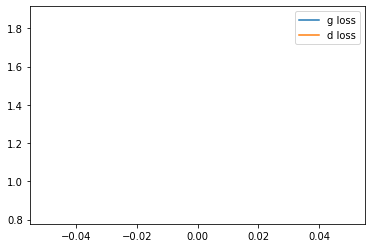

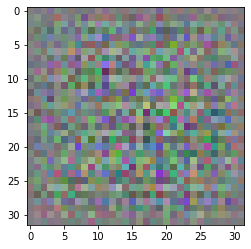

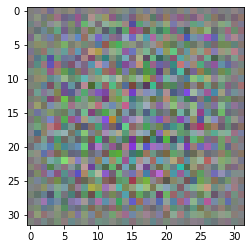

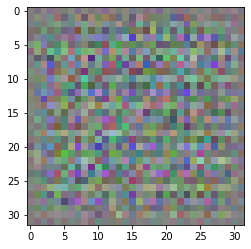

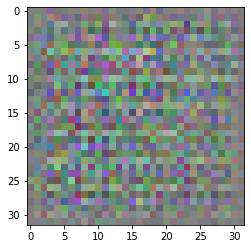

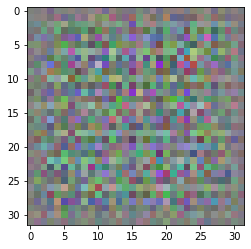

it: 200; g_loss: 1.4952056407928467; d_loss: 0.6044118404388428; avg_real_score: 0.6320186853408813; avg_fake_score: 0.24526327848434448: : 199it [00:12, 17.26it/s]

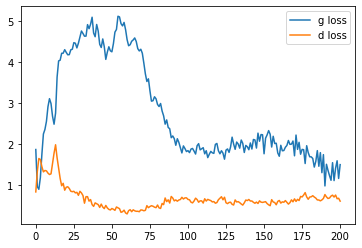

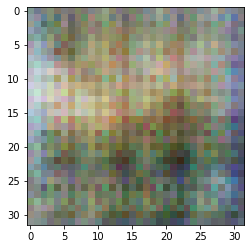

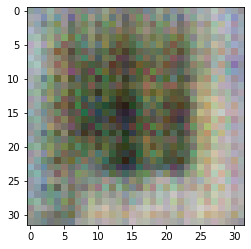

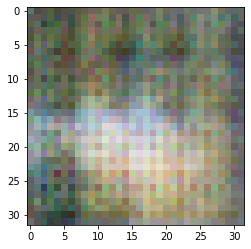

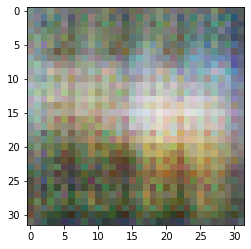

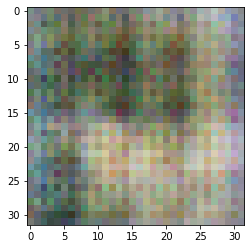

it: 390; g_loss: 1.3850616216659546; d_loss: 0.6545245051383972; avg_real_score: 0.6099237203598022; avg_fake_score: 0.2776378393173218: : 391it [00:24, 15.98it/s]
it: 391; g_loss: 1.3035534620285034; d_loss: 0.7041321992874146; avg_real_score: 0.49029743671417236; avg_fake_score: 0.2944744825363159: : 0it [00:00, ?it/s]

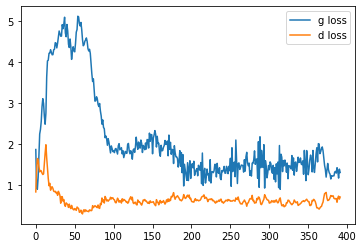

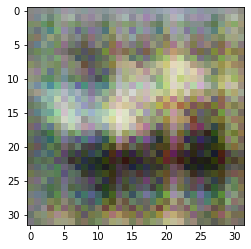

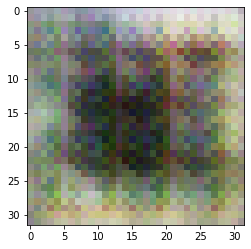

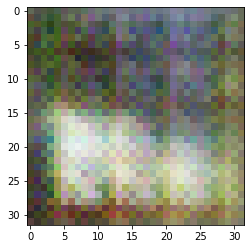

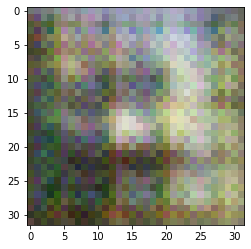

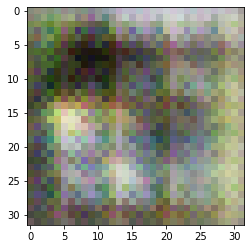

it: 591; g_loss: 2.1912176609039307; d_loss: 0.57149738073349; avg_real_score: 0.6635985374450684; avg_fake_score: 0.13200576603412628: : 199it [00:12, 16.42it/s]  

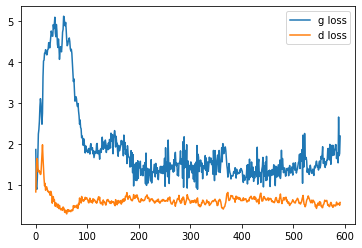

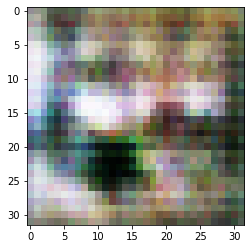

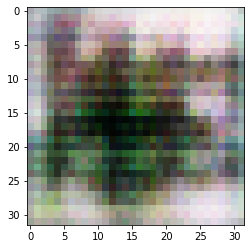

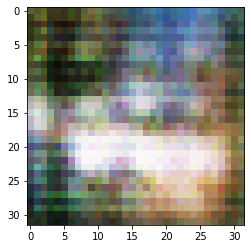

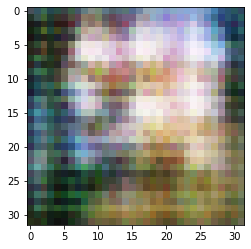

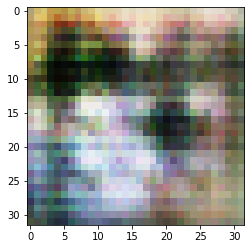

it: 781; g_loss: 2.021954298019409; d_loss: 0.33302611112594604; avg_real_score: 0.6973738670349121; avg_fake_score: 0.1597730666399002: : 391it [00:24, 15.86it/s]
it: 782; g_loss: 2.610933303833008; d_loss: 0.3374982178211212; avg_real_score: 0.8227933049201965; avg_fake_score: 0.09960036724805832: : 0it [00:00, ?it/s]

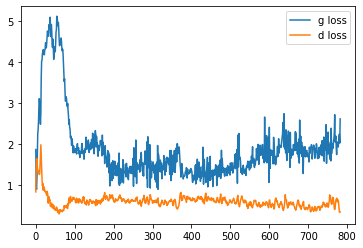

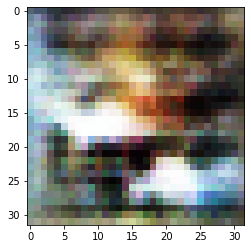

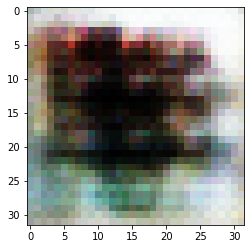

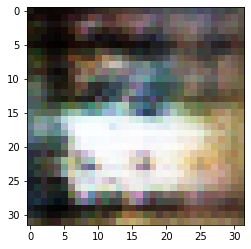

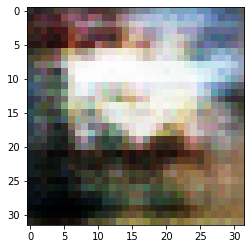

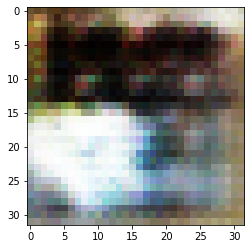

it: 982; g_loss: 1.887941837310791; d_loss: 0.5295331478118896; avg_real_score: 0.6453518867492676; avg_fake_score: 0.17869654297828674: : 199it [00:13, 16.48it/s] 

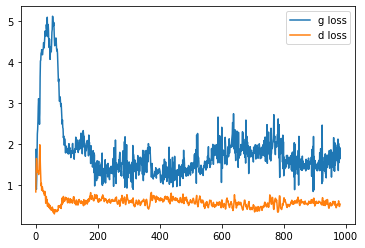

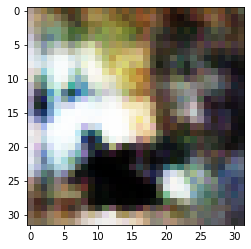

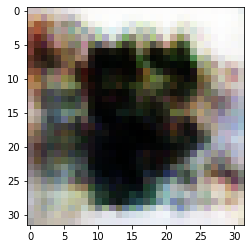

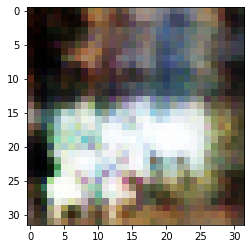

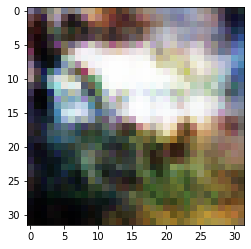

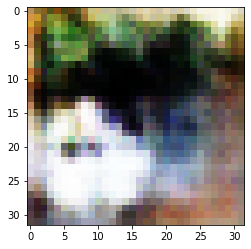

it: 1172; g_loss: 1.7089775800704956; d_loss: 0.4371162950992584; avg_real_score: 0.7311643362045288; avg_fake_score: 0.2012767791748047: : 391it [00:25, 15.27it/s]
it: 1173; g_loss: 1.8342547416687012; d_loss: 0.37732523679733276; avg_real_score: 0.6974335312843323; avg_fake_score: 0.18370717763900757: : 0it [00:00, ?it/s]

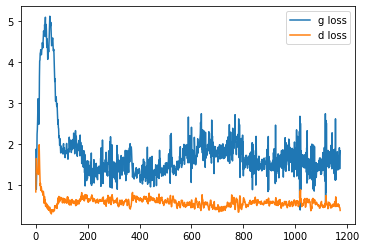

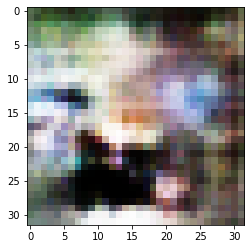

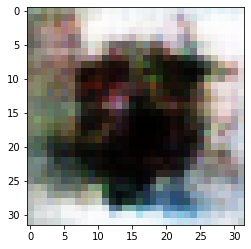

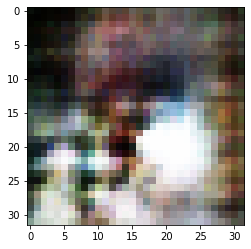

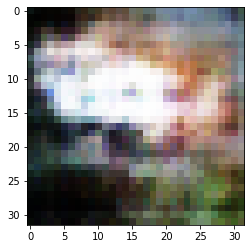

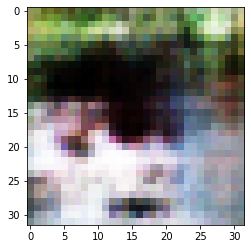

it: 1373; g_loss: 1.6153723001480103; d_loss: 0.5536586046218872; avg_real_score: 0.569796085357666; avg_fake_score: 0.2232673168182373: : 199it [00:13, 16.69it/s]  

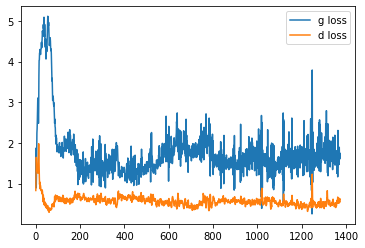

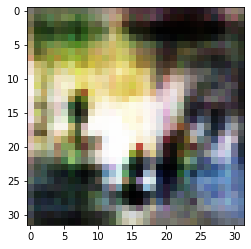

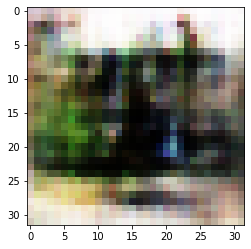

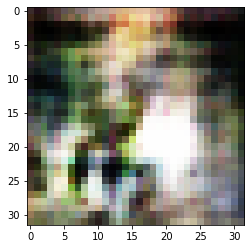

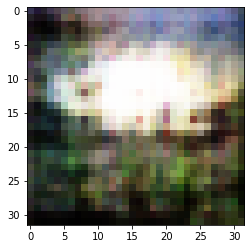

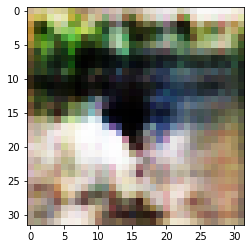

it: 1563; g_loss: 1.4672857522964478; d_loss: 0.6229549646377563; avg_real_score: 0.5703375935554504; avg_fake_score: 0.26538392901420593: : 391it [00:25, 15.09it/s]
it: 1564; g_loss: 1.7744855880737305; d_loss: 0.5471503734588623; avg_real_score: 0.6682411432266235; avg_fake_score: 0.20094309747219086: : 0it [00:00, ?it/s]

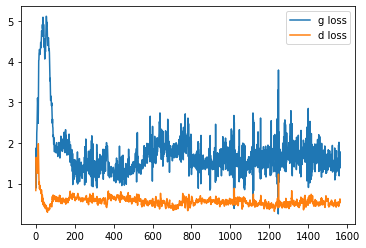

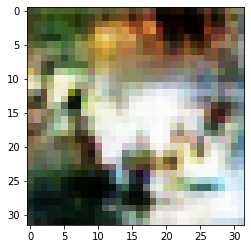

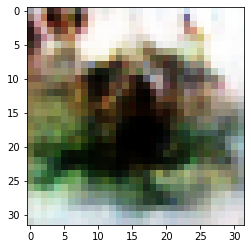

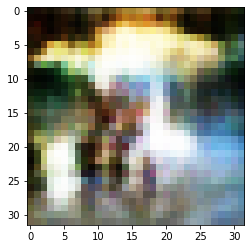

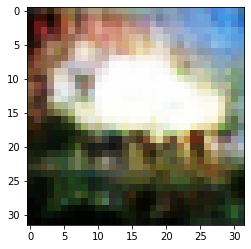

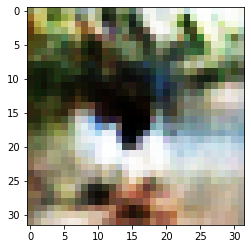

it: 1764; g_loss: 2.5002388954162598; d_loss: 0.7924286127090454; avg_real_score: 0.6536451578140259; avg_fake_score: 0.10397827625274658: : 199it [00:13, 15.96it/s]

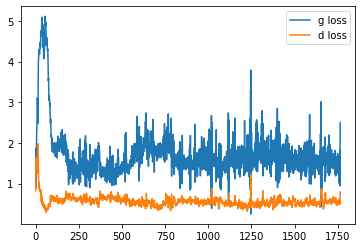

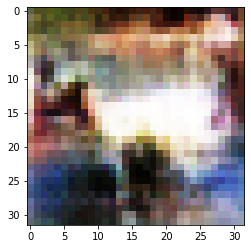

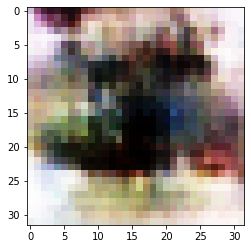

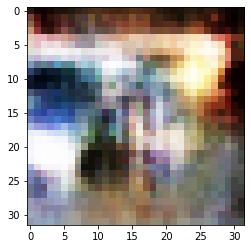

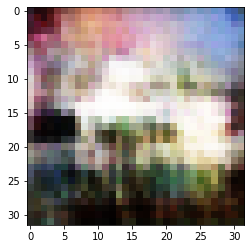

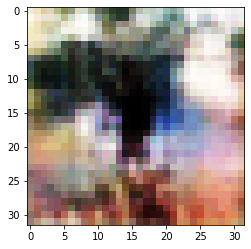

it: 1954; g_loss: 1.3785932064056396; d_loss: 0.579133927822113; avg_real_score: 0.5415405631065369; avg_fake_score: 0.27630361914634705: : 391it [00:26, 14.86it/s]
it: 1955; g_loss: 1.2668300867080688; d_loss: 0.5305582284927368; avg_real_score: 0.5947576761245728; avg_fake_score: 0.30912792682647705: : 0it [00:00, ?it/s]

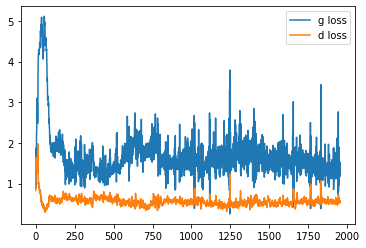

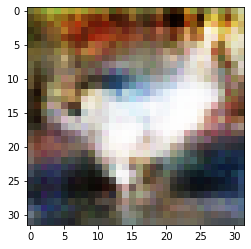

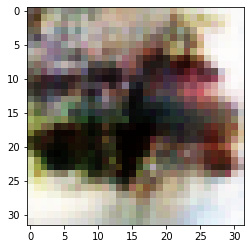

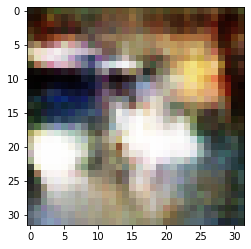

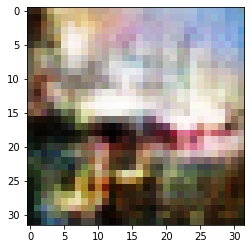

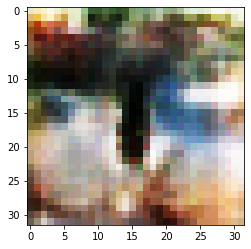

it: 2155; g_loss: 1.4790925979614258; d_loss: 0.5687298774719238; avg_real_score: 0.5515612363815308; avg_fake_score: 0.25413763523101807: : 199it [00:13, 14.67it/s]

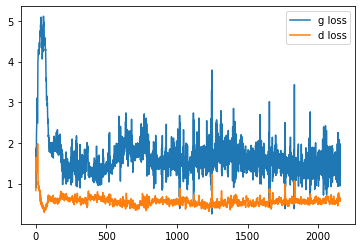

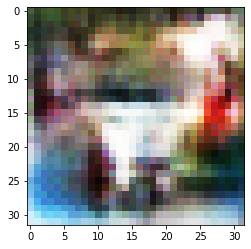

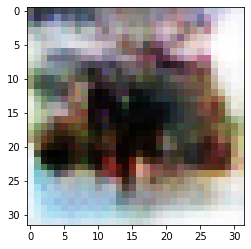

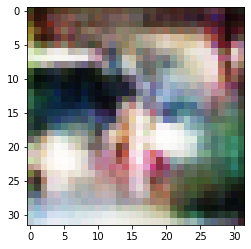

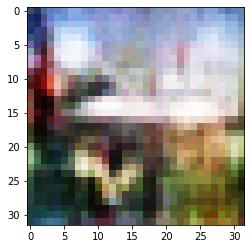

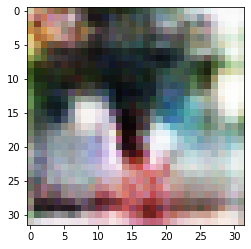

it: 2345; g_loss: 1.5608688592910767; d_loss: 0.522455096244812; avg_real_score: 0.6927229166030884; avg_fake_score: 0.2233416587114334: : 391it [00:26, 14.53it/s]
it: 2346; g_loss: 1.415273904800415; d_loss: 0.5415670871734619; avg_real_score: 0.595958948135376; avg_fake_score: 0.26792269945144653: : 0it [00:00, ?it/s]

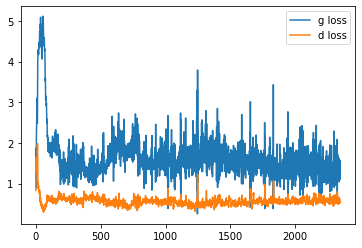

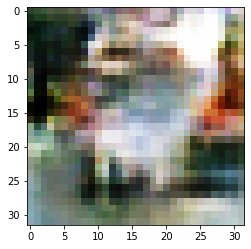

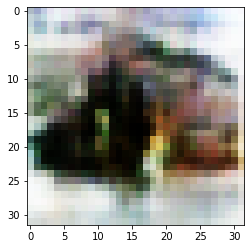

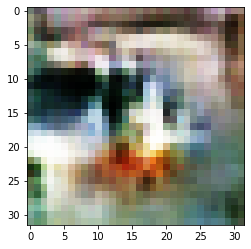

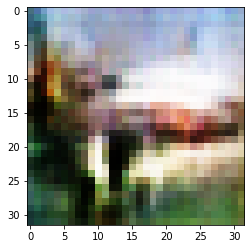

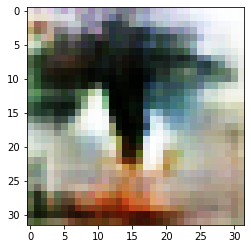

it: 2546; g_loss: 1.316678524017334; d_loss: 0.6654596924781799; avg_real_score: 0.5626481771469116; avg_fake_score: 0.29173552989959717: : 199it [00:13, 16.13it/s] 

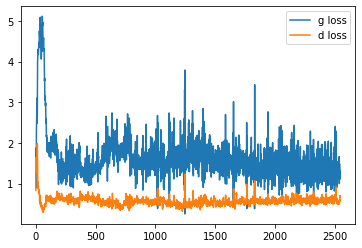

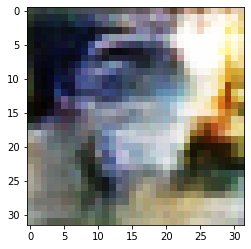

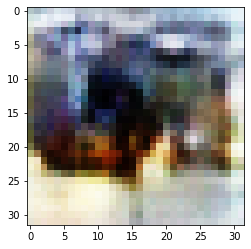

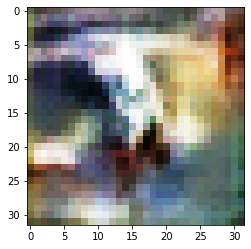

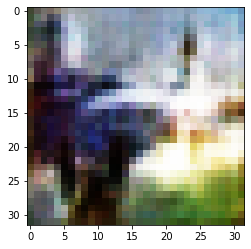

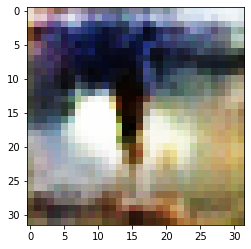

it: 2736; g_loss: 1.6429378986358643; d_loss: 0.630742073059082; avg_real_score: 0.580173909664154; avg_fake_score: 0.21512475609779358: : 391it [00:26, 14.71it/s]
it: 2737; g_loss: 1.0182948112487793; d_loss: 0.7034298181533813; avg_real_score: 0.4467152953147888; avg_fake_score: 0.3837728500366211: : 0it [00:00, ?it/s]

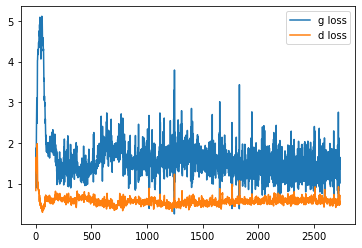

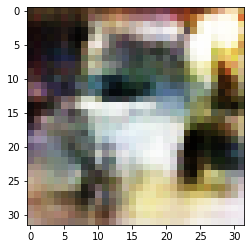

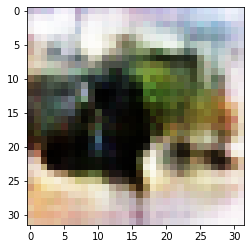

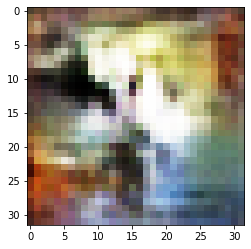

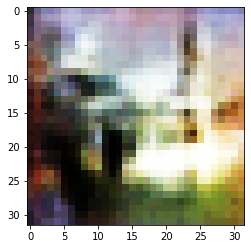

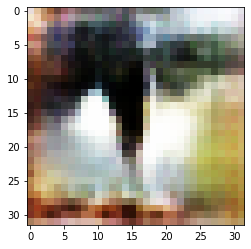

it: 2937; g_loss: 0.8370539546012878; d_loss: 0.581368625164032; avg_real_score: 0.41509807109832764; avg_fake_score: 0.45406797528266907: : 199it [00:13, 15.05it/s]

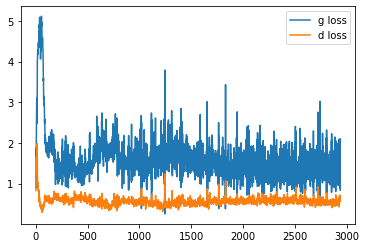

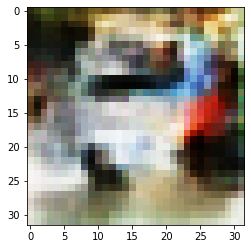

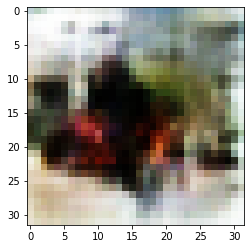

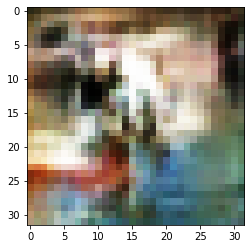

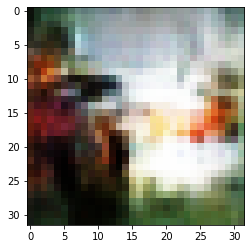

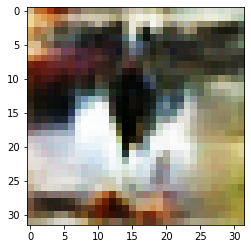

it: 3127; g_loss: 1.456382155418396; d_loss: 0.4738280177116394; avg_real_score: 0.641002357006073; avg_fake_score: 0.25113001465797424: : 391it [00:26, 14.65it/s]
it: 3128; g_loss: 1.445014476776123; d_loss: 0.4382149875164032; avg_real_score: 0.6632192134857178; avg_fake_score: 0.2565520405769348: : 0it [00:00, ?it/s]

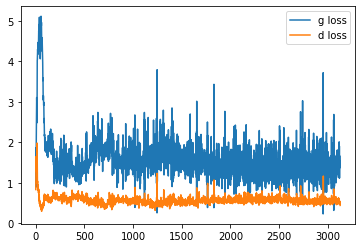

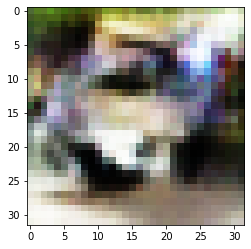

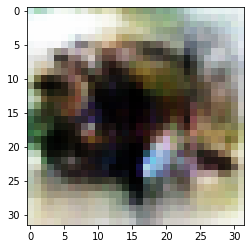

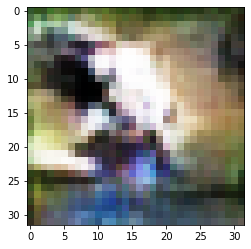

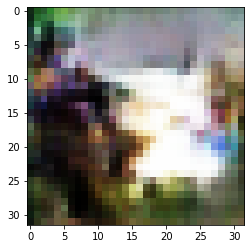

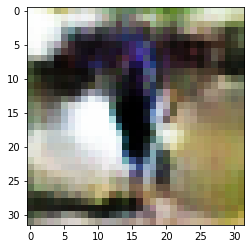

it: 3328; g_loss: 1.4649171829223633; d_loss: 0.4976096749305725; avg_real_score: 0.5912834405899048; avg_fake_score: 0.25438615679740906: : 199it [00:13, 15.16it/s]

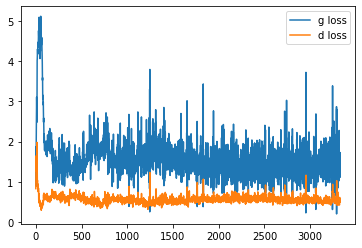

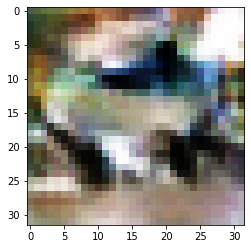

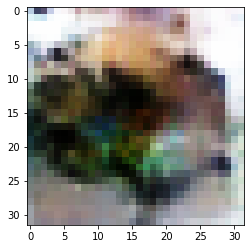

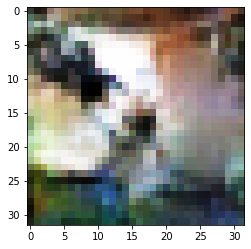

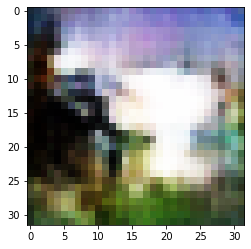

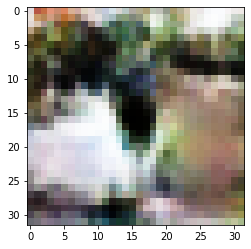

it: 3518; g_loss: 1.4516186714172363; d_loss: 0.5357279777526855; avg_real_score: 0.5937501788139343; avg_fake_score: 0.25319260358810425: : 391it [00:27, 14.34it/s]
it: 3519; g_loss: 1.4712097644805908; d_loss: 0.5009937882423401; avg_real_score: 0.6227874755859375; avg_fake_score: 0.25495946407318115: : 0it [00:00, ?it/s]

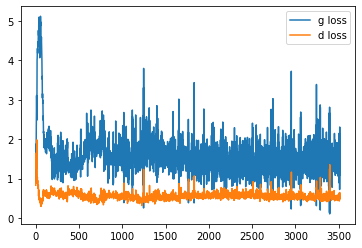

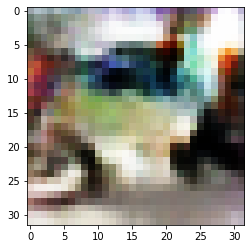

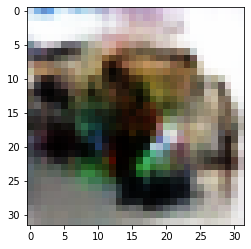

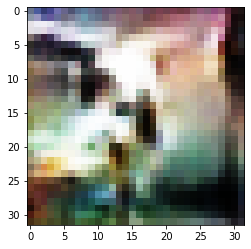

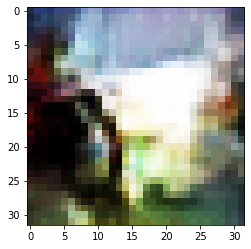

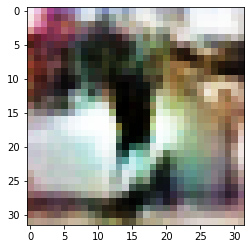

it: 3719; g_loss: 0.9744130373001099; d_loss: 0.5510530471801758; avg_real_score: 0.5127884149551392; avg_fake_score: 0.4008238911628723: : 199it [00:14, 15.21it/s] 

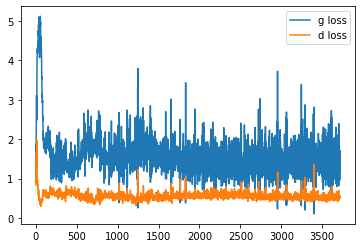

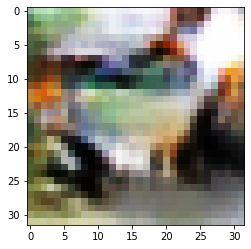

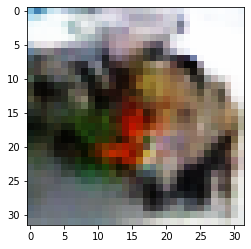

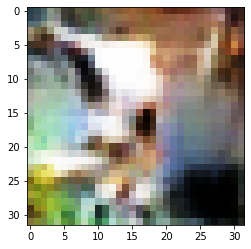

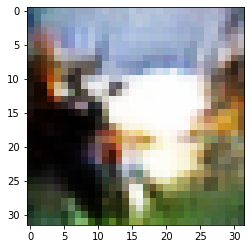

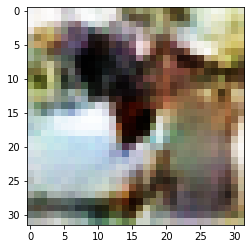

it: 3909; g_loss: 0.7731353640556335; d_loss: 0.5537586808204651; avg_real_score: 0.45025888085365295; avg_fake_score: 0.48439955711364746: : 391it [00:27, 14.10it/s]
it: 3910; g_loss: 1.521333932876587; d_loss: 0.6295856237411499; avg_real_score: 0.6953026056289673; avg_fake_score: 0.2463063895702362: : 0it [00:00, ?it/s]

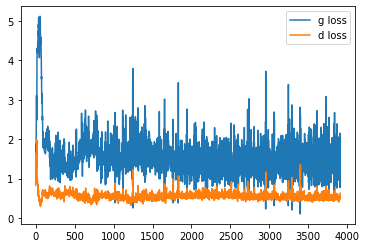

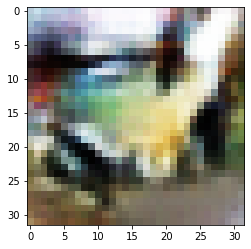

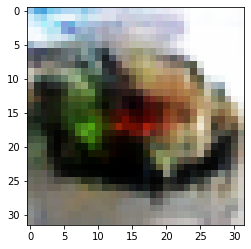

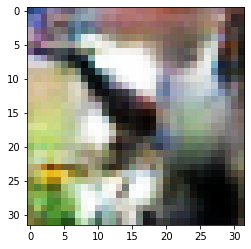

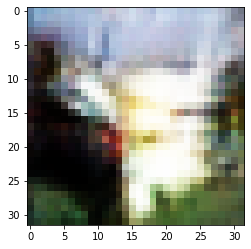

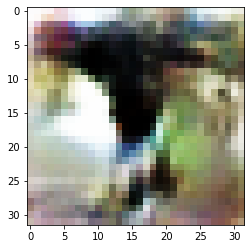

it: 4110; g_loss: 1.3434669971466064; d_loss: 0.49472564458847046; avg_real_score: 0.6034082174301147; avg_fake_score: 0.28360146284103394: : 199it [00:14, 15.49it/s]

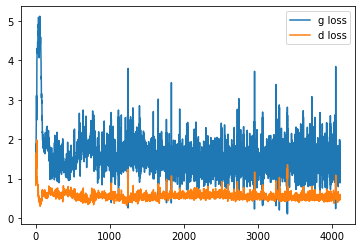

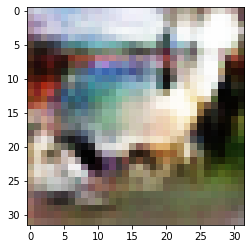

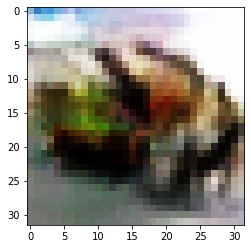

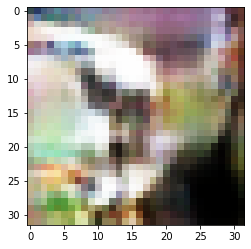

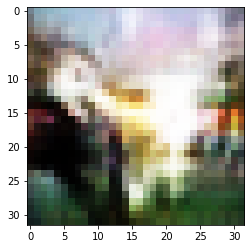

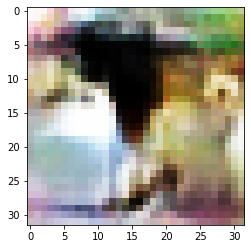

it: 4300; g_loss: 1.3700677156448364; d_loss: 0.6166166663169861; avg_real_score: 0.46564966440200806; avg_fake_score: 0.27631083130836487: : 391it [00:27, 14.11it/s]
it: 4301; g_loss: 1.179626226425171; d_loss: 0.536243736743927; avg_real_score: 0.6006792783737183; avg_fake_score: 0.3310179114341736: : 0it [00:00, ?it/s]

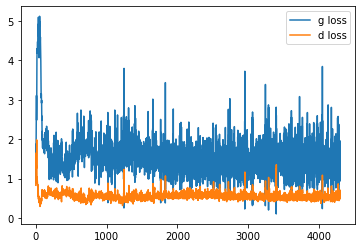

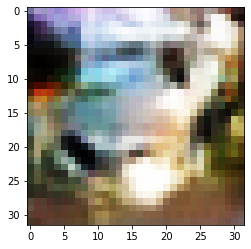

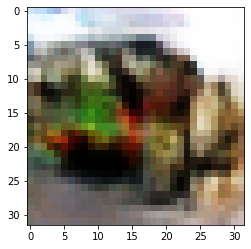

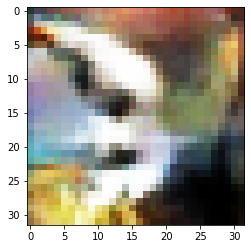

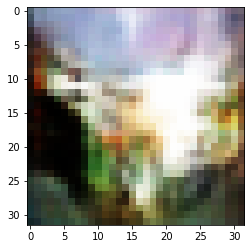

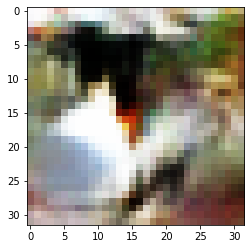

it: 4501; g_loss: 1.5132389068603516; d_loss: 0.5405994057655334; avg_real_score: 0.6683799028396606; avg_fake_score: 0.247528076171875: : 199it [00:14, 14.83it/s]  

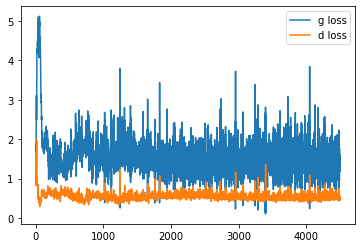

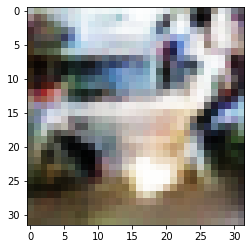

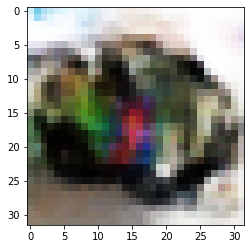

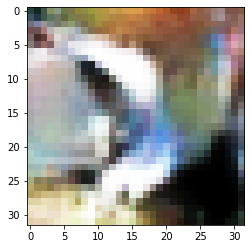

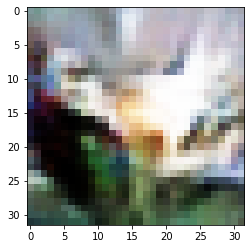

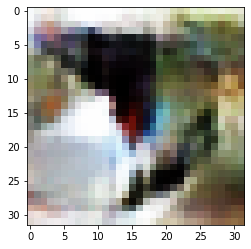

it: 4691; g_loss: 2.164227247238159; d_loss: 0.5170353651046753; avg_real_score: 0.7325162291526794; avg_fake_score: 0.13122549653053284: : 391it [00:28, 13.88it/s]
it: 4692; g_loss: 0.6289922595024109; d_loss: 0.5919591784477234; avg_real_score: 0.4347444772720337; avg_fake_score: 0.5551069974899292: : 0it [00:00, ?it/s]

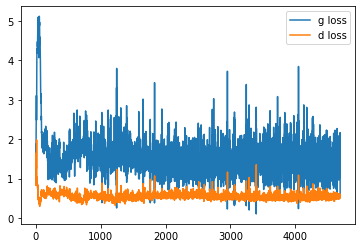

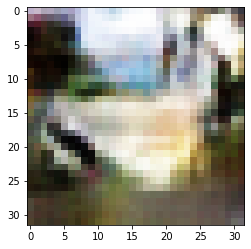

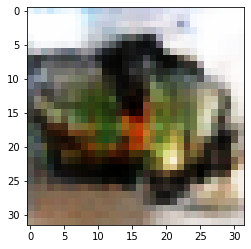

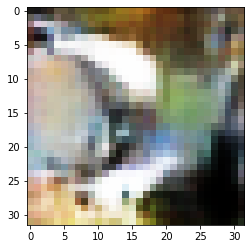

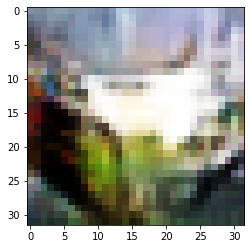

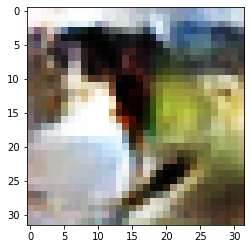

it: 4892; g_loss: 1.470203161239624; d_loss: 0.4240354001522064; avg_real_score: 0.6151990294456482; avg_fake_score: 0.2594987154006958: : 199it [00:14, 14.51it/s] 

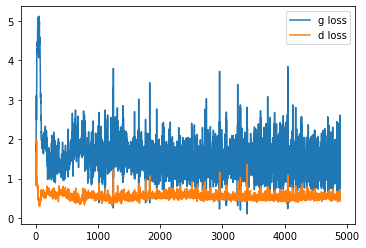

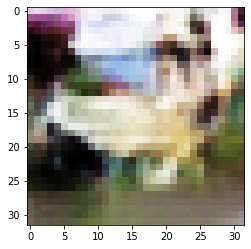

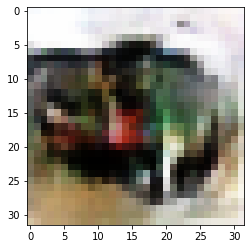

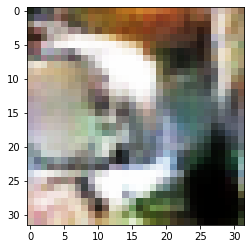

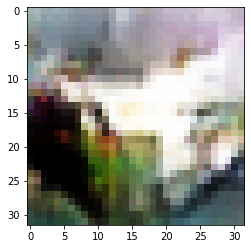

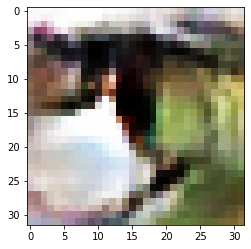

it: 5082; g_loss: 1.473949909210205; d_loss: 0.5890464782714844; avg_real_score: 0.6420261263847351; avg_fake_score: 0.24966716766357422: : 391it [00:28, 13.58it/s]
it: 5083; g_loss: 1.3638856410980225; d_loss: 0.4963642358779907; avg_real_score: 0.5913143157958984; avg_fake_score: 0.28436654806137085: : 0it [00:00, ?it/s]

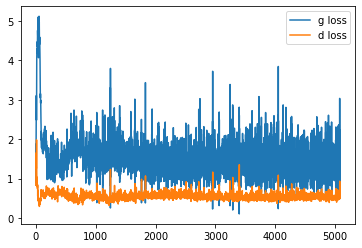

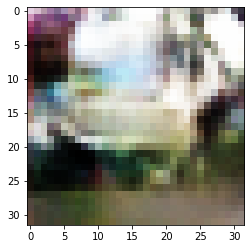

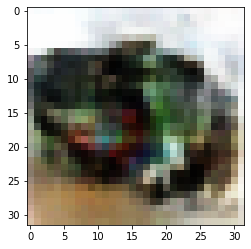

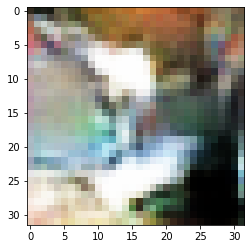

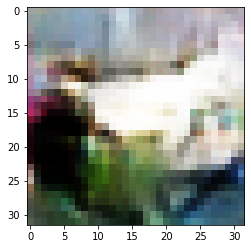

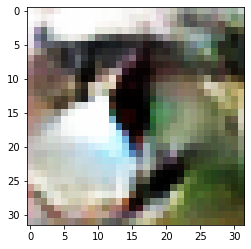

it: 5283; g_loss: 1.546575903892517; d_loss: 0.4871760308742523; avg_real_score: 0.6993764042854309; avg_fake_score: 0.23643815517425537: : 199it [00:14, 14.54it/s]

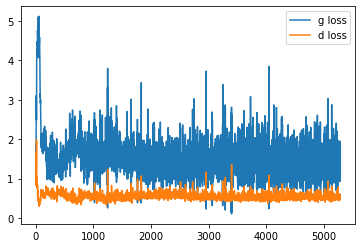

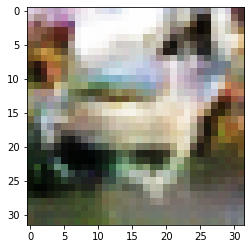

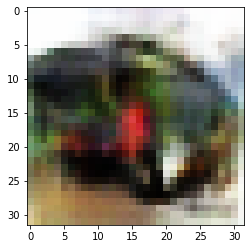

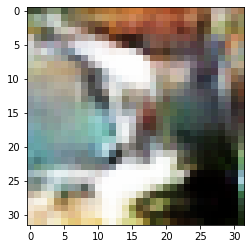

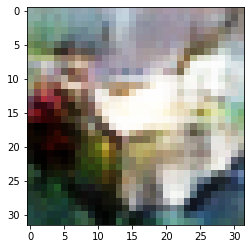

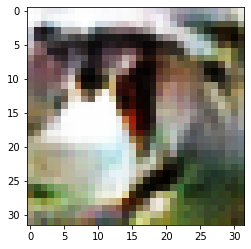

it: 5473; g_loss: 0.768242359161377; d_loss: 0.5275507569313049; avg_real_score: 0.5104056596755981; avg_fake_score: 0.49197903275489807: : 391it [00:28, 13.50it/s]
it: 5474; g_loss: 1.8542590141296387; d_loss: 0.67643141746521; avg_real_score: 0.669952392578125; avg_fake_score: 0.17831826210021973: : 0it [00:00, ?it/s]

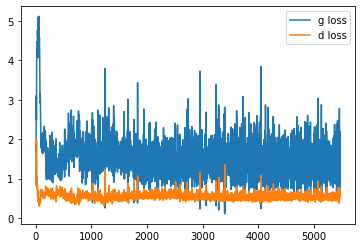

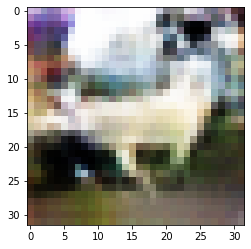

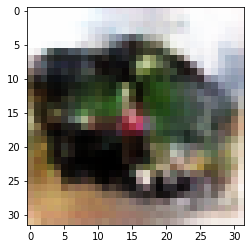

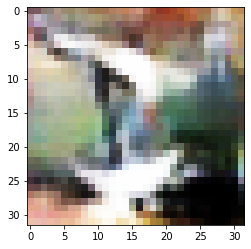

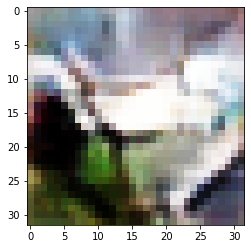

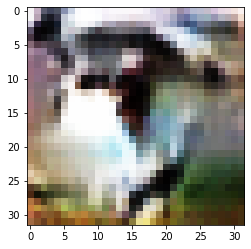

it: 5674; g_loss: 0.9085639715194702; d_loss: 0.5594065189361572; avg_real_score: 0.5548903942108154; avg_fake_score: 0.42988941073417664: : 199it [00:15, 13.75it/s]

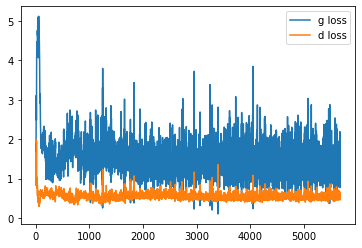

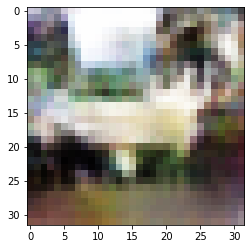

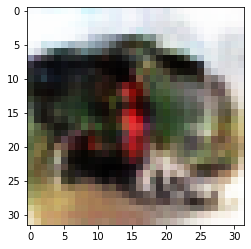

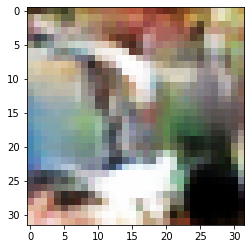

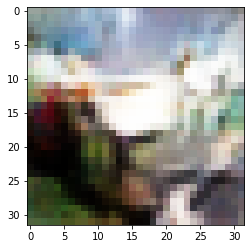

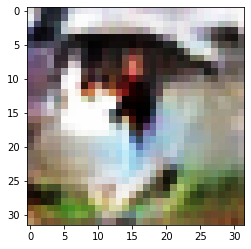

it: 5864; g_loss: 1.8166099786758423; d_loss: 0.5298277735710144; avg_real_score: 0.7619728446006775; avg_fake_score: 0.1863604635000229: : 391it [00:29, 13.17it/s]
it: 5865; g_loss: 1.0921130180358887; d_loss: 0.5756909847259521; avg_real_score: 0.48135146498680115; avg_fake_score: 0.35961881279945374: : 0it [00:00, ?it/s]

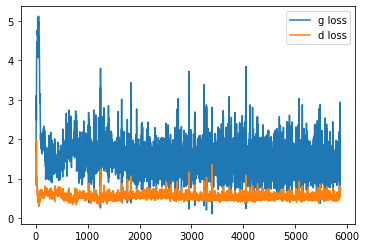

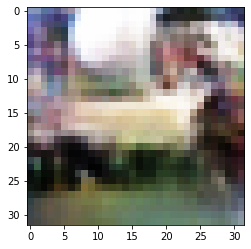

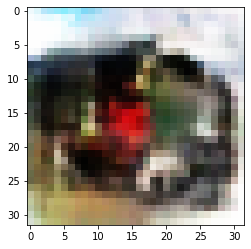

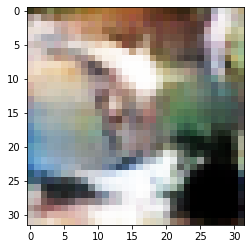

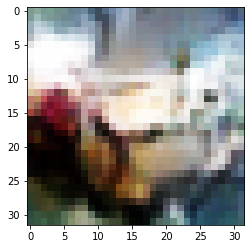

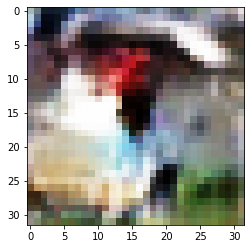

it: 6065; g_loss: 1.819633960723877; d_loss: 0.6609803438186646; avg_real_score: 0.7083253860473633; avg_fake_score: 0.18296512961387634: : 199it [00:15, 13.77it/s]

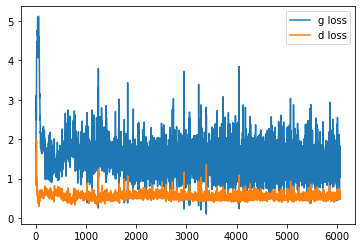

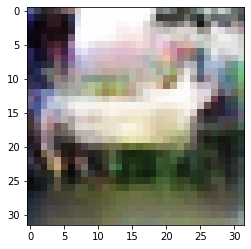

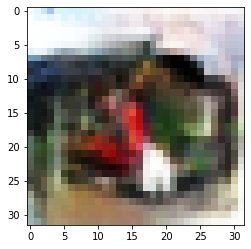

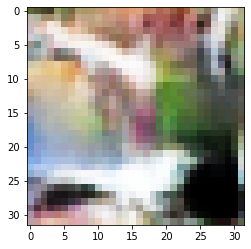

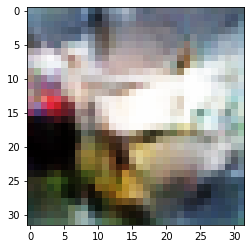

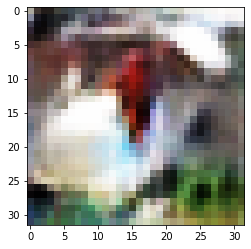

it: 6255; g_loss: 1.801608681678772; d_loss: 0.6373698711395264; avg_real_score: 0.6455219984054565; avg_fake_score: 0.18448002636432648: : 391it [00:29, 13.04it/s]
it: 6256; g_loss: 0.9318782091140747; d_loss: 0.4928441047668457; avg_real_score: 0.5413625240325928; avg_fake_score: 0.41341903805732727: : 0it [00:00, ?it/s]

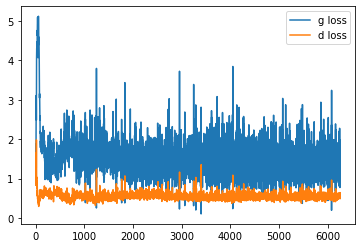

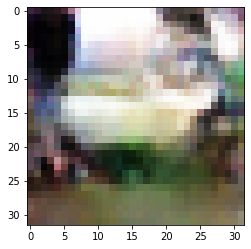

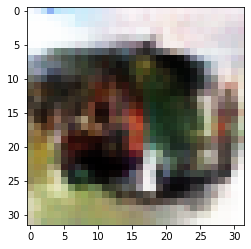

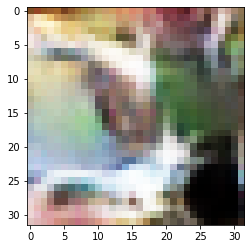

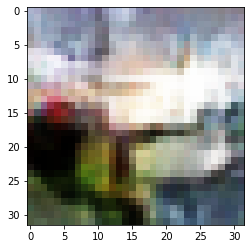

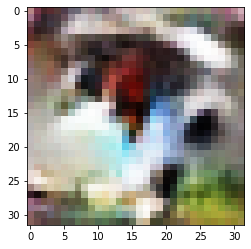

it: 6456; g_loss: 0.814102828502655; d_loss: 0.5141628980636597; avg_real_score: 0.5351521968841553; avg_fake_score: 0.46497154235839844: : 199it [00:15, 14.32it/s] 

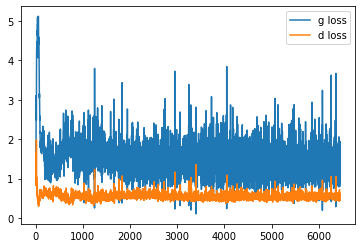

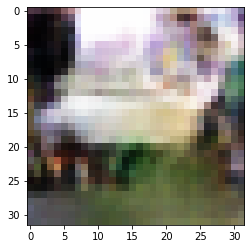

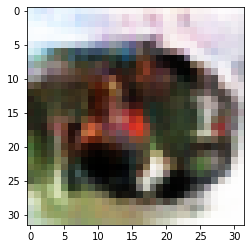

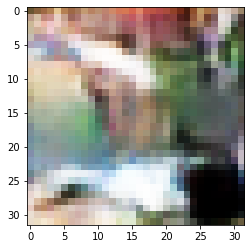

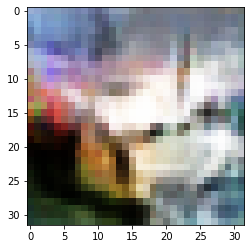

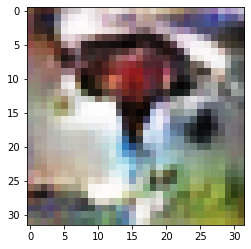

it: 6646; g_loss: 1.8221635818481445; d_loss: 0.4810144901275635; avg_real_score: 0.704574465751648; avg_fake_score: 0.1795007735490799: : 391it [00:29, 13.22it/s]
it: 6647; g_loss: 0.8766432404518127; d_loss: 0.6021813750267029; avg_real_score: 0.47948792576789856; avg_fake_score: 0.43637001514434814: : 0it [00:00, ?it/s]

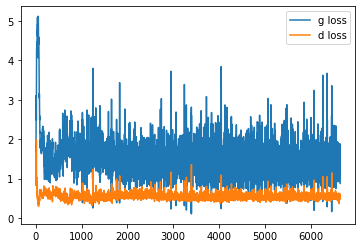

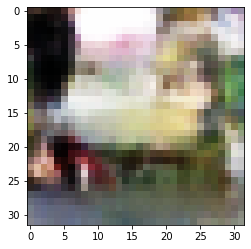

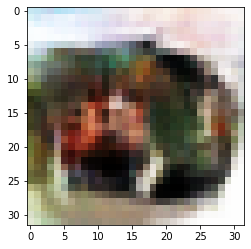

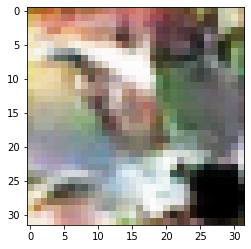

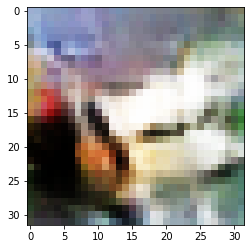

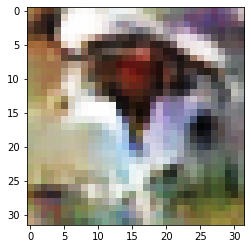

it: 6847; g_loss: 1.6351792812347412; d_loss: 0.524593710899353; avg_real_score: 0.6629976034164429; avg_fake_score: 0.21509823203086853: : 199it [00:15, 14.12it/s]

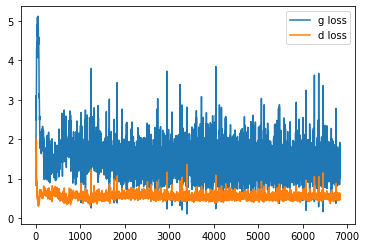

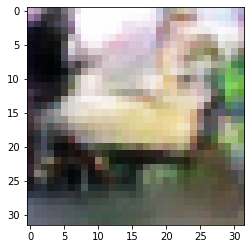

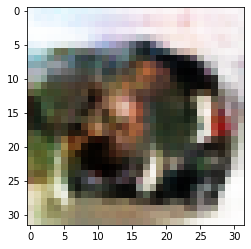

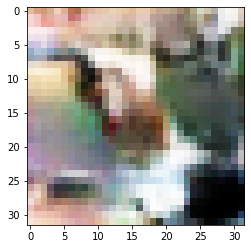

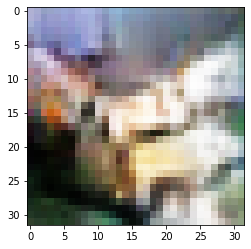

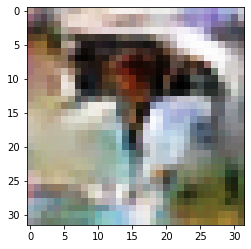

it: 7037; g_loss: 0.8838185667991638; d_loss: 0.6565132737159729; avg_real_score: 0.4049626290798187; avg_fake_score: 0.4358638823032379: : 391it [00:29, 13.21it/s]
it: 7038; g_loss: 1.6325395107269287; d_loss: 0.5059877038002014; avg_real_score: 0.735308051109314; avg_fake_score: 0.21633771061897278: : 0it [00:00, ?it/s]

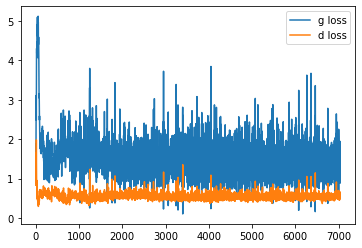

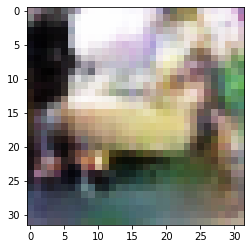

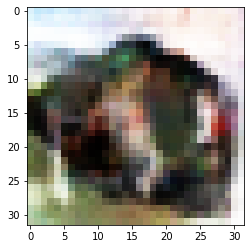

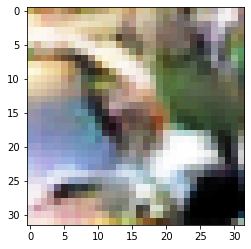

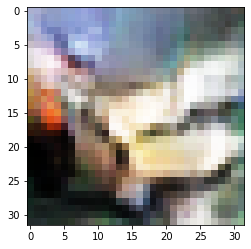

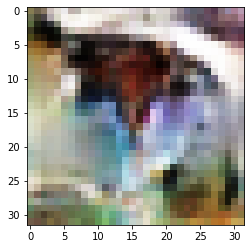

it: 7238; g_loss: 1.190151333808899; d_loss: 0.5207780003547668; avg_real_score: 0.6110724210739136; avg_fake_score: 0.3322103023529053: : 199it [00:15, 14.20it/s]   

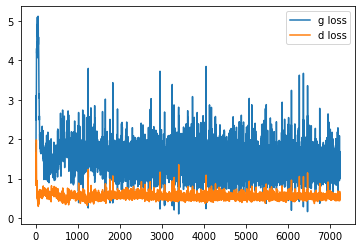

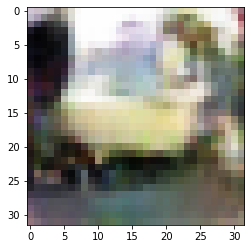

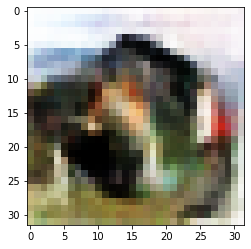

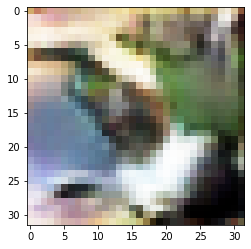

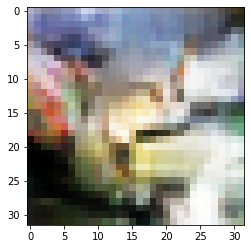

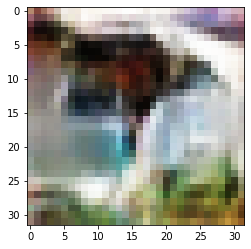

it: 7428; g_loss: 1.1208598613739014; d_loss: 0.49537551403045654; avg_real_score: 0.5829213261604309; avg_fake_score: 0.34738728404045105: : 391it [00:29, 13.22it/s]
it: 7429; g_loss: 2.234117031097412; d_loss: 0.5170577168464661; avg_real_score: 0.7791767120361328; avg_fake_score: 0.126743882894516: : 0it [00:00, ?it/s]

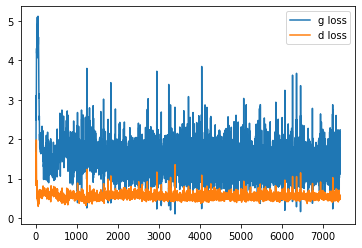

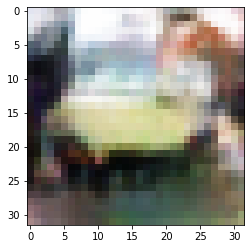

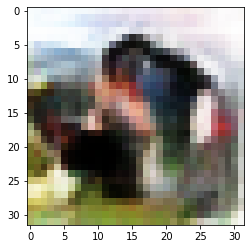

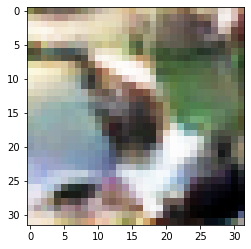

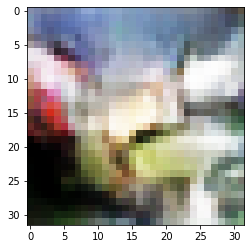

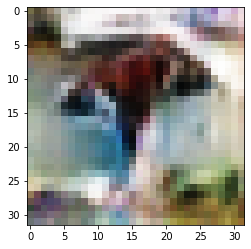

it: 7629; g_loss: 1.2084932327270508; d_loss: 0.5332248210906982; avg_real_score: 0.550416111946106; avg_fake_score: 0.3317537009716034: : 199it [00:15, 13.97it/s] 

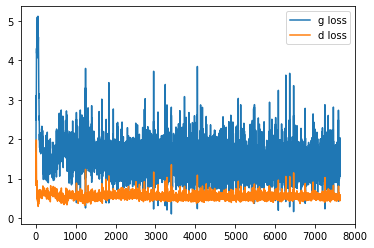

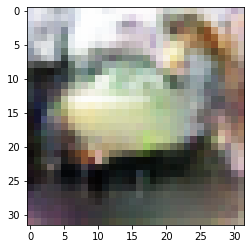

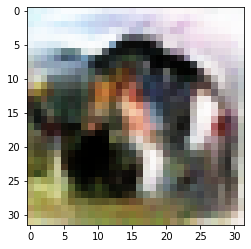

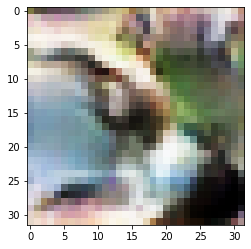

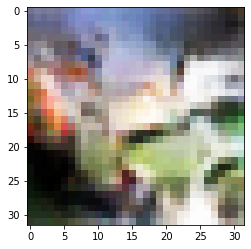

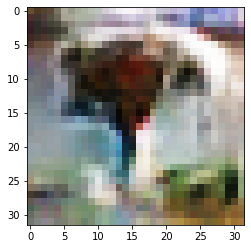

it: 7819; g_loss: 1.4747730493545532; d_loss: 0.5531272888183594; avg_real_score: 0.6275245547294617; avg_fake_score: 0.2588832378387451: : 391it [00:29, 13.20it/s]
it: 7820; g_loss: 1.4112378358840942; d_loss: 0.47838449478149414; avg_real_score: 0.6182299256324768; avg_fake_score: 0.2700042426586151: : 0it [00:00, ?it/s]

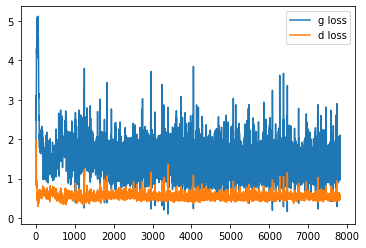

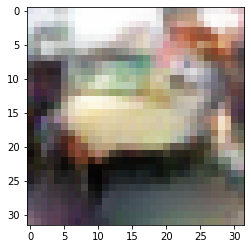

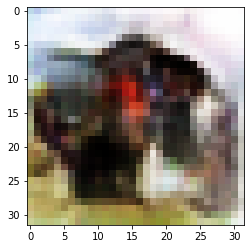

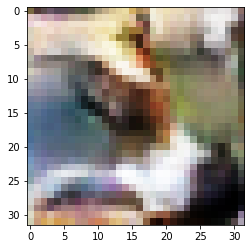

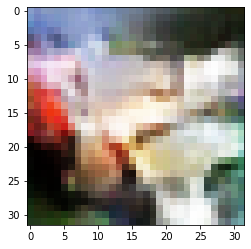

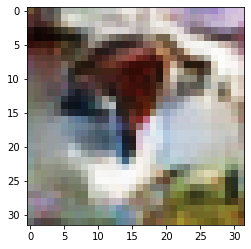

it: 8020; g_loss: 1.5284409523010254; d_loss: 0.5139297246932983; avg_real_score: 0.6569387912750244; avg_fake_score: 0.24317383766174316: : 199it [00:15, 13.96it/s]

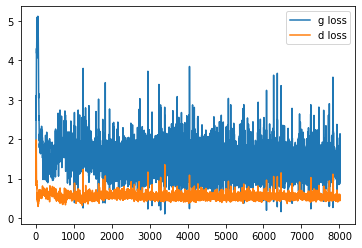

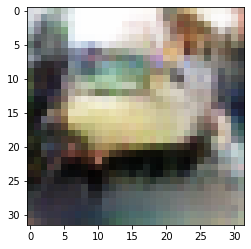

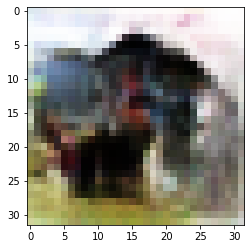

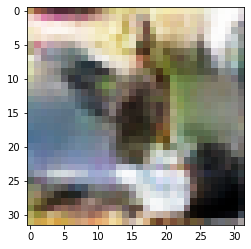

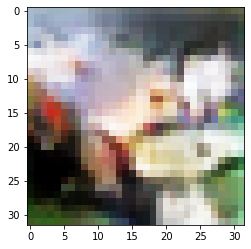

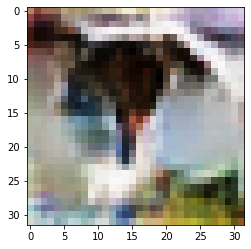

it: 8210; g_loss: 0.9958685040473938; d_loss: 0.4967808127403259; avg_real_score: 0.556492269039154; avg_fake_score: 0.39727985858917236: : 391it [00:29, 13.12it/s]
it: 8211; g_loss: 2.052199363708496; d_loss: 0.5693463683128357; avg_real_score: 0.7373328804969788; avg_fake_score: 0.14868944883346558: : 0it [00:00, ?it/s]

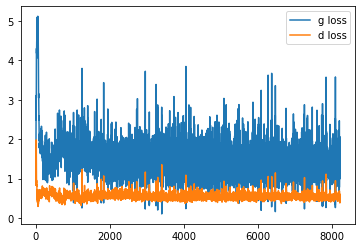

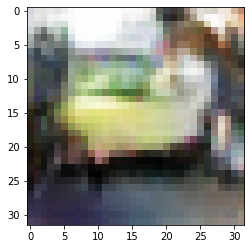

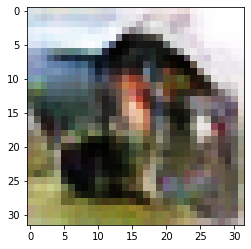

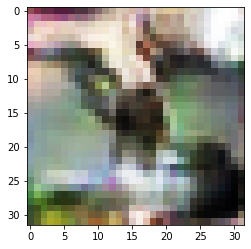

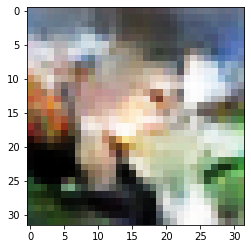

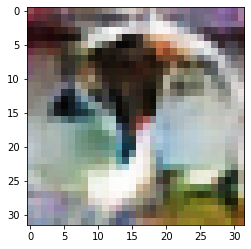

it: 8411; g_loss: 1.1932753324508667; d_loss: 0.49062633514404297; avg_real_score: 0.6080318689346313; avg_fake_score: 0.3301597237586975: : 199it [00:15, 13.90it/s]

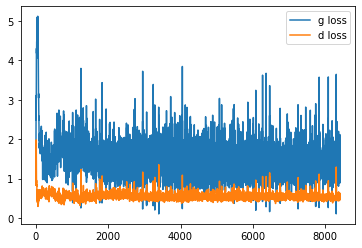

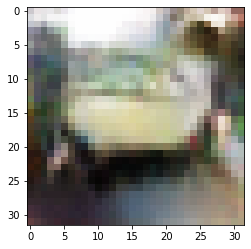

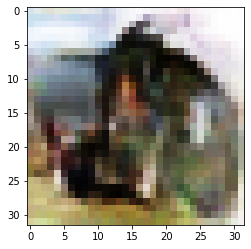

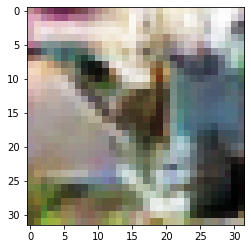

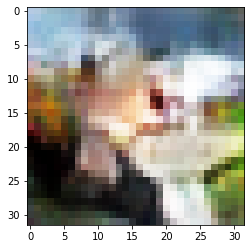

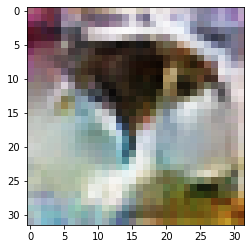

it: 8601; g_loss: 1.4818875789642334; d_loss: 0.39999955892562866; avg_real_score: 0.6363628506660461; avg_fake_score: 0.24777041375637054: : 391it [00:29, 13.07it/s]
it: 8602; g_loss: 1.526540994644165; d_loss: 0.4579167366027832; avg_real_score: 0.7027459144592285; avg_fake_score: 0.24988935887813568: : 0it [00:00, ?it/s]

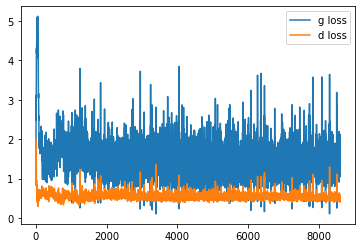

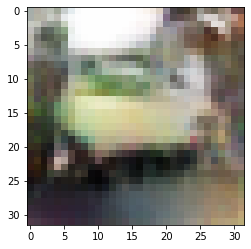

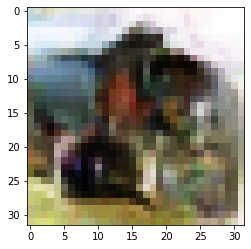

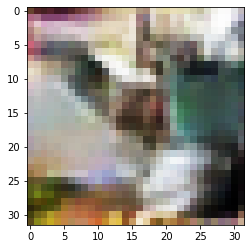

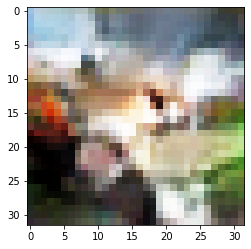

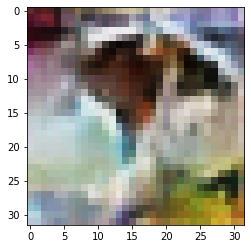

it: 8802; g_loss: 1.5989930629730225; d_loss: 0.37052297592163086; avg_real_score: 0.6796351075172424; avg_fake_score: 0.22942984104156494: : 199it [00:15, 13.67it/s]

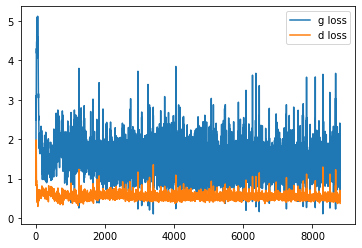

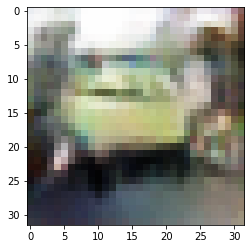

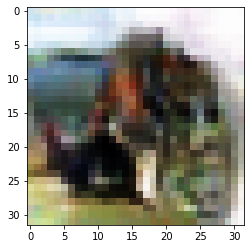

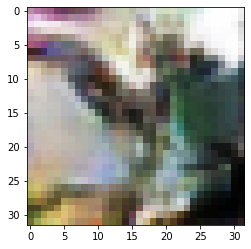

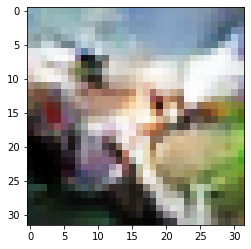

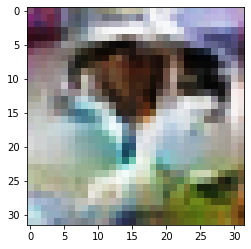

it: 8992; g_loss: 0.6120786666870117; d_loss: 0.6930203437805176; avg_real_score: 0.33658695220947266; avg_fake_score: 0.5649736523628235: : 391it [00:30, 12.87it/s]
it: 8993; g_loss: 2.2034831047058105; d_loss: 0.591318666934967; avg_real_score: 0.849927544593811; avg_fake_score: 0.13508862257003784: : 0it [00:00, ?it/s]

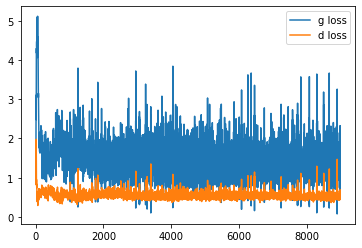

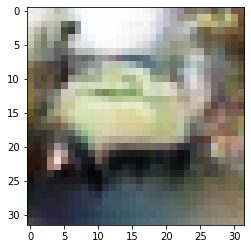

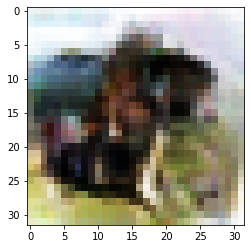

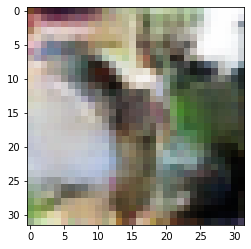

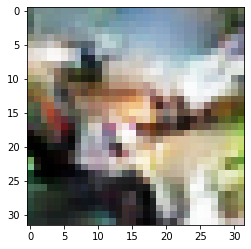

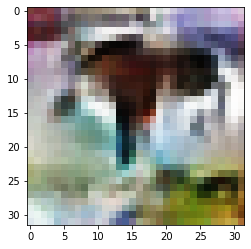

it: 9193; g_loss: 1.8462121486663818; d_loss: 0.42222338914871216; avg_real_score: 0.7350839376449585; avg_fake_score: 0.17874601483345032: : 199it [00:15, 14.13it/s]

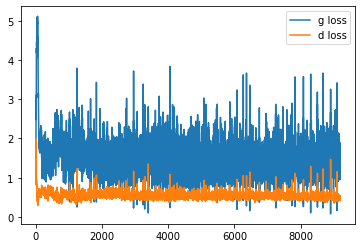

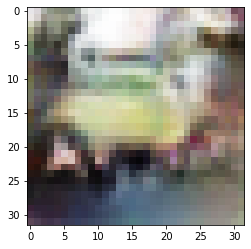

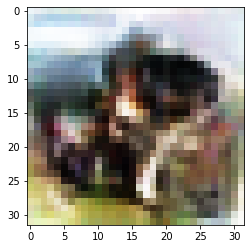

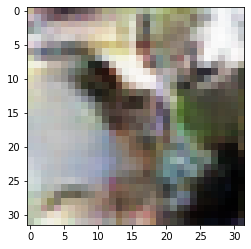

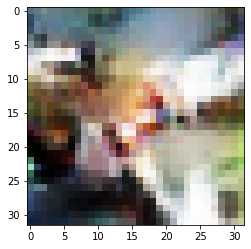

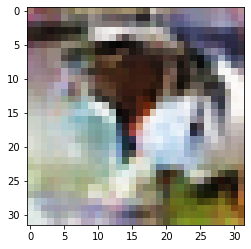

it: 9383; g_loss: 1.243429183959961; d_loss: 0.4976258873939514; avg_real_score: 0.6119462847709656; avg_fake_score: 0.30906879901885986: : 391it [00:30, 12.83it/s]
it: 9384; g_loss: 1.7146189212799072; d_loss: 0.47325313091278076; avg_real_score: 0.7093343734741211; avg_fake_score: 0.20521630346775055: : 0it [00:00, ?it/s]

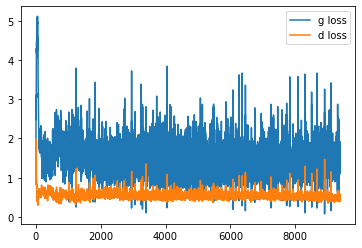

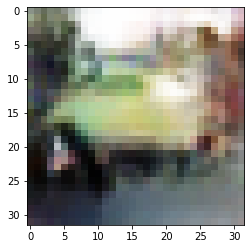

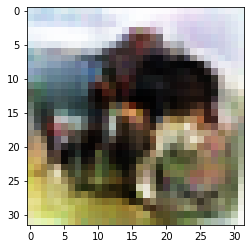

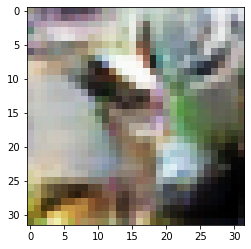

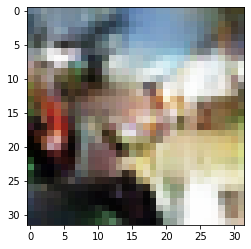

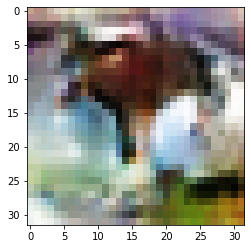

it: 9584; g_loss: 1.8314905166625977; d_loss: 0.5859788656234741; avg_real_score: 0.7393478155136108; avg_fake_score: 0.19326820969581604: : 199it [00:15, 13.83it/s] 

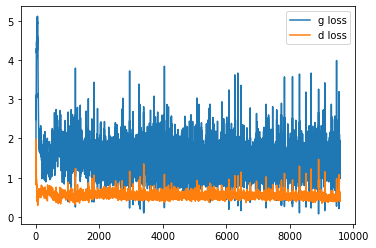

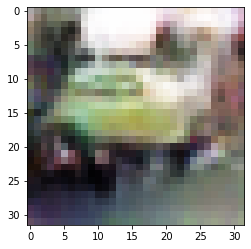

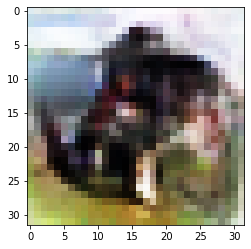

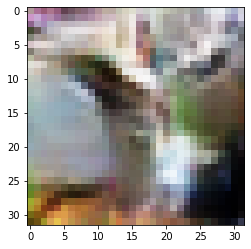

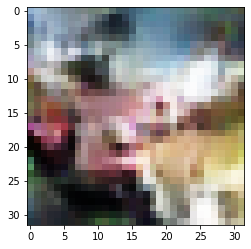

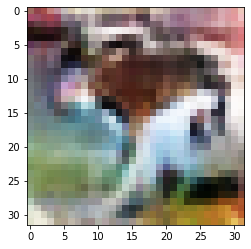

it: 9774; g_loss: 2.151198148727417; d_loss: 0.5252490043640137; avg_real_score: 0.8001940846443176; avg_fake_score: 0.1333474963903427: : 391it [00:30, 12.75it/s]
it: 9775; g_loss: 0.9514917731285095; d_loss: 0.6052601337432861; avg_real_score: 0.4221630096435547; avg_fake_score: 0.4196128249168396: : 0it [00:00, ?it/s]

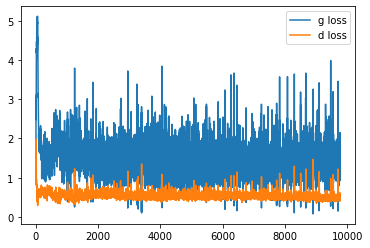

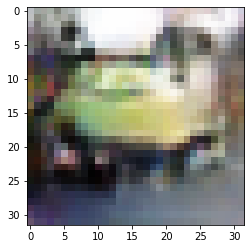

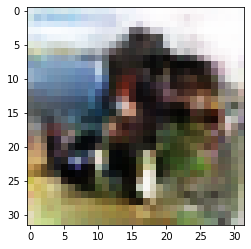

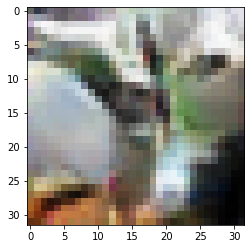

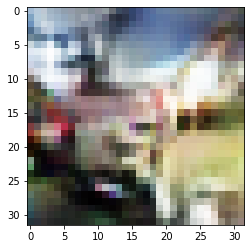

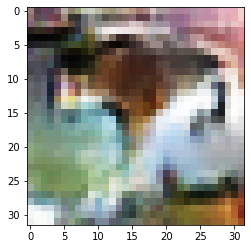

it: 9975; g_loss: 3.4598236083984375; d_loss: 1.0046699047088623; avg_real_score: 0.88051438331604; avg_fake_score: 0.042114533483982086: : 199it [00:15, 14.02it/s]  

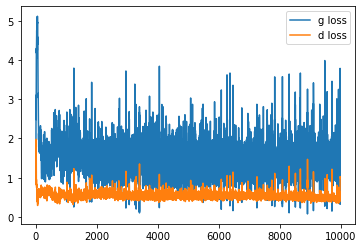

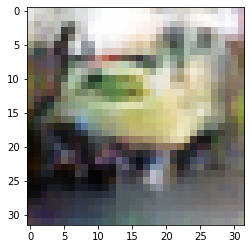

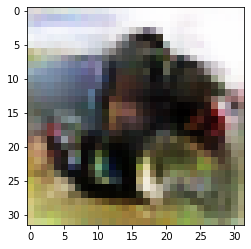

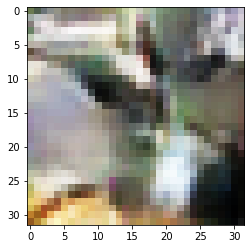

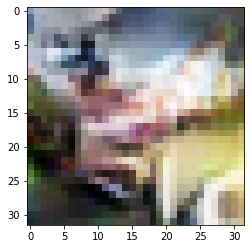

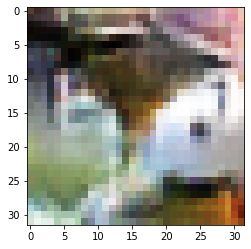

it: 10165; g_loss: 1.2912180423736572; d_loss: 0.5060935020446777; avg_real_score: 0.5693027377128601; avg_fake_score: 0.3044581115245819: : 391it [00:29, 13.08it/s]
it: 10166; g_loss: 1.7189133167266846; d_loss: 0.3762972950935364; avg_real_score: 0.7459021806716919; avg_fake_score: 0.20803019404411316: : 0it [00:00, ?it/s]

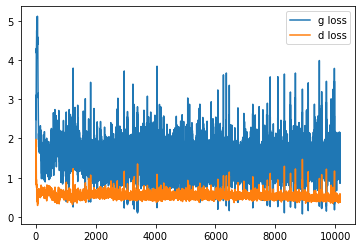

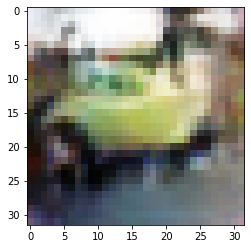

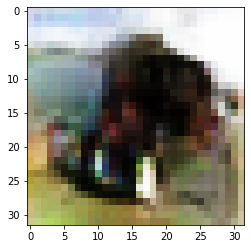

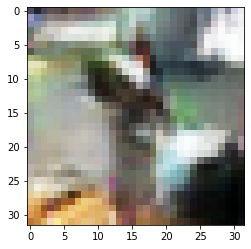

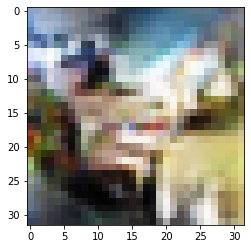

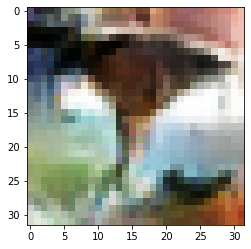

it: 10366; g_loss: 1.2617242336273193; d_loss: 0.44994181394577026; avg_real_score: 0.5789754986763; avg_fake_score: 0.3145536780357361: : 199it [00:15, 14.37it/s]   

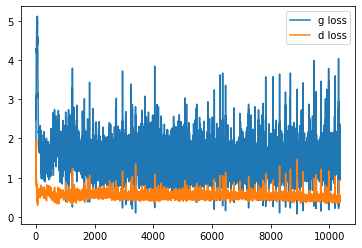

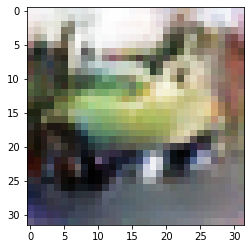

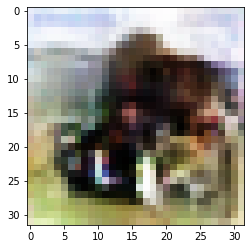

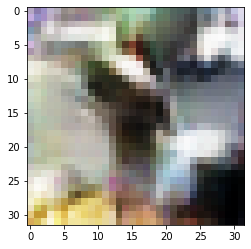

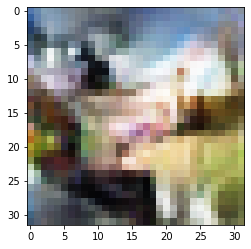

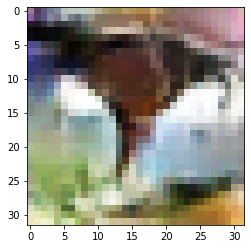

it: 10556; g_loss: 1.8686914443969727; d_loss: 0.41020989418029785; avg_real_score: 0.6837189793586731; avg_fake_score: 0.1859659105539322: : 391it [00:30, 12.92it/s]
it: 10557; g_loss: 1.2684128284454346; d_loss: 0.42402929067611694; avg_real_score: 0.6298730373382568; avg_fake_score: 0.3087734878063202: : 0it [00:00, ?it/s]

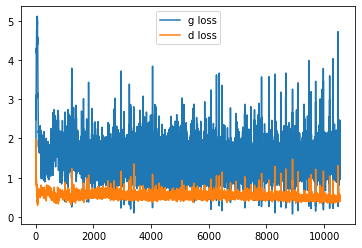

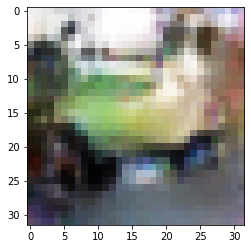

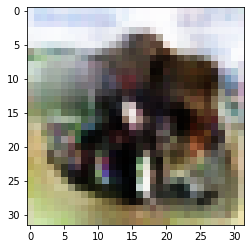

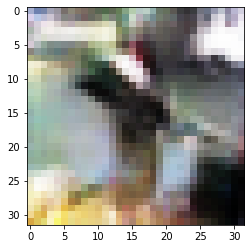

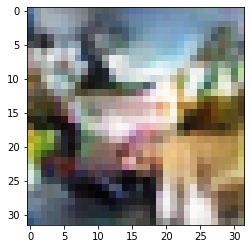

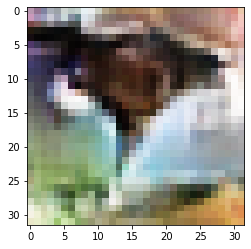

it: 10757; g_loss: 2.356187343597412; d_loss: 0.49712735414505005; avg_real_score: 0.716555118560791; avg_fake_score: 0.11395993083715439: : 199it [00:15, 14.11it/s] 

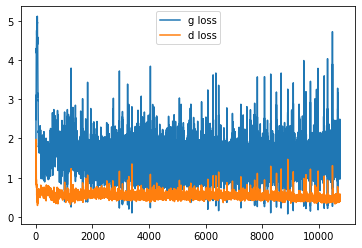

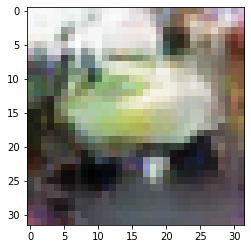

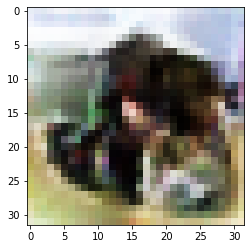

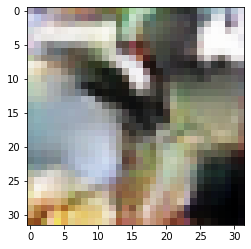

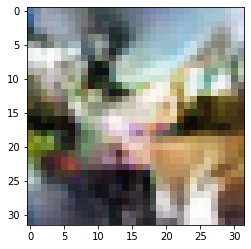

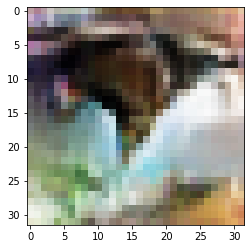

it: 10947; g_loss: 1.787822961807251; d_loss: 0.46583157777786255; avg_real_score: 0.6492264866828918; avg_fake_score: 0.19637413322925568: : 391it [00:30, 12.77it/s]
it: 10948; g_loss: 1.6639018058776855; d_loss: 0.41872137784957886; avg_real_score: 0.6775611639022827; avg_fake_score: 0.22032789885997772: : 0it [00:00, ?it/s]

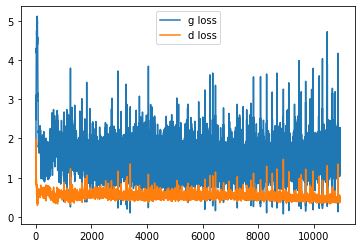

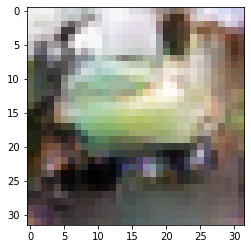

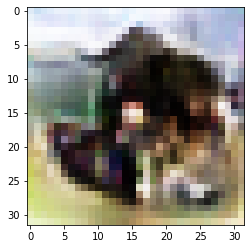

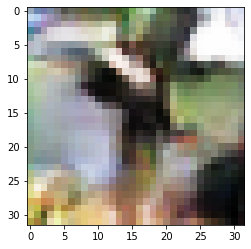

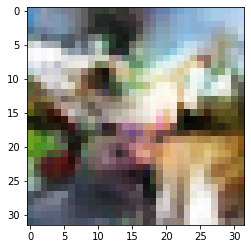

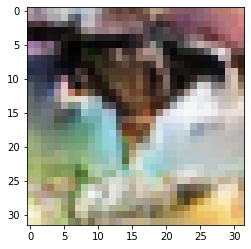

it: 11148; g_loss: 1.5271422863006592; d_loss: 0.36300235986709595; avg_real_score: 0.6555067300796509; avg_fake_score: 0.25227922201156616: : 199it [00:15, 14.60it/s]

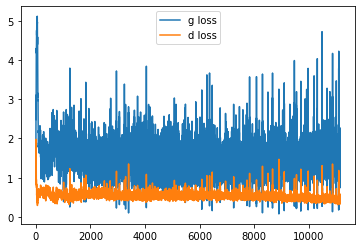

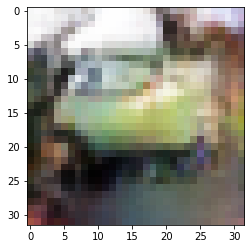

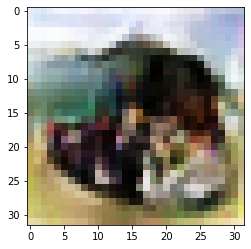

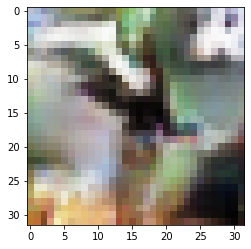

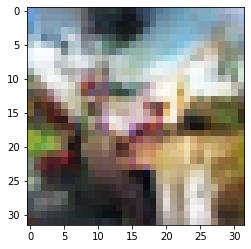

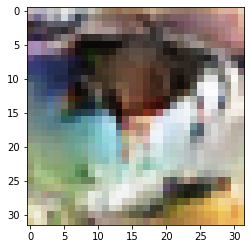

it: 11338; g_loss: 1.8638572692871094; d_loss: 0.37824365496635437; avg_real_score: 0.6578482389450073; avg_fake_score: 0.1815042346715927: : 391it [00:30, 13.01it/s]
it: 11339; g_loss: 1.9510852098464966; d_loss: 0.38970163464546204; avg_real_score: 0.7350478172302246; avg_fake_score: 0.16969311237335205: : 0it [00:00, ?it/s]

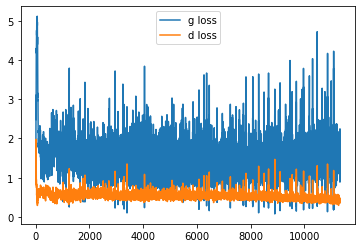

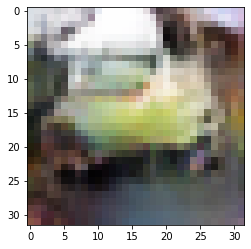

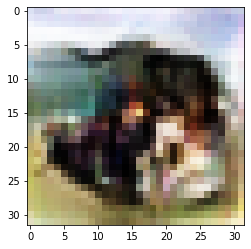

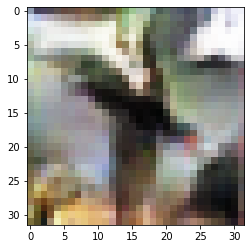

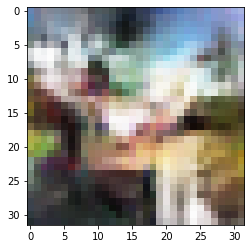

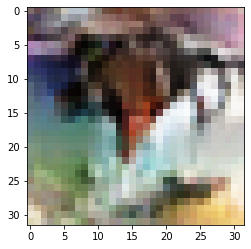

it: 11539; g_loss: 1.2632765769958496; d_loss: 0.5304570198059082; avg_real_score: 0.5821259021759033; avg_fake_score: 0.31786417961120605: : 199it [00:15, 13.90it/s]

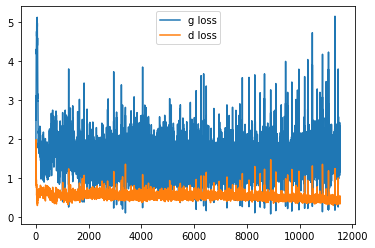

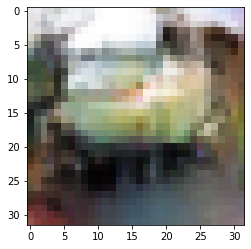

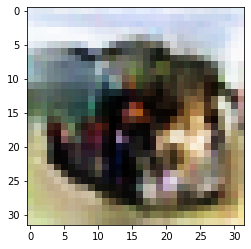

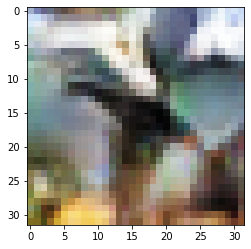

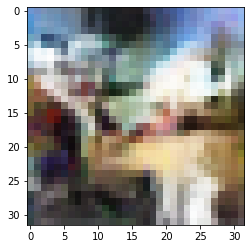

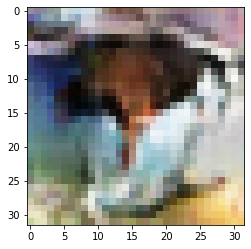

it: 11729; g_loss: 2.0625312328338623; d_loss: 0.4745824933052063; avg_real_score: 0.7424827814102173; avg_fake_score: 0.14919449388980865: : 391it [00:30, 13.03it/s]
it: 11730; g_loss: 1.5165691375732422; d_loss: 0.4364069700241089; avg_real_score: 0.6066933274269104; avg_fake_score: 0.2523542046546936: : 0it [00:00, ?it/s]

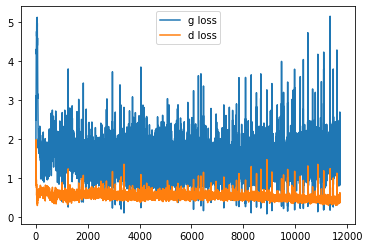

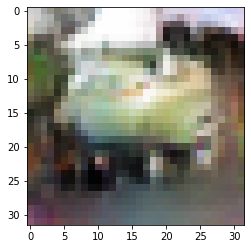

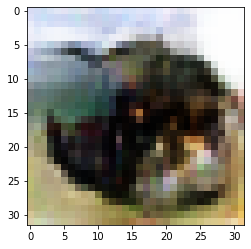

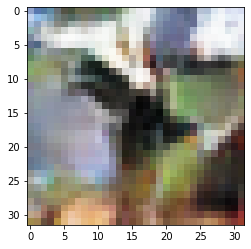

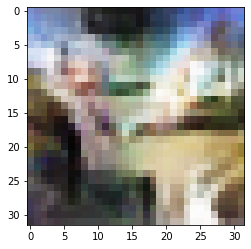

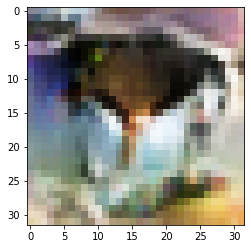

it: 11930; g_loss: 0.9039280414581299; d_loss: 0.7322573065757751; avg_real_score: 0.3003849685192108; avg_fake_score: 0.4407505393028259: : 199it [00:15, 14.02it/s] 

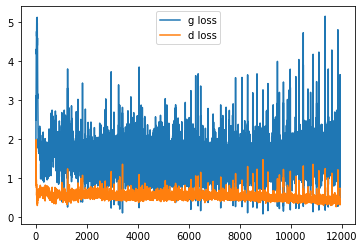

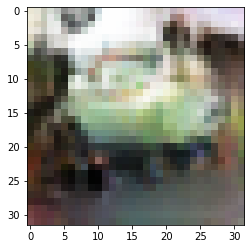

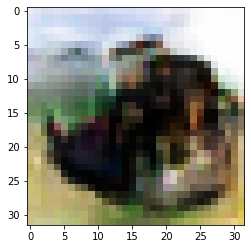

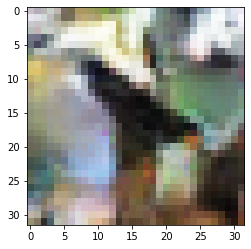

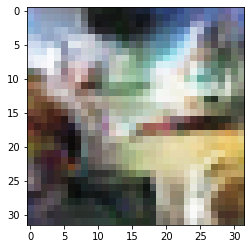

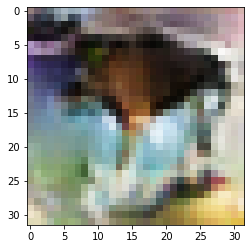

it: 12120; g_loss: 1.816422700881958; d_loss: 0.3714829087257385; avg_real_score: 0.6891991496086121; avg_fake_score: 0.18917475640773773: : 391it [00:30, 12.85it/s]
it: 12121; g_loss: 1.8157399892807007; d_loss: 0.37263303995132446; avg_real_score: 0.7490695714950562; avg_fake_score: 0.19848185777664185: : 0it [00:00, ?it/s]

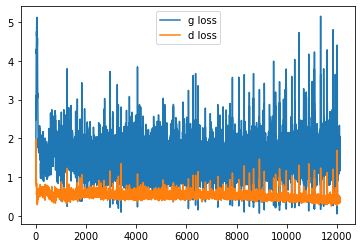

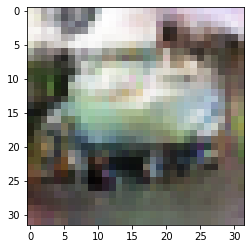

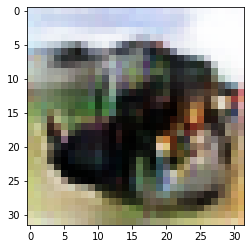

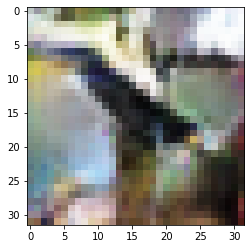

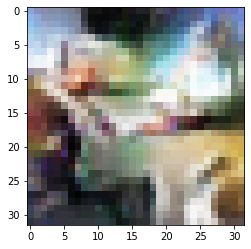

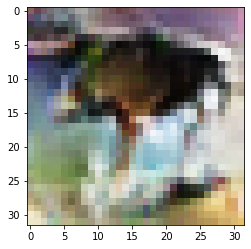

it: 12321; g_loss: 1.8238775730133057; d_loss: 0.3694007396697998; avg_real_score: 0.7380327582359314; avg_fake_score: 0.1955171823501587: : 199it [00:15, 14.35it/s] 

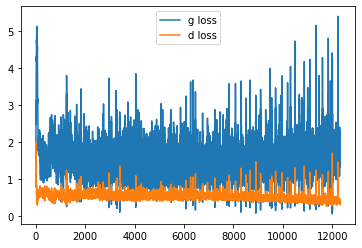

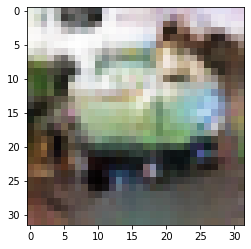

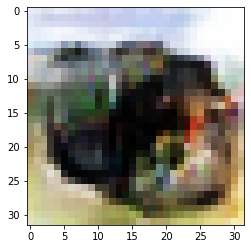

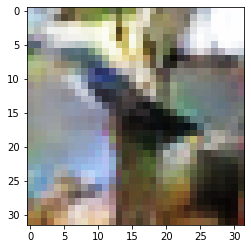

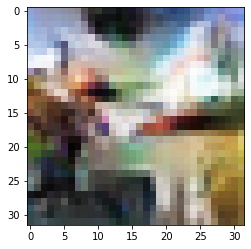

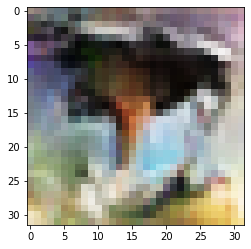

it: 12511; g_loss: 1.7898300886154175; d_loss: 0.35281825065612793; avg_real_score: 0.7257598638534546; avg_fake_score: 0.19298090040683746: : 391it [00:30, 12.93it/s]
it: 12512; g_loss: 2.221555709838867; d_loss: 0.3590691387653351; avg_real_score: 0.8055586814880371; avg_fake_score: 0.13254010677337646: : 0it [00:00, ?it/s]

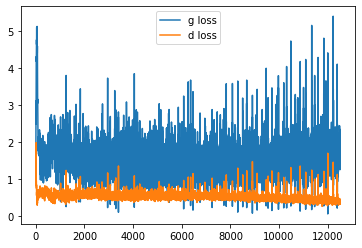

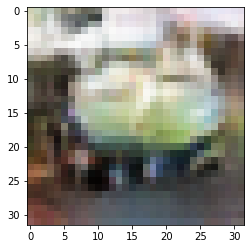

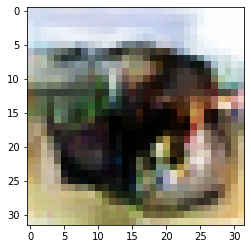

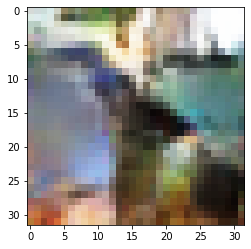

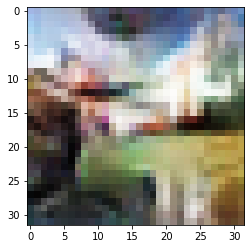

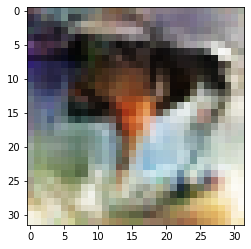

it: 12712; g_loss: 3.031334161758423; d_loss: 0.7559111714363098; avg_real_score: 0.8954967260360718; avg_fake_score: 0.06857684254646301: : 200it [00:15, 14.17it/s]  

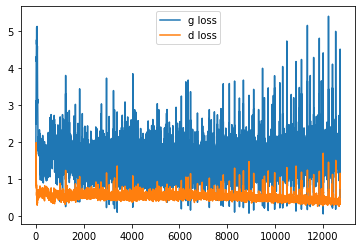

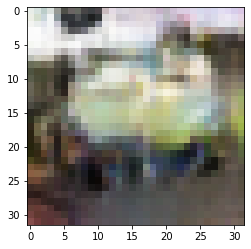

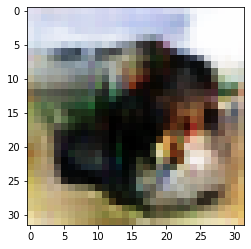

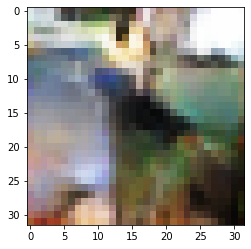

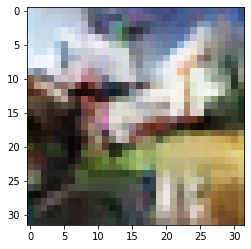

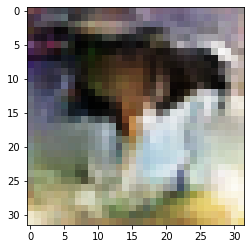

it: 12902; g_loss: 1.4529715776443481; d_loss: 0.4083878993988037; avg_real_score: 0.6251787543296814; avg_fake_score: 0.26525554060935974: : 391it [00:30, 13.01it/s]
it: 12903; g_loss: 2.1798434257507324; d_loss: 0.30072277784347534; avg_real_score: 0.8408973813056946; avg_fake_score: 0.13500721752643585: : 0it [00:00, ?it/s]

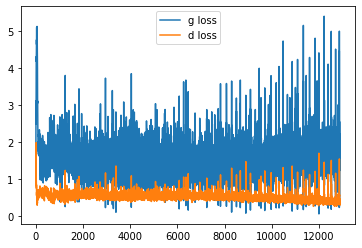

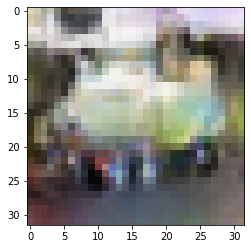

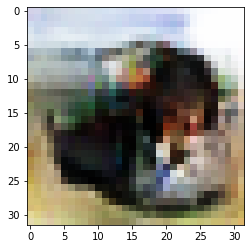

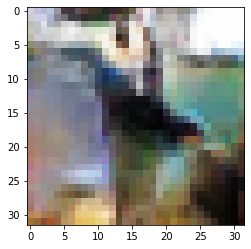

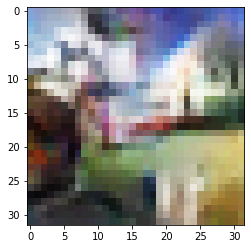

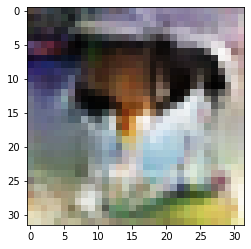

it: 13103; g_loss: 1.5175650119781494; d_loss: 0.3904455602169037; avg_real_score: 0.6474521160125732; avg_fake_score: 0.25913718342781067: : 199it [00:15, 14.26it/s]

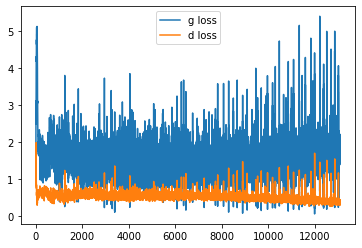

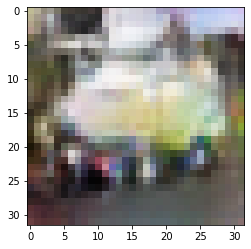

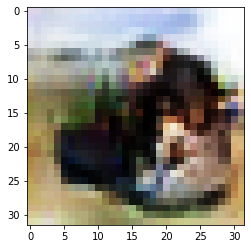

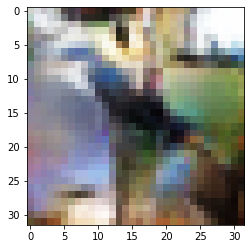

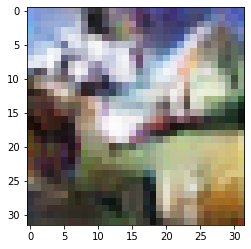

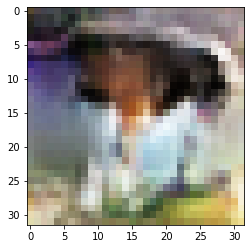

it: 13293; g_loss: 1.8764442205429077; d_loss: 0.4499412775039673; avg_real_score: 0.7629938125610352; avg_fake_score: 0.17739862203598022: : 391it [00:30, 12.89it/s]
it: 13294; g_loss: 2.003307819366455; d_loss: 0.36561673879623413; avg_real_score: 0.7315354347229004; avg_fake_score: 0.17303994297981262: : 0it [00:00, ?it/s]

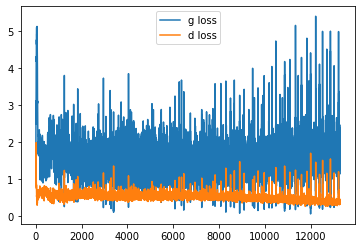

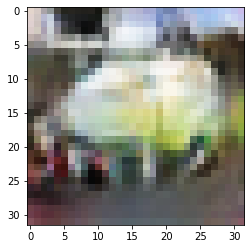

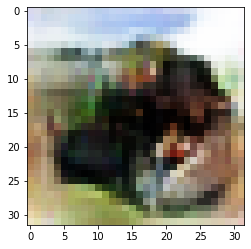

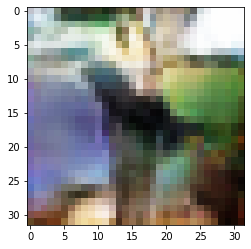

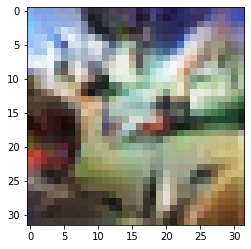

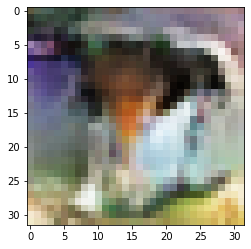

it: 13494; g_loss: 2.12467622756958; d_loss: 0.2928294837474823; avg_real_score: 0.7532016038894653; avg_fake_score: 0.1443910300731659: : 199it [00:15, 14.24it/s]  

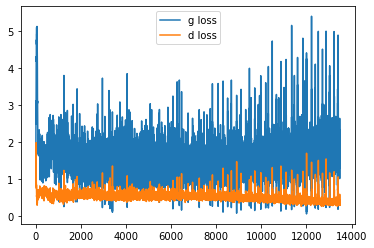

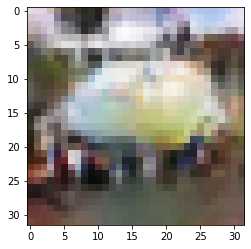

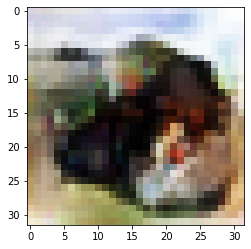

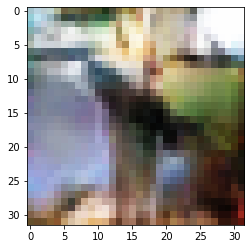

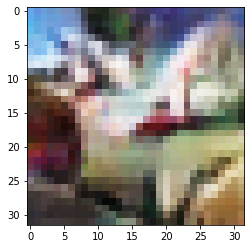

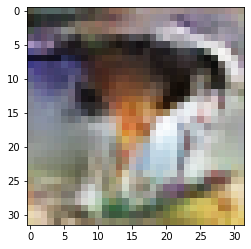

it: 13684; g_loss: 2.9007842540740967; d_loss: 0.4353443384170532; avg_real_score: 0.8362401127815247; avg_fake_score: 0.07285083085298538: : 391it [00:30, 12.78it/s]
it: 13685; g_loss: 1.2343168258666992; d_loss: 0.39344245195388794; avg_real_score: 0.5760349035263062; avg_fake_score: 0.34538906812667847: : 0it [00:00, ?it/s]

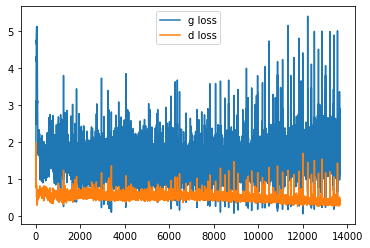

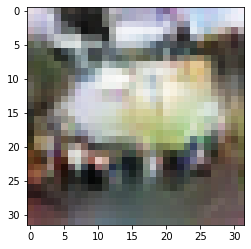

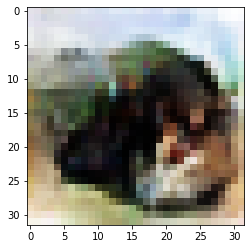

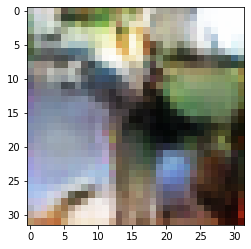

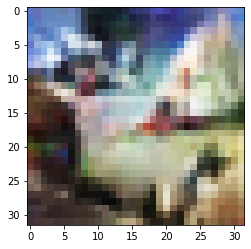

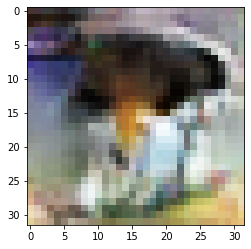

it: 13885; g_loss: 1.5446410179138184; d_loss: 0.36934587359428406; avg_real_score: 0.6142723560333252; avg_fake_score: 0.24842198193073273: : 200it [00:15, 13.45it/s]

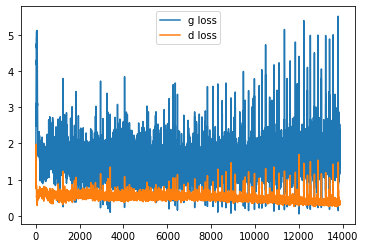

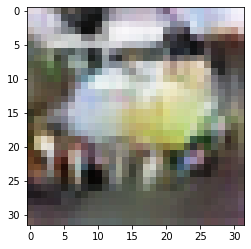

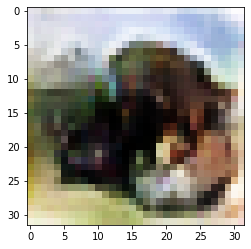

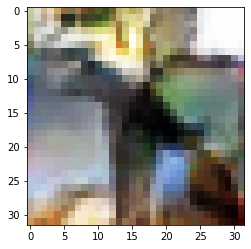

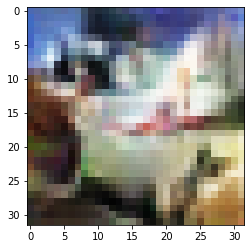

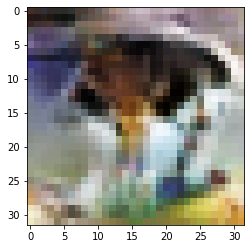

it: 14075; g_loss: 1.2139228582382202; d_loss: 0.3899562954902649; avg_real_score: 0.617434024810791; avg_fake_score: 0.327587366104126: : 391it [00:30, 12.80it/s]
it: 14076; g_loss: 2.7479195594787598; d_loss: 0.43776935338974; avg_real_score: 0.871787428855896; avg_fake_score: 0.09023323655128479: : 0it [00:00, ?it/s]

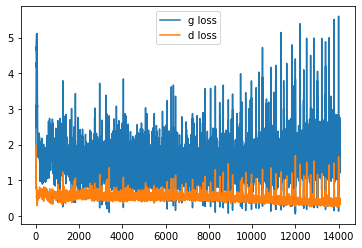

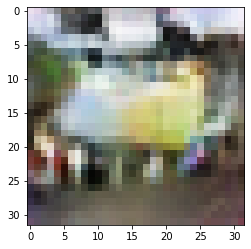

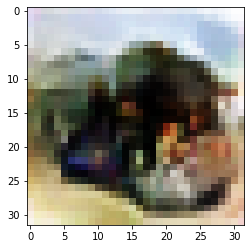

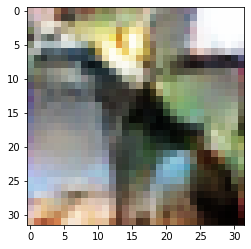

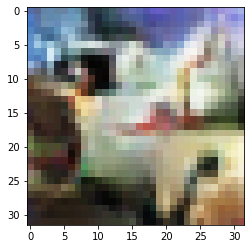

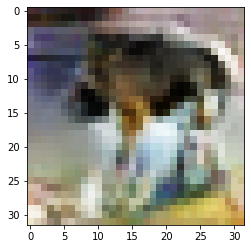

it: 14276; g_loss: 1.4435157775878906; d_loss: 0.3414759933948517; avg_real_score: 0.6722793579101562; avg_fake_score: 0.2755383253097534: : 199it [00:15, 13.81it/s] 

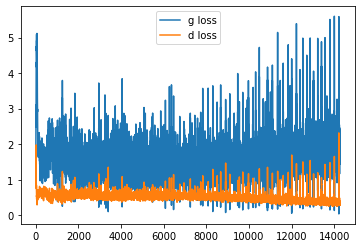

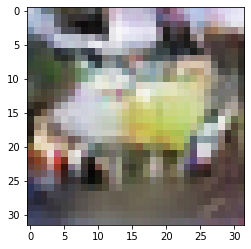

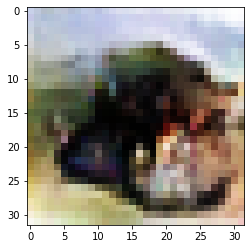

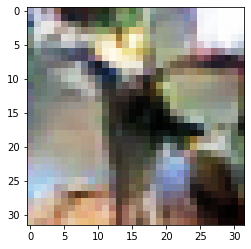

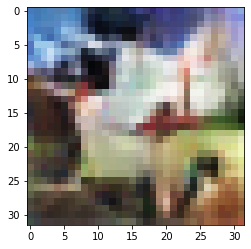

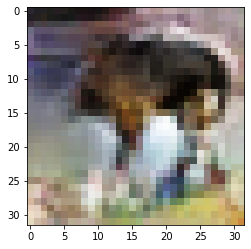

it: 14466; g_loss: 6.029101848602295; d_loss: 1.6639204025268555; avg_real_score: 0.9705933928489685; avg_fake_score: 0.006519035901874304: : 391it [00:30, 12.72it/s]
it: 14467; g_loss: 0.2677181363105774; d_loss: 1.7637730836868286; avg_real_score: 0.05538736283779144; avg_fake_score: 0.7881774306297302: : 0it [00:00, ?it/s]

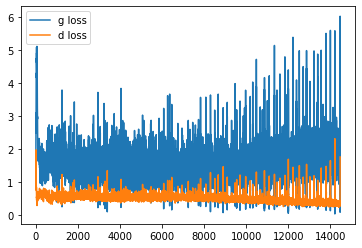

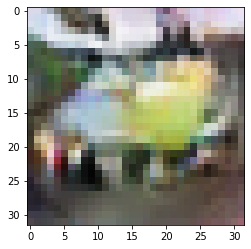

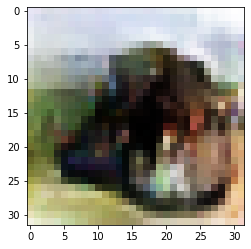

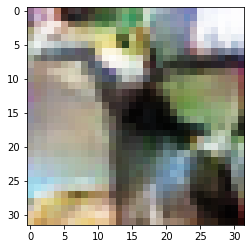

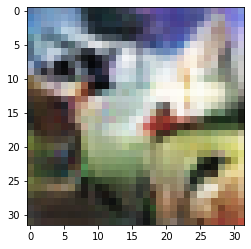

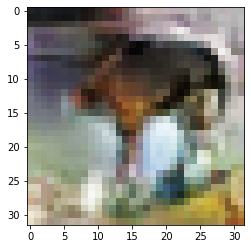

it: 14667; g_loss: 2.4547910690307617; d_loss: 0.3778475522994995; avg_real_score: 0.8211769461631775; avg_fake_score: 0.11321070790290833: : 199it [00:15, 14.04it/s]

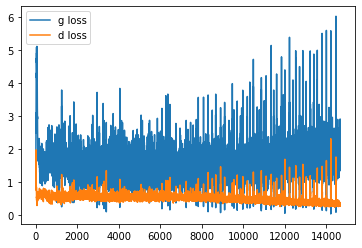

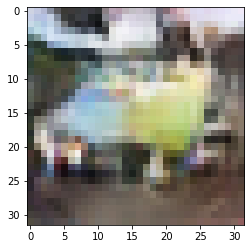

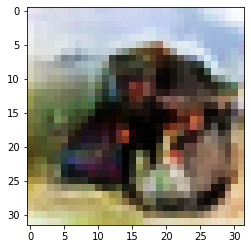

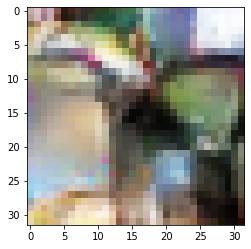

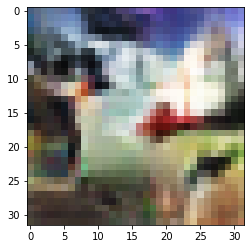

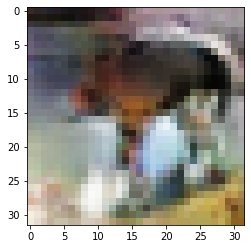

it: 14857; g_loss: 1.572637677192688; d_loss: 0.43586960434913635; avg_real_score: 0.6263462901115417; avg_fake_score: 0.2384696751832962: : 391it [00:30, 13.02it/s]
it: 14858; g_loss: 2.657810926437378; d_loss: 0.34944191575050354; avg_real_score: 0.841564953327179; avg_fake_score: 0.09804987162351608: : 0it [00:00, ?it/s]

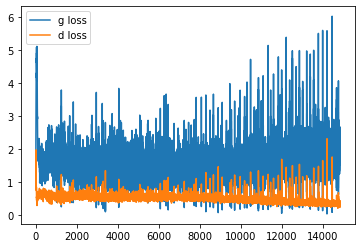

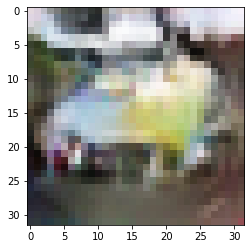

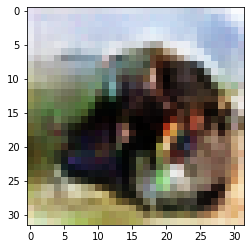

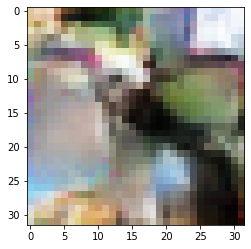

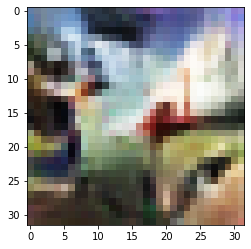

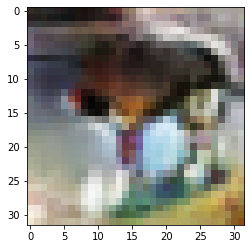

it: 15058; g_loss: 1.546562671661377; d_loss: 0.36477887630462646; avg_real_score: 0.5804870128631592; avg_fake_score: 0.2670793831348419: : 199it [00:15, 14.16it/s]

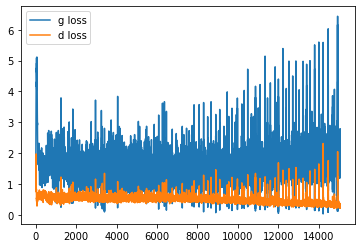

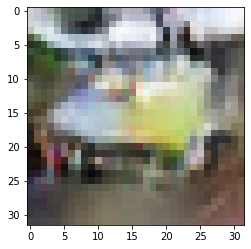

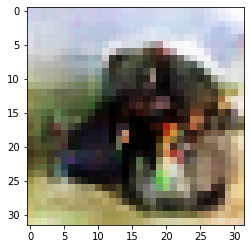

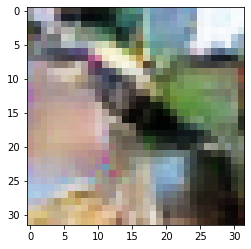

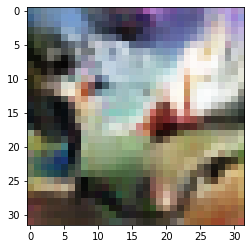

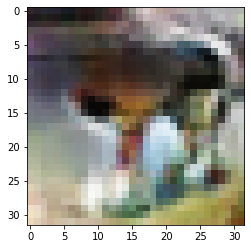

it: 15248; g_loss: 1.3628160953521729; d_loss: 0.4382500946521759; avg_real_score: 0.5441562533378601; avg_fake_score: 0.2884068489074707: : 391it [00:30, 12.94it/s]
it: 15249; g_loss: 2.371859073638916; d_loss: 0.32079362869262695; avg_real_score: 0.8706585168838501; avg_fake_score: 0.13054832816123962: : 0it [00:00, ?it/s]

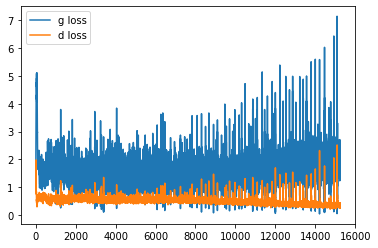

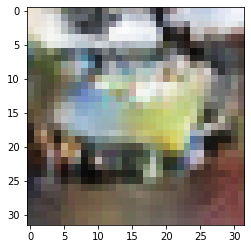

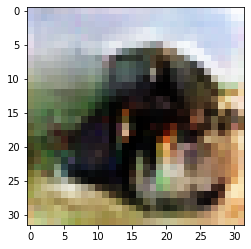

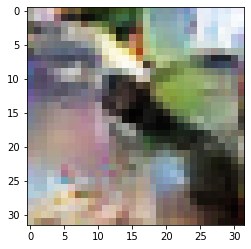

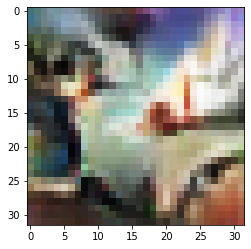

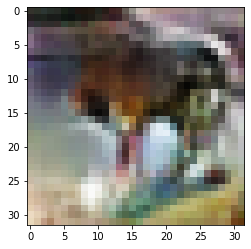

it: 15449; g_loss: 0.31864050030708313; d_loss: 1.1463258266448975; avg_real_score: 0.1631796956062317; avg_fake_score: 0.7480111718177795: : 199it [00:15, 14.83it/s]

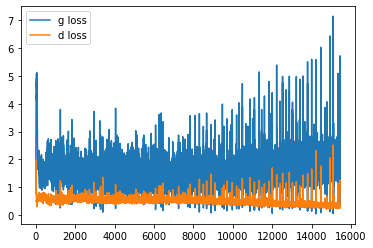

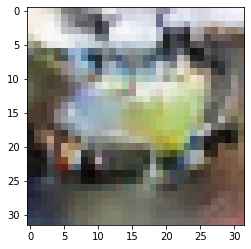

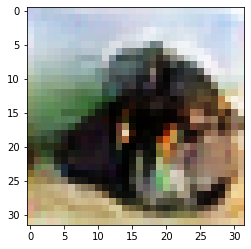

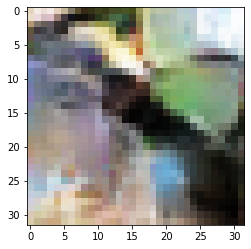

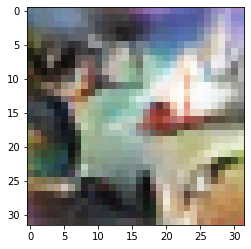

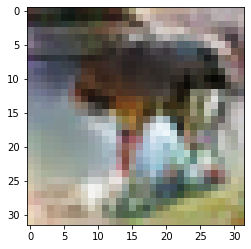

it: 15639; g_loss: 4.363306522369385; d_loss: 1.0435469150543213; avg_real_score: 0.9326791763305664; avg_fake_score: 0.024325404316186905: : 391it [00:29, 13.08it/s]


In [ ]:
nb_epochs = 15

g_losses = []
d_losses = []


nz = 100
ngf = 128
ndf = 128

nchannels= 3 
lr_d = 0.0002
lr_g = 0.0005
beta1= 0.5
display_freq = 200

netD = Discriminator(ndf, nchannels=nchannels).to(device)
netG = Generator(nz, ngf, nchannels=nchannels).to(device)

netD.apply(weights_init)
netG.apply(weights_init)

g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))
j = 0


z_test = sample_z(64, nz) # we generate the noise only once for testing

for epoch in range(nb_epochs):
    
    # train
    pbar = tqdm(enumerate(dataloader))
    for i, batch in pbar:
        im, _ = batch # we don't care about the label for unconditional generation
        im = im.to(device)
        
        cur_batch_size = im.shape[0]  
        
        # 1. sample a z vector 
        z = sample_z(cur_batch_size, nz)
        
        # 2. Generate a fake image

        fake_im = netG(z)

        # 3. Classify real image with D
        
        real_logits = netD(im)


        # 4. Classify fake image with D
       
        fake_logits = netD(fake_im.detach())
         
        ###
        ### Discriminator
        ###
        d_loss = criterion(real_logits, get_labels_one(cur_batch_size).to(device))
        d_loss = (d_loss + criterion(fake_logits, get_labels_zero(cur_batch_size).to(device)))/2
        d_opt.zero_grad()
        d_loss.backward() # we need to retain graph=True to be able to calculate the gradient in the g backprop
        d_opt.step()

        
        ###
        ### Generator
        ###
        
        fake_logits = netD(fake_im)
        g_loss = criterion(fake_logits, get_labels_one(cur_batch_size).to(device)) 
        g_opt.zero_grad()
        g_loss.backward()
        g_opt.step()
        
                
        d_losses.append(d_loss.item())
        g_losses.append(g_loss.item())
        
        avg_real_score = torch.mean(real_logits).item()
        avg_fake_score = torch.mean(fake_logits).item()


        pbar.set_description(f"it: {j}; g_loss: {g_loss}; d_loss: {d_loss}; avg_real_score: {avg_real_score}; avg_fake_score: {avg_fake_score}")
        if i % display_freq == 0:
            
            plt.plot(range(len(g_losses)), g_losses, label='g loss')
            plt.plot(range(len(g_losses)), d_losses, label='d loss')
            plt.legend()
            plt.show()  
            # fake_im = netG(z_test)
            
            # un_norm = renorm(fake_im) # for visualization
            
            # grid = torchvision.utils.make_grid(un_norm, nrow=8)
            # pil_grid = to_pil(grid)  
            
            # print("epoch", epoch, "generated images")
            # plt.imshow(pil_grid)
            # plt.show()

            for _ in z_test[:5]:
              z = _.unsqueeze(0)
              fake_im = netG(z)
              un_norm = renorm(fake_im) # for visualization
              grid = torchvision.utils.make_grid(un_norm, nrow=8)
              pil_grid = to_pil(grid)  
              plt.imshow(pil_grid)
              plt.show()
            
            
           
        j += 1

torch.Size([1, 100])


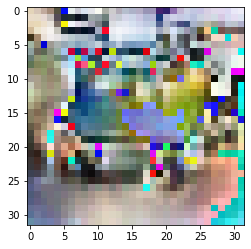

torch.Size([1, 100])


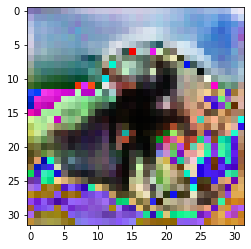

torch.Size([1, 100])


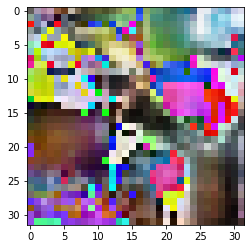

torch.Size([1, 100])


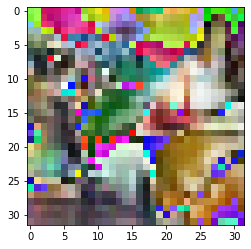

torch.Size([1, 100])


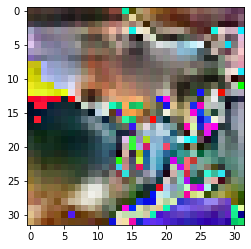

torch.Size([1, 100])


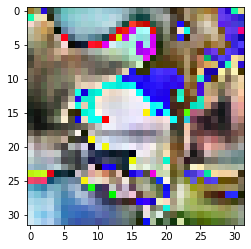

torch.Size([1, 100])


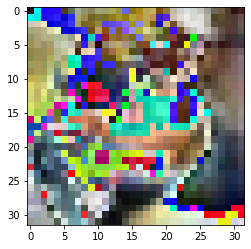

torch.Size([1, 100])


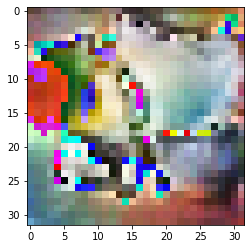

torch.Size([1, 100])


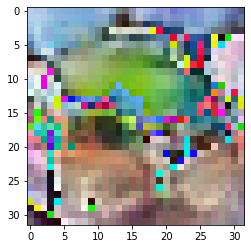

torch.Size([1, 100])


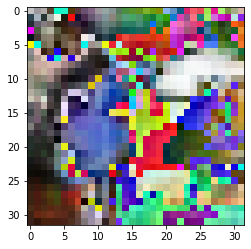

torch.Size([1, 100])


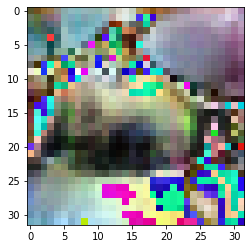

torch.Size([1, 100])


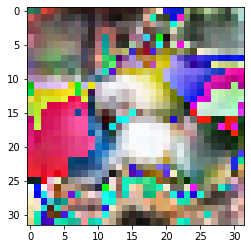

torch.Size([1, 100])


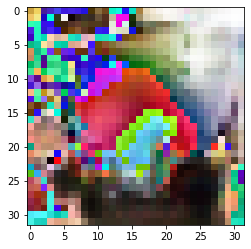

torch.Size([1, 100])


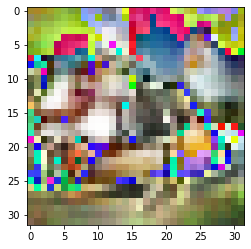

torch.Size([1, 100])


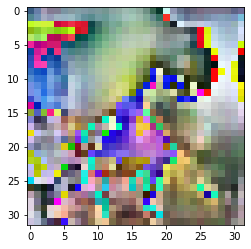

torch.Size([1, 100])


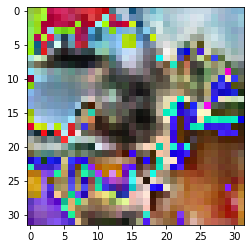

torch.Size([1, 100])


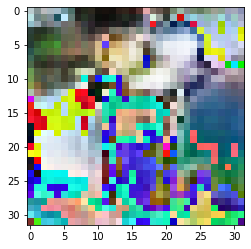

torch.Size([1, 100])


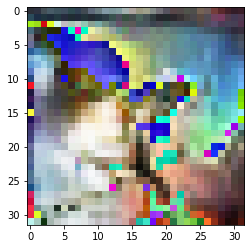

torch.Size([1, 100])


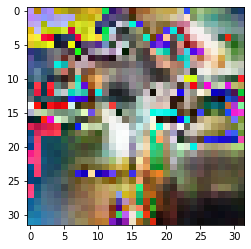

torch.Size([1, 100])


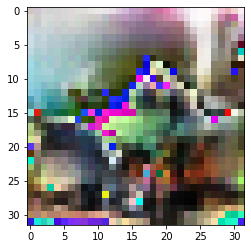

torch.Size([1, 100])


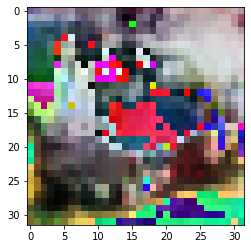

torch.Size([1, 100])


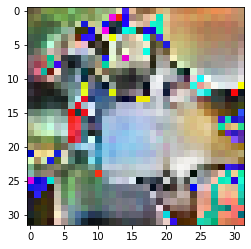

torch.Size([1, 100])


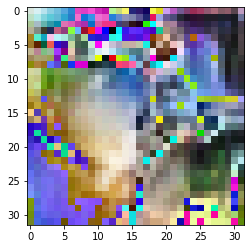

torch.Size([1, 100])


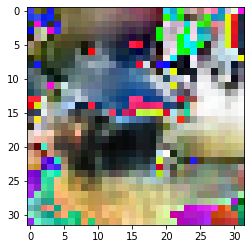

torch.Size([1, 100])


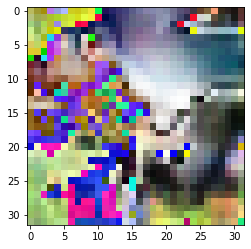

torch.Size([1, 100])


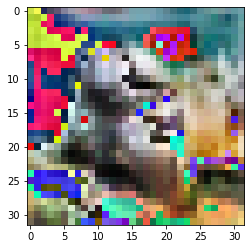

torch.Size([1, 100])


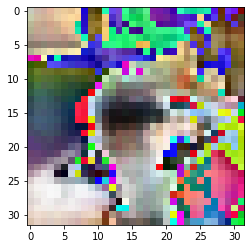

torch.Size([1, 100])


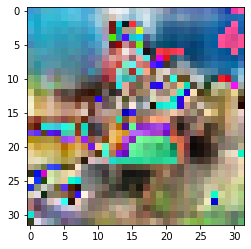

torch.Size([1, 100])


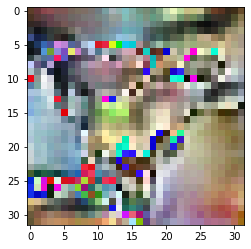

torch.Size([1, 100])


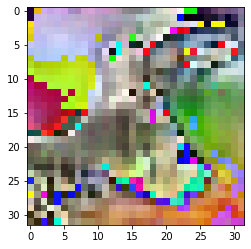

torch.Size([1, 100])


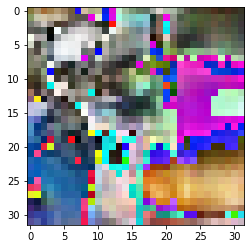

torch.Size([1, 100])


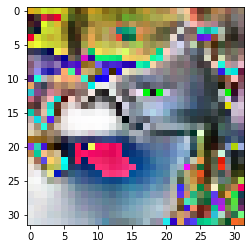

torch.Size([1, 100])


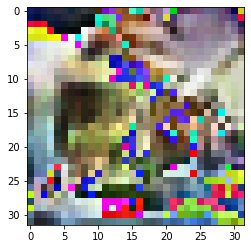

torch.Size([1, 100])


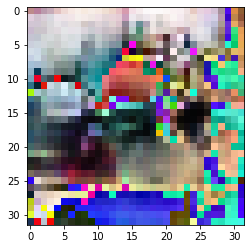

torch.Size([1, 100])


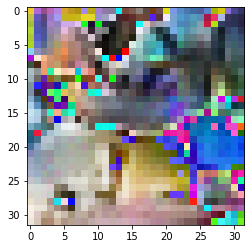

torch.Size([1, 100])


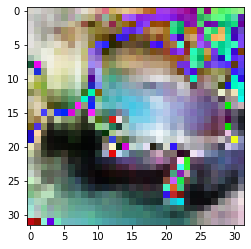

torch.Size([1, 100])


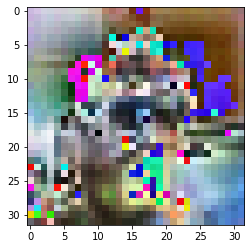

torch.Size([1, 100])


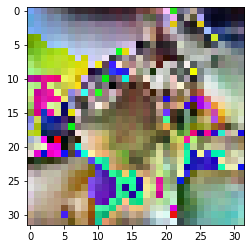

torch.Size([1, 100])


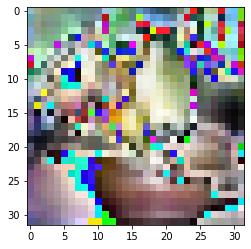

torch.Size([1, 100])


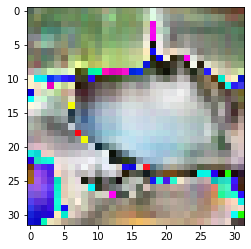

torch.Size([1, 100])


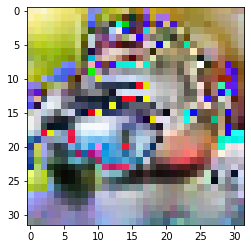

torch.Size([1, 100])


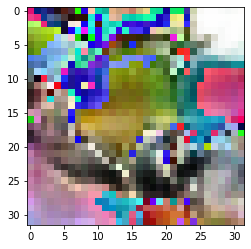

torch.Size([1, 100])


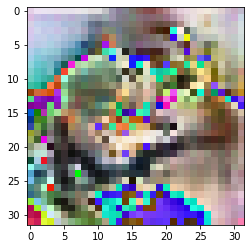

torch.Size([1, 100])


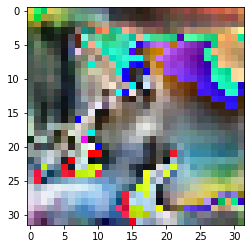

torch.Size([1, 100])


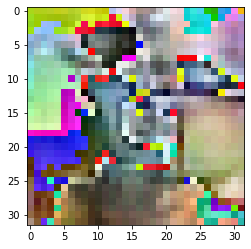

torch.Size([1, 100])


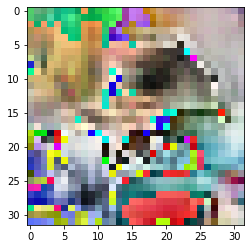

torch.Size([1, 100])


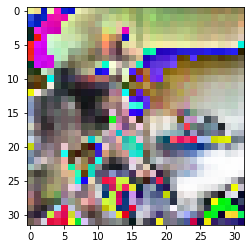

torch.Size([1, 100])


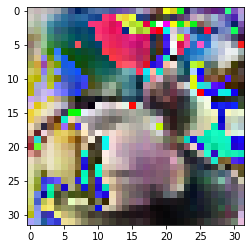

torch.Size([1, 100])


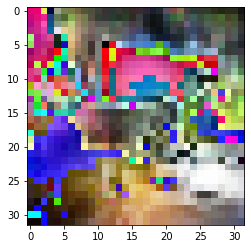

torch.Size([1, 100])


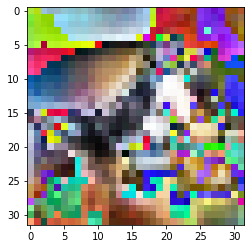

torch.Size([1, 100])


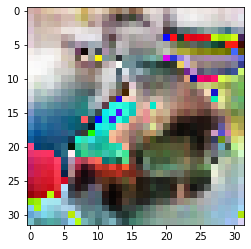

torch.Size([1, 100])


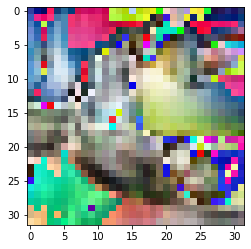

torch.Size([1, 100])


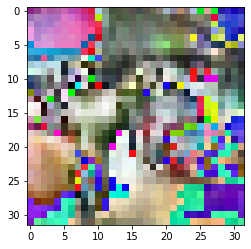

torch.Size([1, 100])


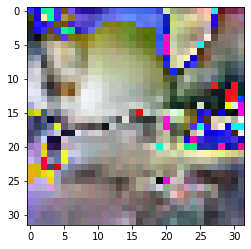

torch.Size([1, 100])


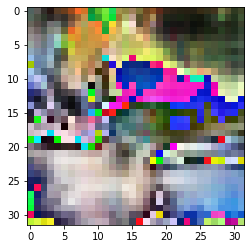

torch.Size([1, 100])


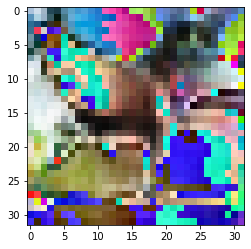

torch.Size([1, 100])


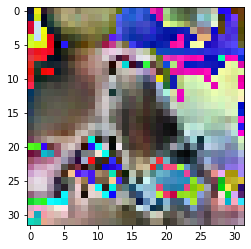

torch.Size([1, 100])


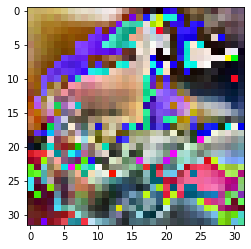

torch.Size([1, 100])


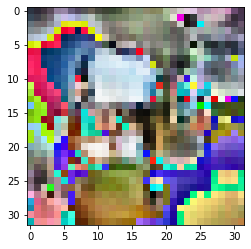

torch.Size([1, 100])


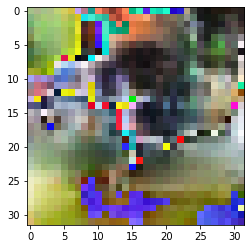

torch.Size([1, 100])


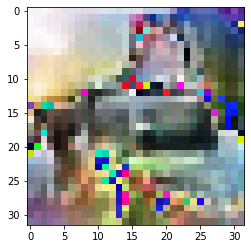

torch.Size([1, 100])


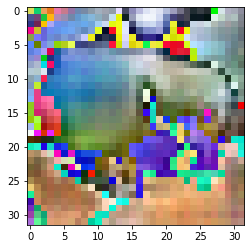

torch.Size([1, 100])


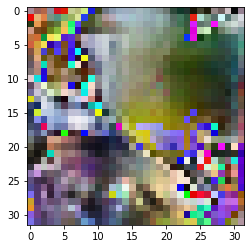

torch.Size([1, 100])


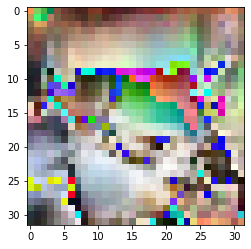

In [ ]:
for _ in z_test:
  z = _.unsqueeze(0)
  print(z.size())
  fake_im = netG(z)
  # un_norm = renorm(fake_im) # for visualization
  grid = torchvision.utils.make_grid(fake_im, nrow=8)
  pil_grid = to_pil(grid)  
  plt.imshow(pil_grid)
  plt.show()
              